In [1]:
# @hidden_cell
# The project token is an authorization token that is used to access project resources like data sources, connections, and used by platform APIs.
from project_lib import Project
project = Project(project_id='64363d5d-0aeb-4605-8c4e-1e3ef0e03732', project_access_token='p-2e6944823ec5a66f57a5aa1564bf12f58e8d384b')
pc = project.project_context


In [2]:
!pip install geocoder
!pip install folium


     |████████████████████████████████| 98 kB 4.8 MB/s eta 0:00:011
     |████████████████████████████████| 94 kB 3.5 MB/s eta 0:00:011


In [3]:

import pandas as pd
import requests
import numpy as np
import geocoder
import folium
import requests 
import matplotlib.cm as cm
import matplotlib.colors as colors
import json
import xml
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

from pandas.io.json import json_normalize 
from sklearn.cluster import KMeans
from geopy.geocoders import Nominatim 
from bs4 import BeautifulSoup

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

print("All Required Libraries Imported!")

All Required Libraries Imported!


## Extranting Data

In [4]:
df = pd.read_html('https://en.wikipedia.org/wiki/List_of_neighborhoods_in_Miami#cite_note-2')[0]
df

,Neighborhood,Demonym,Population2010,Population/Km²,Sub-neighborhoods,Coordinates
0,Allapattah,NaN,54289,4401,NaN,25.815-80.224
1,Arts & Entertainment District,NaN,11033,7948,NaN,25.799-80.190
2,Brickell,Brickellite,31759,14541,West Brickell,25.758-80.193
3,Buena Vista,NaN,9058,3540,Buena Vista East Historic District and Design ...,25.813-80.192
4,Coconut Grove,Grovite,20076,3091,"Center Grove, Northeast Coconut Grove, Southwe...",25.712-80.257
5,Coral Way,NaN,35062,4496,"Coral Gate, Golden Pines, Shenandoah, Historic...",25.750-80.283
6,Design District,NaN,3573,3623,NaN,25.813-80.193
7,Downtown,Downtowner,"71,000 (13,635 CBD only)",10613,"Brickell, Central Business District (CBD), Dow...",25.774-80.193
8,Edgewater,NaN,15005,6675,NaN,25.802-80.190
9,Flagami,NaN,50834,5665,"Alameda, Grapeland Heights, and Fairlawn",25.762-80.316


In [5]:
df.drop('Demonym', axis=1, inplace=True)

In [6]:
df.drop('Population2010', axis=1, inplace=True)


In [7]:
df.drop([25], axis=0, inplace= True)


In [8]:
df.drop([11], axis=0, inplace= True)

In [9]:
df

,Neighborhood,Population/Km²,Sub-neighborhoods,Coordinates
0,Allapattah,4401,NaN,25.815-80.224
1,Arts & Entertainment District,7948,NaN,25.799-80.190
2,Brickell,14541,West Brickell,25.758-80.193
3,Buena Vista,3540,Buena Vista East Historic District and Design ...,25.813-80.192
4,Coconut Grove,3091,"Center Grove, Northeast Coconut Grove, Southwe...",25.712-80.257
5,Coral Way,4496,"Coral Gate, Golden Pines, Shenandoah, Historic...",25.750-80.283
6,Design District,3623,NaN,25.813-80.193
7,Downtown,10613,"Brickell, Central Business District (CBD), Dow...",25.774-80.193
8,Edgewater,6675,NaN,25.802-80.190
9,Flagami,5665,"Alameda, Grapeland Heights, and Fairlawn",25.762-80.316


In [10]:
# new data frame with split value columns 
new = df["Coordinates"].str.split("-", n = 1, expand = True) 
  
# making separate first name column from new data frame 
df["Latitud"]= new[0] 
  
# making separate last name column from new data frame 
df["Longitud"]= new[1] 

In [11]:
df.drop(columns =["Coordinates"], inplace = True) 
  
# df display 
df

,Neighborhood,Population/Km²,Sub-neighborhoods,Latitud,Longitud
0,Allapattah,4401,NaN,25.815,80.224
1,Arts & Entertainment District,7948,NaN,25.799,80.190
2,Brickell,14541,West Brickell,25.758,80.193
3,Buena Vista,3540,Buena Vista East Historic District and Design ...,25.813,80.192
4,Coconut Grove,3091,"Center Grove, Northeast Coconut Grove, Southwe...",25.712,80.257
5,Coral Way,4496,"Coral Gate, Golden Pines, Shenandoah, Historic...",25.750,80.283
6,Design District,3623,NaN,25.813,80.193
7,Downtown,10613,"Brickell, Central Business District (CBD), Dow...",25.774,80.193
8,Edgewater,6675,NaN,25.802,80.190
9,Flagami,5665,"Alameda, Grapeland Heights, and Fairlawn",25.762,80.316


In [12]:
df = df.rename(columns={'Latitud': 'Latitude', 'Longitud': 'Longitude'})
df

,Neighborhood,Population/Km²,Sub-neighborhoods,Latitude,Longitude
0,Allapattah,4401,NaN,25.815,80.224
1,Arts & Entertainment District,7948,NaN,25.799,80.190
2,Brickell,14541,West Brickell,25.758,80.193
3,Buena Vista,3540,Buena Vista East Historic District and Design ...,25.813,80.192
4,Coconut Grove,3091,"Center Grove, Northeast Coconut Grove, Southwe...",25.712,80.257
5,Coral Way,4496,"Coral Gate, Golden Pines, Shenandoah, Historic...",25.750,80.283
6,Design District,3623,NaN,25.813,80.193
7,Downtown,10613,"Brickell, Central Business District (CBD), Dow...",25.774,80.193
8,Edgewater,6675,NaN,25.802,80.190
9,Flagami,5665,"Alameda, Grapeland Heights, and Fairlawn",25.762,80.316


In [13]:
df['Longitude'] = df['Longitude'].map(lambda x: x.lstrip('+-').rstrip('aAbBcC'))
df

,Neighborhood,Population/Km²,Sub-neighborhoods,Latitude,Longitude
0,Allapattah,4401,NaN,25.815,80.224
1,Arts & Entertainment District,7948,NaN,25.799,80.190
2,Brickell,14541,West Brickell,25.758,80.193
3,Buena Vista,3540,Buena Vista East Historic District and Design ...,25.813,80.192
4,Coconut Grove,3091,"Center Grove, Northeast Coconut Grove, Southwe...",25.712,80.257
5,Coral Way,4496,"Coral Gate, Golden Pines, Shenandoah, Historic...",25.750,80.283
6,Design District,3623,NaN,25.813,80.193
7,Downtown,10613,"Brickell, Central Business District (CBD), Dow...",25.774,80.193
8,Edgewater,6675,NaN,25.802,80.190
9,Flagami,5665,"Alameda, Grapeland Heights, and Fairlawn",25.762,80.316


In [14]:
df['Longitude'] = ('-' + df['Longitude'])
df

,Neighborhood,Population/Km²,Sub-neighborhoods,Latitude,Longitude
0,Allapattah,4401,NaN,25.815,-80.224
1,Arts & Entertainment District,7948,NaN,25.799,-80.190
2,Brickell,14541,West Brickell,25.758,-80.193
3,Buena Vista,3540,Buena Vista East Historic District and Design ...,25.813,-80.192
4,Coconut Grove,3091,"Center Grove, Northeast Coconut Grove, Southwe...",25.712,-80.257
5,Coral Way,4496,"Coral Gate, Golden Pines, Shenandoah, Historic...",25.750,-80.283
6,Design District,3623,NaN,25.813,-80.193
7,Downtown,10613,"Brickell, Central Business District (CBD), Dow...",25.774,-80.193
8,Edgewater,6675,NaN,25.802,-80.190
9,Flagami,5665,"Alameda, Grapeland Heights, and Fairlawn",25.762,-80.316


## Ploting the different points in a map using Folium library

In [15]:
address = 'Miami, Florida'

geolocator = Nominatim(user_agent="TO_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Miami are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Miami are 25.7741728, -80.19362.


In [349]:
map_miami = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, neighbourhood in zip(df['Latitude'], df['Longitude'], df['Neighborhood']):
    label = '{}'.format(neighbourhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        
        parse_html=False).add_to(map_miami)  

    
map_miami

In [17]:
CLIENT_ID = 'Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G' # your Foursquare ID
CLIENT_SECRET = 'ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G
CLIENT_SECRET:ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13


In [18]:
neighborhood_latitude = df.loc[2, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = df.loc[2, 'Longitude'] # neighborhood longitude value

neighborhood_name = df.loc[2, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Brickell are 25.758, -80.193.


In [19]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 500 # define radius
# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180605&ll=25.758,-80.193&radius=500&limit=100'

In [20]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '6029b86af3484c1e42b3791a'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'},
    {'name': '$-$$$$', 'key': 'price'}]},
  'headerLocation': 'Coral Way',
  'headerFullLocation': 'Coral Way, Miami',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 52,
  'suggestedBounds': {'ne': {'lat': 25.762500004500005,
    'lng': -80.18801286352735},
   'sw': {'lat': 25.753499995499993, 'lng': -80.19798713647265}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4b069b0ff964a520a6ed22e3',
       'name': 'Four Seasons Hotel Miami',
       'location': {'address': '1435 Brickell Ave',
        'crossStreet': 'at SE 14th Terr',
        'lat': 25.75907805851922,
        'lng

In [21]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [22]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()['response']['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],
            v['venue']['categories'][0]['name'],
            v['venue']['id'],
           ) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category', 'id']
    
    return(nearby_venues)


In [353]:
miami_venues = getNearbyVenues(names=df['Neighborhood'],
                                   latitudes=df['Latitude'],
                                   longitudes=df['Longitude'],
                                                             )


Allapattah
Arts & Entertainment District
Brickell
Buena Vista
Coconut Grove
Coral Way
Design District
Downtown
Edgewater
Flagami
Grapeland Heights
Liberty City
Little Haiti
Little Havana
Lummus Park
Midtown
Overtown
Park West
The Roads
Upper Eastside
Venetian Islands
Virginia Key
West Flagler
Wynwood


In [354]:
print(miami_venues.shape)
miami_venues.head()

(505, 8)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,id
0,Allapattah,25.815,-80.224,Showtime Boxing Gym,25.812364,-80.224504,Boxing Gym,4f107352e4b0297e5524a50d
1,Arts & Entertainment District,25.799,-80.190,Bunnie Cakes,25.799544,-80.190953,Cupcake Shop,4c6aacfc1a6620a194aa668c
2,Arts & Entertainment District,25.799,-80.190,Yodi's Threading Spa,25.800490,-80.189093,Spa,50005acde4b02f063c3bdc34
3,Arts & Entertainment District,25.799,-80.190,Plant Food + Wine Miami,25.800452,-80.192805,Restaurant,56cc756acd108dd0335eeccb
4,Arts & Entertainment District,25.799,-80.190,Staples,25.797447,-80.188860,Paper / Office Supplies Store,4b8d24d2f964a52019ea32e3


In [25]:
miami_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,id
Neighborhood,,,,,,,
Arts & Entertainment District,19,19,19,19,19,19,19
Brickell,52,52,52,52,52,52,52
Buena Vista,39,39,39,39,39,39,39
Coconut Grove,2,2,2,2,2,2,2
Coral Way,10,10,10,10,10,10,10
Design District,38,38,38,38,38,38,38
Downtown,51,51,51,51,51,51,51
Edgewater,45,45,45,45,45,45,45
Flagami,11,11,11,11,11,11,11


In [26]:
miami_onehot = pd.get_dummies(miami_venues[['Venue Category']], prefix="", prefix_sep="")
miami_onehot
miami_onehot['Neighborhood'] = miami_venues['Neighborhood'] 
miami_onehot


,American Restaurant,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Asian Restaurant,Athletics & Sports,Auto Garage,Bakery,Bank,Bar,Baseball Stadium,Beach,Big Box Store,Bistro,Boat or Ferry,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Burger Joint,Bus Station,Café,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Cuban Restaurant,Cupcake Shop,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Eastern European Restaurant,Empanada Restaurant,Event Space,Farmers Market,Fast Food Restaurant,Fish Market,Flea Market,Food,Food Service,Food Truck,French Restaurant,Frozen Yogurt Shop,Furniture / Home Store,Gas Station,Gastropub,Gift Shop,Gluten-free Restaurant,Golf Course,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Harbor / Marina,Health & Beauty Service,Home Service,Hotel,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Latin American Restaurant,Lawyer,Leather Goods Store,Liquor Store,Lounge,Martial Arts School,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Mobile Phone Shop,Monument / Landmark,Motel,Moving Target,Museum,Neighborhood,New American Restaurant,Nightclub,Optical Shop,Paper / Office Supplies Store,Park,Performing Arts Venue,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pilates Studio,Pizza Place,Playground,Pub,Public Art,Record Shop,Residential Building (Apartment / Condo),Resort,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Soccer Field,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Sporting Goods Shop,Steakhouse,Sushi Restaurant,Taco Place,Tapas Restaurant,Tennis Court,Theater,Thrift / Vintage Store,Vegetarian / Vegan Restaurant,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [27]:
mid = miami_onehot['Neighborhood']
miami_onehot.drop(labels=['Neighborhood'], axis=1, inplace = True)
miami_onehot.insert(0, 'Neighborhood', mid)
miami_onehot

,Neighborhood,American Restaurant,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Asian Restaurant,Athletics & Sports,Auto Garage,Bakery,Bank,Bar,Baseball Stadium,Beach,Big Box Store,Bistro,Boat or Ferry,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Burger Joint,Bus Station,Café,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Cuban Restaurant,Cupcake Shop,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Eastern European Restaurant,Empanada Restaurant,Event Space,Farmers Market,Fast Food Restaurant,Fish Market,Flea Market,Food,Food Service,Food Truck,French Restaurant,Frozen Yogurt Shop,Furniture / Home Store,Gas Station,Gastropub,Gift Shop,Gluten-free Restaurant,Golf Course,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Harbor / Marina,Health & Beauty Service,Home Service,Hotel,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Latin American Restaurant,Lawyer,Leather Goods Store,Liquor Store,Lounge,Martial Arts School,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Mobile Phone Shop,Monument / Landmark,Motel,Moving Target,Museum,New American Restaurant,Nightclub,Optical Shop,Paper / Office Supplies Store,Park,Performing Arts Venue,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pilates Studio,Pizza Place,Playground,Pub,Public Art,Record Shop,Residential Building (Apartment / Condo),Resort,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Soccer Field,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Sporting Goods Shop,Steakhouse,Sushi Restaurant,Taco Place,Tapas Restaurant,Tennis Court,Theater,Thrift / Vintage Store,Vegetarian / Vegan Restaurant,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio
0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [28]:

# one hot encoding
miami_onehot = pd.get_dummies(miami_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
miami_onehot['Neighborhood'] = miami_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [miami_onehot.columns[-1]] + list(miami_onehot.columns[:-1])
miami_onehot = miami_onehot[fixed_columns]

miami_onehot.head()

,Yoga Studio,American Restaurant,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Asian Restaurant,Athletics & Sports,Auto Garage,Bakery,Bank,Bar,Baseball Stadium,Beach,Big Box Store,Bistro,Boat or Ferry,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Burger Joint,Bus Station,Café,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Cuban Restaurant,Cupcake Shop,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Eastern European Restaurant,Empanada Restaurant,Event Space,Farmers Market,Fast Food Restaurant,Fish Market,Flea Market,Food,Food Service,Food Truck,French Restaurant,Frozen Yogurt Shop,Furniture / Home Store,Gas Station,Gastropub,Gift Shop,Gluten-free Restaurant,Golf Course,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Harbor / Marina,Health & Beauty Service,Home Service,Hotel,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Latin American Restaurant,Lawyer,Leather Goods Store,Liquor Store,Lounge,Martial Arts School,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Mobile Phone Shop,Monument / Landmark,Motel,Moving Target,Museum,Neighborhood,New American Restaurant,Nightclub,Optical Shop,Paper / Office Supplies Store,Park,Performing Arts Venue,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pilates Studio,Pizza Place,Playground,Pub,Public Art,Record Shop,Residential Building (Apartment / Condo),Resort,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Soccer Field,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Sporting Goods Shop,Steakhouse,Sushi Restaurant,Taco Place,Tapas Restaurant,Tennis Court,Theater,Thrift / Vintage Store,Vegetarian / Vegan Restaurant,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [29]:
miami_onehot.head()

,Yoga Studio,American Restaurant,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Asian Restaurant,Athletics & Sports,Auto Garage,Bakery,Bank,Bar,Baseball Stadium,Beach,Big Box Store,Bistro,Boat or Ferry,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Burger Joint,Bus Station,Café,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Cuban Restaurant,Cupcake Shop,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Eastern European Restaurant,Empanada Restaurant,Event Space,Farmers Market,Fast Food Restaurant,Fish Market,Flea Market,Food,Food Service,Food Truck,French Restaurant,Frozen Yogurt Shop,Furniture / Home Store,Gas Station,Gastropub,Gift Shop,Gluten-free Restaurant,Golf Course,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Harbor / Marina,Health & Beauty Service,Home Service,Hotel,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Latin American Restaurant,Lawyer,Leather Goods Store,Liquor Store,Lounge,Martial Arts School,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Mobile Phone Shop,Monument / Landmark,Motel,Moving Target,Museum,Neighborhood,New American Restaurant,Nightclub,Optical Shop,Paper / Office Supplies Store,Park,Performing Arts Venue,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pilates Studio,Pizza Place,Playground,Pub,Public Art,Record Shop,Residential Building (Apartment / Condo),Resort,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Soccer Field,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Sporting Goods Shop,Steakhouse,Sushi Restaurant,Taco Place,Tapas Restaurant,Tennis Court,Theater,Thrift / Vintage Store,Vegetarian / Vegan Restaurant,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Arts & Entertainment District,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [30]:
miami_grouped = miami_onehot.groupby('Neighborhood').mean().reset_index()
miami_grouped

,Neighborhood,Yoga Studio,American Restaurant,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Asian Restaurant,Athletics & Sports,Auto Garage,Bakery,Bank,Bar,Baseball Stadium,Beach,Big Box Store,Bistro,Boat or Ferry,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Burger Joint,Bus Station,Café,Caribbean Restaurant,Chinese Restaurant,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Cuban Restaurant,Cupcake Shop,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Eastern European Restaurant,Empanada Restaurant,Event Space,Farmers Market,Fast Food Restaurant,Fish Market,Flea Market,Food,Food Service,Food Truck,French Restaurant,Frozen Yogurt Shop,Furniture / Home Store,Gas Station,Gastropub,Gift Shop,Gluten-free Restaurant,Golf Course,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Harbor / Marina,Health & Beauty Service,Home Service,Hotel,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Latin American Restaurant,Lawyer,Leather Goods Store,Liquor Store,Lounge,Martial Arts School,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Mobile Phone Shop,Monument / Landmark,Motel,Moving Target,Museum,New American Restaurant,Nightclub,Optical Shop,Paper / Office Supplies Store,Park,Performing Arts Venue,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pilates Studio,Pizza Place,Playground,Pub,Public Art,Record Shop,Residential Building (Apartment / Condo),Resort,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Soccer Field,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Sporting Goods Shop,Steakhouse,Sushi Restaurant,Taco Place,Tapas Restaurant,Tennis Court,Theater,Thrift / Vintage Store,Vegetarian / Vegan Restaurant,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store
0,Arts & Entertainment District,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.052632,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.052632,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.052632,0.000000,0.000000,0.000000,0.000000,0.052632,0.000000,0.000000,0.000000,0.000000,0.052632,0.052632,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.052632,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.052632,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.105263,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.052632,0.052632,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.052632,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.105263,0.000000,0.052632,0.052632,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.00,0.000000,0.052632,0.000000,0.000000,0.000000,0.000000,0.000000,0.052632,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.0,0.000000
1,Brickell,0.000000,0.038462,0.000000,0.000000,0.000000,0.038462,0.000000,0.000000,0.000000,0.019231,0.000000,0.000000,0.038462,0.038462,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.038462,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.019231,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.019231,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.019231,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.019231,0.019231,0.000,0.000000,0.096154,0.019231,0.000000,0.000000,0.00,0.000000,0.076923,0.057692,0.000000,0.038

In [31]:
num_top_venues = 5

for hood in miami_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = miami_grouped[miami_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Arts & Entertainment District----
            venue  freq
0  Ice Cream Shop  0.11
1      Restaurant  0.11
2             Gym  0.05
3      Food Truck  0.05
4  Sandwich Place  0.05


----Brickell----
                 venue  freq
0                Hotel  0.10
1   Italian Restaurant  0.08
2  Japanese Restaurant  0.06
3  American Restaurant  0.04
4                 Café  0.04


----Buena Vista----
                venue  freq
0                Café  0.08
1       Jewelry Store  0.05
2  Italian Restaurant  0.05
3            Boutique  0.05
4         Art Gallery  0.05


----Coconut Grove----
                 venue  freq
0        Boat or Ferry   0.5
1                 Park   0.5
2            Nightclub   0.0
3    Mobile Phone Shop   0.0
4  Monument / Landmark   0.0


----Coral Way----
               venue  freq
0       Liquor Store   0.2
1  Mobile Phone Shop   0.1
2        Golf Course   0.1
3           Dive Bar   0.1
4               Café   0.1


----Design District----
            venue  freq
0    

In [32]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [363]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = miami_grouped['Neighborhood']

for ind in np.arange(miami_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(miami_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Arts & Entertainment District,Ice Cream Shop,Restaurant,Coffee Shop,Spa,Food Truck,Cupcake Shop,Cuban Restaurant,Paper / Office Supplies Store,Park,Pizza Place
1,Brickell,Hotel,Italian Restaurant,Japanese Restaurant,Café,Juice Bar,Restaurant,Bar,Bank,Salon / Barbershop,Sandwich Place
2,Buena Vista,Café,Coffee Shop,Boutique,Italian Restaurant,Jewelry Store,Art Gallery,Clothing Store,Leather Goods Store,Chinese Restaurant,Furniture / Home Store
3,Coconut Grove,Boat or Ferry,Park,Donut Shop,Fish Market,Fast Food Restaurant,Farmers Market,Event Space,Empanada Restaurant,Eastern European Restaurant,Women's Store
4,Coral Way,Liquor Store,Pharmacy,Mobile Phone Shop,Monument / Landmark,Golf Course,Burger Joint,Dive Bar,Food Truck,Café,Eastern European Restaurant
5,Design District,Café,Boutique,Italian Restaurant,Jewelry Store,Coffee Shop,Art Gallery,Clothing Store,Cocktail Bar,Shopping Mall,Chinese Restaurant
6,Downtown,Peruvian Restaurant,Hotel,Lounge,Cocktail Bar,Italian Restaurant,New American Restaurant,Coffee Shop,Pharmacy,Brazilian Restaurant,Chinese Restaurant
7,Edgewater,Restaurant,Coffee Shop,Sandwich Place,Cuban Restaurant,Gym,Food Truck,Pizza Place,Art Gallery,Greek Restaurant,Breakfast Spot
8,Flagami,Pet Store,Bakery,Seafood Restaurant,Department Store,Food,Fast Food Restaurant,Latin American Restaurant,Spanish Restaurant,Cupcake Shop,Eastern European Restaurant
9,Grapeland Heights,Lounge,Gym / Fitness Center,Hotel,Hotel Pool,Bus Station,Golf Course,Restaurant,Auto Garage,Bar,Eastern European Restaurant


## Clustering Neighborhoods

In [344]:
# set number of clusters
kclusters = 4


miami_grouped_clustering = miami_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(miami_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0], dtype=int32)

In [336]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

ValueError: cannot insert Cluster Labels, already exists

In [337]:
miami_merged = df


In [338]:
miami_merged = miami_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
miami_merged.head()

,Neighborhood,Population/Km²,Sub-neighborhoods,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allapattah,4401,NaN,25.815,-80.224,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arts & Entertainment District,7948,NaN,25.799,-80.190,0.0,Ice Cream Shop,Restaurant,Coffee Shop,Spa,Food Truck,Cupcake Shop,Cuban Restaurant,Paper / Office Supplies Store,Park,Pizza Place
2,Brickell,14541,West Brickell,25.758,-80.193,0.0,Hotel,Italian Restaurant,Japanese Restaurant,Café,Juice Bar,Restaurant,Bar,Bank,Salon / Barbershop,Sandwich Place
3,Buena Vista,3540,Buena Vista East Historic District and Design ...,25.813,-80.192,0.0,Café,Coffee Shop,Boutique,Italian Restaurant,Jewelry Store,Art Gallery,Clothing Store,Leather Goods Store,Chinese Restaurant,Furniture / Home Store
4,Coconut Grove,3091,"Center Grove, Northeast Coconut Grove, Southwe...",25.712,-80.257,2.0,Boat or Ferry,Park,Donut Shop,Fish Market,Fast Food Restaurant,Farmers Market,Event Space,Empanada Restaurant,Eastern European Restaurant,Women's Store


In [346]:
miami_merged.shape
miami_merged = miami_merged.dropna(axis='rows')
miami_merged['Cluster Labels'] = miami_merged['Cluster Labels'].astype(int)
miami_merged

,Neighborhood,Population/Km²,Sub-neighborhoods,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,Brickell,14541,West Brickell,25.758,-80.193,0,Hotel,Italian Restaurant,Japanese Restaurant,Café,Juice Bar,Restaurant,Bar,Bank,Salon / Barbershop,Sandwich Place
3,Buena Vista,3540,Buena Vista East Historic District and Design ...,25.813,-80.192,0,Café,Coffee Shop,Boutique,Italian Restaurant,Jewelry Store,Art Gallery,Clothing Store,Leather Goods Store,Chinese Restaurant,Furniture / Home Store
4,Coconut Grove,3091,"Center Grove, Northeast Coconut Grove, Southwe...",25.712,-80.257,2,Boat or Ferry,Park,Donut Shop,Fish Market,Fast Food Restaurant,Farmers Market,Event Space,Empanada Restaurant,Eastern European Restaurant,Women's Store
5,Coral Way,4496,"Coral Gate, Golden Pines, Shenandoah, Historic...",25.750,-80.283,0,Liquor Store,Pharmacy,Mobile Phone Shop,Monument / Landmark,Golf Course,Burger Joint,Dive Bar,Food Truck,Café,Eastern European Restaurant
7,Downtown,10613,"Brickell, Central Business District (CBD), Dow...",25.774,-80.193,0,Peruvian Restaurant,Hotel,Lounge,Cocktail Bar,Italian Restaurant,New American Restaurant,Coffee Shop,Pharmacy,Brazilian Restaurant,Chinese Restaurant
9,Flagami,5665,"Alameda, Grapeland Heights, and Fairlawn",25.762,-80.316,0,Pet Store,Bakery,Seafood Restaurant,Department Store,Food,Fast Food Restaurant,Latin American Restaurant,Spanish Restaurant,Cupcake Shop,Eastern European Restaurant
13,Little Haiti,3840,Lemon City (aka Little River),25.824,-80.191,0,Home Service,Shopping Mall,Pub,Pizza Place,Pilates Studio,Pharmacy,New American Restaurant,Italian Restaurant,Ice Cream Shop,Gym
14,Little Havana,8423,Riverside and South River Drive Historic District,25.773,-80.215,0,Latin American Restaurant,Pharmacy,Shoe Store,Grocery Store,Mexican Restaurant,Discount Store,Donut Shop,Event Space,Empanada Restaurant,Eastern European Restaurant
16,Midtown,-,Edgewater and Wynwood,25.807,-80.193,0,Italian Restaurant,Coffee Shop,Restaurant,Pizza Place,Gym / Fitness Center,Peruvian Restaurant,Mobile Phone Shop,Breakfast Spot,Pharmacy,Pet Store
17,Overtown,3405,Spring Garden,25.787,-80.201,0,Wings Joint,Farmers Market,Southern / Soul Food Restaurant,Baseball Stadium,Athletics & Sports,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop


In [342]:
miami_merged.head()
miami_merged.shape

(24, 16)

In [347]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(miami_merged['Latitude'], miami_merged['Longitude'], miami_merged['Neighborhood'], miami_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [311]:
miami_merged.loc[miami_merged['Cluster Labels'] == 0, miami_merged.columns[[0] + list(range(3, miami_merged.shape[1]))]]

,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Arts & Entertainment District,25.799,-80.190,0.0,Ice Cream Shop,Restaurant,Coffee Shop,Spa,Food Truck,Cupcake Shop,Cuban Restaurant,Paper / Office Supplies Store,Park,Pizza Place
2,Brickell,25.758,-80.193,0.0,Hotel,Italian Restaurant,Japanese Restaurant,Café,Juice Bar,Restaurant,Bar,Bank,Salon / Barbershop,Sandwich Place
3,Buena Vista,25.813,-80.192,0.0,Café,Coffee Shop,Boutique,Italian Restaurant,Jewelry Store,Art Gallery,Clothing Store,Leather Goods Store,Chinese Restaurant,Furniture / Home Store
5,Coral Way,25.750,-80.283,0.0,Liquor Store,Pharmacy,Mobile Phone Shop,Monument / Landmark,Golf Course,Burger Joint,Dive Bar,Food Truck,Café,Eastern European Restaurant
6,Design District,25.813,-80.193,0.0,Café,Boutique,Italian Restaurant,Jewelry Store,Coffee Shop,Art Gallery,Clothing Store,Cocktail Bar,Shopping Mall,Chinese Restaurant
7,Downtown,25.774,-80.193,0.0,Peruvian Restaurant,Hotel,Lounge,Cocktail Bar,Italian Restaurant,New American Restaurant,Coffee Shop,Pharmacy,Brazilian Restaurant,Chinese Restaurant
8,Edgewater,25.802,-80.190,0.0,Restaurant,Coffee Shop,Sandwich Place,Cuban Restaurant,Gym,Food Truck,Pizza Place,Art Gallery,Greek Restaurant,Breakfast Spot
9,Flagami,25.762,-80.316,0.0,Pet Store,Bakery,Seafood Restaurant,Department Store,Food,Fast Food Restaurant,Latin American Restaurant,Spanish Restaurant,Cupcake Shop,Eastern European Restaurant
10,Grapeland Heights,25.792,-80.258,0.0,Lounge,Gym / Fitness Center,Hotel,Hotel Pool,Bus Station,Golf Course,Restaurant,Auto Garage,Bar,Eastern European Restaurant
12,Liberty City,25.832,-80.225,0.0,Southern / Soul Food Restaurant,Bar,Food,Women's Store,Eastern European Restaurant,Fish Market,Fast Food Restaurant,Farmers Market,Event Space,Empanada Restaurant


In [365]:
miami_merged.loc[miami_merged['Cluster Labels'] == 1, miami_merged.columns[[0] + list(range(3, miami_merged.shape[1]))]]

,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue


In [366]:
miami_merged.loc[miami_merged['Cluster Labels'] == 2, miami_merged.columns[[0] + list(range(3, miami_merged.shape[1]))]]

,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,Coconut Grove,25.712,-80.257,2,Boat or Ferry,Park,Donut Shop,Fish Market,Fast Food Restaurant,Farmers Market,Event Space,Empanada Restaurant,Eastern European Restaurant,Women's Store


In [367]:
miami_merged.loc[miami_merged['Cluster Labels'] == 3, miami_merged.columns[[0] + list(range(3, miami_merged.shape[1]))]]

,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue


In [44]:
!wget -O rent.csv https://jupyterlab-0.labs.cognitiveclass.ai/user/luisafdaavil/files/labs/DS0701EN/rent.csv?_xsrf=2%7C67059c4f%7C5086c7bbb5b2fffcbb9a591d5dab596e%7C1611534630

--2021-02-14 23:55:34--  https://jupyterlab-0.labs.cognitiveclass.ai/user/luisafdaavil/files/labs/DS0701EN/rent.csv?_xsrf=2%7C67059c4f%7C5086c7bbb5b2fffcbb9a591d5dab596e%7C1611534630
Resolving jupyterlab-0.labs.cognitiveclass.ai (jupyterlab-0.labs.cognitiveclass.ai)... 158.85.101.138
Connecting to jupyterlab-0.labs.cognitiveclass.ai (jupyterlab-0.labs.cognitiveclass.ai)|158.85.101.138|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /hub/user/luisafdaavil/files/labs/DS0701EN/rent.csv?_xsrf=2%7C67059c4f%7C5086c7bbb5b2fffcbb9a591d5dab596e%7C1611534630 [following]
--2021-02-14 23:55:35--  https://jupyterlab-0.labs.cognitiveclass.ai/hub/user/luisafdaavil/files/labs/DS0701EN/rent.csv?_xsrf=2%7C67059c4f%7C5086c7bbb5b2fffcbb9a591d5dab596e%7C1611534630
Reusing existing connection to jupyterlab-0.labs.cognitiveclass.ai:443.
HTTP request sent, awaiting response... 302 Found
Location: /hub/login?next=%2Fhub%2Fuser%2Fluisafdaavil%2Ffiles%2Flabs%2FDS0701EN%2Frent.csv%3

In [45]:
path = 'https://jupyterlab-0.labs.cognitiveclass.ai/user/luisafdaavil/files/labs/DS0701EN/rent.csv?_xsrf=2%7C67059c4f%7C5086c7bbb5b2fffcbb9a591d5dab596e%7C1611534630'

In [46]:
path2= 'https://jupyterlab-0.labs.cognitiveclass.ai/user/luisafdaavil/files/labs/DS0701EN/rent.txt?_xsrf=2%7C67059c4f%7C5086c7bbb5b2fffcbb9a591d5dab596e%7C1611534630'

In [47]:
!pip install xlrd

In [48]:
# @hidden_cell
# The following code contains the credentials for a file in your IBM Cloud Object Storage.
# You might want to remove those credentials before you share your notebook.
credentials_1 = {
    'IAM_SERVICE_ID': 'iam-ServiceId-41c1572f-e997-485d-ad99-b6f61f360a9a',
    'IBM_API_KEY_ID': 'Hq5QkB9Er_bzt8prkE1re8F8rGesWrkMXA9spgiKTU8R',
    'ENDPOINT': 'https://s3-api.us-geo.objectstorage.service.networklayer.com',
    'IBM_AUTH_ENDPOINT': 'https://iam.cloud.ibm.com/oidc/token',
    'BUCKET': 'capstoneprojectcourse-donotdelete-pr-fbwcf1jxtlqshr',
    'FILE': 'rent.csv'
}

In [49]:

import types
import pandas as pd
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.
client_1bd379f342814a319dfa5c6422708b66 = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='Hq5QkB9Er_bzt8prkE1re8F8rGesWrkMXA9spgiKTU8R',
    ibm_auth_endpoint="https://iam.cloud.ibm.com/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url='https://s3-api.us-geo.objectstorage.service.networklayer.com')

body = client_1bd379f342814a319dfa5c6422708b66.get_object(Bucket='capstoneprojectcourse-donotdelete-pr-fbwcf1jxtlqshr',Key='rent.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_1 = pd.read_csv(body)
df_data_1


,Unnamed: 0,Neighborhood,Rent
0,1,Allapattah,"$1,577"
1,2,Arts & Entertainment District,"$1,900"
2,3,Brickell,"$2,196"
3,4,Buena Vista,"$2,122"
4,5,Coconut Grove,"$2,500"
5,6,Coral Way,"$1,669"
6,7,Design District,"$2,122"
7,8,Downtown,"$1,850"
8,9,Edgewater,"$1,970"
9,10,Flagami,"$1,300"


In [81]:
df_data_1.drop(df_data_1.columns[0],  axis=1, inplace = True)


In [90]:
df_data_1.to_csv('rent.csv', index=False)


In [91]:
rent=pd.read_csv('rent.csv')

In [92]:
rent

,Neighborhood,Rent
0,Allapattah,"$1,577"
1,Arts & Entertainment District,"$1,900"
2,Brickell,"$2,196"
3,Buena Vista,"$2,122"
4,Coconut Grove,"$2,500"
5,Coral Way,"$1,669"
6,Design District,"$2,122"
7,Downtown,"$1,850"
8,Edgewater,"$1,970"
9,Flagami,"$1,300"


In [93]:
print('There are {} uniques categories.'.format(len(manhattan_venues['Venue Category'].unique())))

Neighborhood    object
Rent            object
dtype: object


In [360]:
print('There are {} uniques categories.'.format(len(miami_venues['Venue Category'].unique())))


There are 139 uniques categories.


In [ ]:
CLIENT_ID = 'Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G' # your Foursquare ID
CLIENT_SECRET = 'ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13' # your Foursquare Secret
ACCESS_TOKEN = '1G5AKHIERYLTOE1Q1CIJMDNVUBBPK0G1R3DD21REGSFEUI1H' # your FourSquare Access Token
VERSION = '20180604'
LIMIT = 30
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

In [72]:
miami_venues1=miami_venues

In [73]:
miami_venues1.shape

(510, 3)

In [54]:
miami_venues1.drop(columns =['Neighborhood Latitude'], inplace = True) 

In [56]:
miami_venues1.drop(columns =['Neighborhood Longitude'], inplace = True) 

In [57]:
miami_venues1.drop(columns =['Venue Latitude'], inplace = True) 

In [58]:
miami_venues1.drop(columns =['Venue Longitude'], inplace = True) 

In [59]:
miami_venues1.drop(columns =['Venue Category'], inplace = True) 

In [60]:
miami_venues1.head()


,Neighborhood,Venue,id
0,Arts & Entertainment District,Bunnie Cakes,4c6aacfc1a6620a194aa668c
1,Arts & Entertainment District,Yodi's Threading Spa,50005acde4b02f063c3bdc34
2,Arts & Entertainment District,Plant Food + Wine Miami,56cc756acd108dd0335eeccb
3,Arts & Entertainment District,Staples,4b8d24d2f964a52019ea32e3
4,Arts & Entertainment District,The Daily Creative Food Co. - Miami,4af1ca0cf964a52033e321e3


In [61]:
miami_venues1 = miami_venues1.rename(columns={'id': 'ID'})

In [62]:
miami_venues1.head()

,Neighborhood,Venue,ID
0,Arts & Entertainment District,Bunnie Cakes,4c6aacfc1a6620a194aa668c
1,Arts & Entertainment District,Yodi's Threading Spa,50005acde4b02f063c3bdc34
2,Arts & Entertainment District,Plant Food + Wine Miami,56cc756acd108dd0335eeccb
3,Arts & Entertainment District,Staples,4b8d24d2f964a52019ea32e3
4,Arts & Entertainment District,The Daily Creative Food Co. - Miami,4af1ca0cf964a52033e321e3


In [63]:
def get_venue_details(venue_id):
    
    CLIENT_ID = 'Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G' # your Foursquare ID
    CLIENT_SECRET = 'ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13' # your Foursquare Secret
    ACCESS_TOKEN = '1G5AKHIERYLTOE1Q1CIJMDNVUBBPK0G1R3DD21REGSFEUI1H' # your FourSquare Access Token
    VERSION = '20180604'


    #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/{}?&client_id={}&client_secret={}&v={}'.format(
        venue_id,
        CLIENT_ID,
        CLIENT_SECRET,
        VERSION)
    print (url)

    # get all the data
    results = requests.get(url).json()
    print(results)
    if(results['meta']['code']==200):
        venue_data=results['response']['venue']
        venue_details=[]
        try:
            venue_id=venue_data['id']
            venue_name=venue_data['name']
            venue_rating=venue_data['rating']
            venue_details.append([venue_id,venue_name,venue_rating])
        except KeyError:
            pass

        column_names=['ID','Name','Raiting']
        detail = pd.DataFrame(venue_details,columns=column_names)
        return detail

In [64]:
column_names=['Neighborhood','ID','Name','Raiting']
venue_stats_mia=pd.DataFrame(columns=column_names)
count=1
print("hi")
for row in miami_venues1.values.tolist():
    Neighborhood,Venue,ID=row
    try:
        print("inside try")
        venue_details=get_venue_details(ID)
        print(venue_details)
        if venue_details is not None:
            id,name,rating=venue_details.values.tolist()[0]
    except IndexError:
        print('No data available for id=',ID)
        # we will assign 0 value for these resturants as they may have been
        #recently opened or details does not exist in FourSquare Database
        id,name,likes,rating,tips=[0]*5
    print('(',count,'/',len(miami_venues1),')','processed')
    venue_stats_mia = venue_stats_mia.append({'Neighborhood': Neighborhood,
                                                    'ID': id,
                                                    'Name' : name,
                                                    'Rating' : rating,
                                                }, ignore_index=True)
    count+=1

hi
inside try
https://api.foursquare.com/v2/venues/4c6aacfc1a6620a194aa668c?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b930c90f22500f555e27'}, 'response': {'venue': {'id': '4c6aacfc1a6620a194aa668c', 'name': 'Bunnie Cakes', 'contact': {'phone': '7862689790', 'formattedPhone': '(786) 268-9790'}, 'location': {'address': '2322 NE 2nd Ave', 'lat': 25.799543712627568, 'lng': -80.19095262325814, 'labeledLatLngs': [{'label': 'display', 'lat': 25.799543712627568, 'lng': -80.19095262325814}, {'label': 'entrance', 'lat': 25.799596, 'lng': -80.191016}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2322 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/bunnie-cakes/4c6aacfc1a6620a194aa668c', 'categories': [{'id': '4bf58dd8d48988d1bc941735', 'name': 'Cupca

{'meta': {'code': 200, 'requestId': '6029b9312dbbf54b00225815'}, 'response': {'venue': {'id': '56cc756acd108dd0335eeccb', 'name': 'Plant Food + Wine Miami', 'contact': {'phone': '3058145365', 'formattedPhone': '(305) 814-5365'}, 'location': {'address': '105 NE 24th Street', 'lat': 25.80045189451432, 'lng': -80.19280529311052, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80045189451432, 'lng': -80.19280529311052}], 'postalCode': '33137', 'cc': 'US', 'neighborhood': 'Wynwood-Edgewater', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['105 NE 24th Street', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/plant-food--wine-miami/56cc756acd108dd0335eeccb', 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'t

{'meta': {'code': 200, 'requestId': '6029b93155bb0c5d45bf8f33'}, 'response': {'venue': {'id': '4af1ca0cf964a52033e321e3', 'name': 'The Daily Creative Food Co. - Miami', 'contact': {'phone': '3055734535', 'formattedPhone': '(305) 573-4535', 'twitter': 'dailycreatemia'}, 'location': {'address': '2001 Biscayne Boulevard', 'lat': 25.7956958, 'lng': -80.1886835, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7956958, 'lng': -80.1886835}, {'label': 'entrance', 'lat': 25.795239, 'lng': -80.188855}], 'postalCode': '33137', 'cc': 'US', 'neighborhood': 'Wynwood-Edgewater', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2001 Biscayne Boulevard', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-daily-creative-food-co--miami/4af1ca0cf964a52033e321e3', 'categories': [{'id': '4bf58dd8d48988d1c5941735', 'name': 'Sandwich Place', 'pluralName': 'Sandwich Places', 'shortName': 'Sandwiches', 'icon': {'prefix': 'https://ss3.4sqi.net/i

{'meta': {'code': 200, 'requestId': '6029b93279984642d3d94c0d'}, 'response': {'venue': {'id': '5a10f9d1aa6c955e781bfe11', 'name': 'Midtown Creamery', 'contact': {}, 'location': {'address': '2690 NE 2nd Ave', 'lat': 25.802489, 'lng': -80.19108, 'labeledLatLngs': [{'label': 'display', 'lat': 25.802489, 'lng': -80.19108}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2690 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/midtown-creamery/5a10f9d1aa6c955e781bfe11', 'categories': [{'id': '4bf58dd8d48988d1c9941735', 'name': 'Ice Cream Shop', 'pluralName': 'Ice Cream Shops', 'shortName': 'Ice Cream', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/icecream_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'price': {'tier': 1, 'message': 'Cheap', 'currency': '$'}, 'likes': {'count': 6, 'groups': [{'type': 'others', 'count': 6, 'i

{'meta': {'code': 200, 'requestId': '6029b9321c939b418606115b'}, 'response': {'venue': {'id': '59dbb0eb61f0707c022f5adc', 'name': 'Mister O1 Extraordinary Pizza', 'contact': {'phone': '7869919343', 'formattedPhone': '(786) 991-9343', 'instagram': 'mistero1extraordinarypizza', 'facebook': '957264980955840', 'facebookUsername': 'MisterO1ExtraordinaryPizza', 'facebookName': 'MisterO1ExtraordinaryPizza'}, 'location': {'address': '2315 N Miami Ave', 'lat': 25.79912915298071, 'lng': -80.1947907149655, 'labeledLatLngs': [{'label': 'display', 'lat': 25.79912915298071, 'lng': -80.1947907149655}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2315 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/mister-o1-extraordinary-pizza/59dbb0eb61f0707c022f5adc', 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon':

{'meta': {'code': 200, 'requestId': '6029b9322dbbf54b00225bdc'}, 'response': {'venue': {'id': '4a91d18ef964a520f71b20e3', 'name': 'Latin Cafe 2000', 'contact': {'phone': '3055763838', 'formattedPhone': '(305) 576-3838', 'facebook': '255158354598556', 'facebookUsername': 'latincafe2000biscayne', 'facebookName': 'Latin Cafe 2000 Biscayne Restaurant'}, 'location': {'address': '2501 Biscayne Blvd', 'lat': 25.801024984598396, 'lng': -80.18890935951244, 'labeledLatLngs': [{'label': 'display', 'lat': 25.801024984598396, 'lng': -80.18890935951244}, {'label': 'entrance', 'lat': 25.801226, 'lng': -80.18899}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2501 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/latin-cafe-2000/4a91d18ef964a520f71b20e3', 'categories': [{'id': '4bf58dd8d48988d154941735', 'name': 'Cuban Restaurant', 'pluralName': 'Cuban Restaurants', 'shortName': 'Cuban

{'meta': {'code': 200, 'requestId': '6029b933f17c6d7685b09c1f'}, 'response': {'venue': {'id': '4af1f826f964a520dde421e3', 'name': 'Fight Club America', 'contact': {'phone': '3055737400', 'formattedPhone': '(305) 573-7400', 'twitter': 'fightclubmia', 'facebook': '186530821423495', 'facebookUsername': 'fightclubamerica', 'facebookName': 'Fight Club America'}, 'location': {'address': '120 NE 20th St', 'crossStreet': 'NE 2nd Ave.', 'lat': 25.795390494121147, 'lng': -80.1922257520958, 'labeledLatLngs': [{'label': 'display', 'lat': 25.795390494121147, 'lng': -80.1922257520958}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['120 NE 20th St (NE 2nd Ave.)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/fightclubmia', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_

{'meta': {'code': 200, 'requestId': '6029b93377c0b13d349935fb'}, 'response': {'venue': {'id': '4c1be6d7b4e62d7ffb2bda93', 'name': 'Jack Pascal Paris', 'contact': {'phone': '3055717277', 'formattedPhone': '(305) 571-7277'}, 'location': {'address': '2001 Biscayne Blvd #103', 'lat': 25.795198828296108, 'lng': -80.18891536617969, 'labeledLatLngs': [{'label': 'display', 'lat': 25.795198828296108, 'lng': -80.18891536617969}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2001 Biscayne Blvd #103', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/jack-pascal-paris/4c1be6d7b4e62d7ffb2bda93', 'categories': [{'id': '4bf58dd8d48988d110951735', 'name': 'Salon / Barbershop', 'pluralName': 'Salons / Barbershops', 'shortName': 'Salon / Barbershop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/salon_barber_', 'suffix': '.png'}, 'primary': True}, {'id': '4f04aa0c2fb6e1c99f3db0b8', 'n

inside try
https://api.foursquare.com/v2/venues/5880e95eabc6d65c0599502f?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b933d8950402b8e9f6ad'}, 'response': {'venue': {'id': '5880e95eabc6d65c0599502f', 'name': 'Bold Brew Cafe', 'contact': {}, 'location': {'address': '425 NE 22nd St', 'lat': 25.798376, 'lng': -80.187484, 'labeledLatLngs': [{'label': 'display', 'lat': 25.798376, 'lng': -80.187484}], 'postalCode': '33137', 'cc': 'US', 'neighborhood': 'Edgewater', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['425 NE 22nd St', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/bold-brew-cafe/5880e95eabc6d65c0599502f', 'categories': [{'id': '4bf58dd8d48988d1e0931735', 'name': 'Coffee Shop', 'pluralName': 'Coffee Shops', 'shortName': 'Coffee Shop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_

{'meta': {'code': 200, 'requestId': '6029b9344ff54e0bef1f14db'}, 'response': {'venue': {'id': '515dbe63e4b069f93d14887a', 'name': 'Mulberry1965 Pizza Truck', 'contact': {}, 'location': {'lat': 25.798632892030398, 'lng': -80.18574381686584, 'labeledLatLngs': [{'label': 'display', 'lat': 25.798632892030398, 'lng': -80.18574381686584}], 'postalCode': '33137', 'cc': 'US', 'neighborhood': 'Wynwood-Edgewater', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/mulberry1965-pizza-truck/515dbe63e4b069f93d14887a', 'categories': [{'id': '4bf58dd8d48988d1cb941735', 'name': 'Food Truck', 'pluralName': 'Food Trucks', 'shortName': 'Food Truck', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/streetfood_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https:

{'meta': {'code': 200, 'requestId': '6029b93571ff1769d0c4bb2d'}, 'response': {'venue': {'id': '4b759f4cf964a52063172ee3', 'name': 'Rik Rak | Salon • Boutique • Bar', 'contact': {'phone': '3059285188', 'formattedPhone': '(305) 928-5188', 'twitter': 'rikraksalon', 'instagram': 'rikraksalon', 'facebook': '82922863717', 'facebookUsername': 'rikraksalon', 'facebookName': 'Rik Rak Salon'}, 'location': {'address': '1428 Brickell Ave', 'crossStreet': 'at Four Seasons Hotel Miami', 'lat': 25.759704, 'lng': -80.192814, 'labeledLatLngs': [{'label': 'display', 'lat': 25.759704, 'lng': -80.192814}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1428 Brickell Ave (at Four Seasons Hotel Miami)', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/rik-rak--salon--boutique--bar/4b759f4cf964a52063172ee3', 'categories': [{'id': '4bf58dd8d48988d110951735', 'name': 'Salon / Barbershop', 'pluralName': 'Salons 

{'meta': {'code': 200, 'requestId': '6029b935443e2c5300dba507'}, 'response': {'venue': {'id': '4be7256f910020a1b617d514', 'name': 'Obba Sushi & More', 'contact': {'phone': '3058569016', 'formattedPhone': '(305) 856-9016', 'twitter': 'obba_sushi', 'facebook': '109372382437298', 'facebookUsername': 'obbasushi', 'facebookName': 'OBBA Sushi'}, 'location': {'address': '200 SE 15th Rd', 'crossStreet': 'Brickell Avenue', 'lat': 25.7568336760513, 'lng': -80.19101765635462, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7568336760513, 'lng': -80.19101765635462}], 'postalCode': '33129', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['200 SE 15th Rd (Brickell Avenue)', 'Miami, FL 33129', 'United States']}, 'canonicalUrl': 'https://foursquare.com/obba_sushi', 'categories': [{'id': '4bf58dd8d48988d111941735', 'name': 'Japanese Restaurant', 'pluralName': 'Japanese Restaurants', 'shortName': 'Japanese', 'icon': {'prefix': 'https://ss3.4sqi.net/img/cate

{'meta': {'code': 200, 'requestId': '6029b9352776b86a58235b2d'}, 'response': {'venue': {'id': '4ac554d2f964a52096b120e3', 'name': 'Barsecco', 'contact': {'phone': '3055779809', 'formattedPhone': '(305) 577-9809', 'twitter': 'barseccobrkl', 'instagram': 'barsecco', 'facebook': '40734701521', 'facebookUsername': 'barsecco', 'facebookName': 'Barsecco'}, 'location': {'address': '1421 S Miami Ave', 'crossStreet': 'at SW 14th St.', 'lat': 25.76043236363824, 'lng': -80.19347571724605, 'labeledLatLngs': [{'label': 'display', 'lat': 25.76043236363824, 'lng': -80.19347571724605}], 'postalCode': '33130', 'cc': 'US', 'neighborhood': 'Miami Financial District', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1421 S Miami Ave (at SW 14th St.)', 'Miami, FL 33130', 'United States']}, 'canonicalUrl': 'https://foursquare.com/barseccobrkl', 'categories': [{'id': '4bf58dd8d48988d121941735', 'name': 'Lounge', 'pluralName': 'Lounges', 'shortName': 'Lounge', 'icon': {'prefix

inside try
https://api.foursquare.com/v2/venues/4af3a00cf964a520f7ee21e3?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b936edceca4e3d22c330'}, 'response': {'venue': {'id': '4af3a00cf964a520f7ee21e3', 'name': 'Conrad', 'contact': {'phone': '3055036500', 'formattedPhone': '(305) 503-6500', 'twitter': 'conradmiami', 'facebook': '102007638461', 'facebookUsername': 'ConradMiami', 'facebookName': 'Conrad Miami'}, 'location': {'address': '1395 Brickell Ave', 'crossStreet': 'at SE 14th St', 'lat': 25.7604352, 'lng': -80.1916854, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7604352, 'lng': -80.1916854}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1395 Brickell Ave (at SE 14th St)', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/conrad/4af3a00cf964a520f7ee21e

{'meta': {'code': 200, 'requestId': '6029b936ab79dc2036ad6560'}, 'response': {'venue': {'id': '5669c20f498e5da2a6a42587', 'name': 'Valentia Miami', 'contact': {'twitter': 'valentiamiami'}, 'location': {'address': '1450 Brickell Ave', 'lat': 25.758641, 'lng': -80.19313299999999, 'labeledLatLngs': [{'label': 'display', 'lat': 25.758641, 'lng': -80.19313299999999}, {'label': 'entrance', 'lat': 25.758561, 'lng': -80.192958}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1450 Brickell Ave', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/valentia-miami/5669c20f498e5da2a6a42587', 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 3}, 'price': {'tier': 2, 'message

inside try
https://api.foursquare.com/v2/venues/4e21f1461495f18f0353fd2c?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b936358abb297237dfd8'}, 'response': {'venue': {'id': '4e21f1461495f18f0353fd2c', 'name': 'Brickell Bay Walk', 'contact': {}, 'location': {'lat': 25.758884374130105, 'lng': -80.18951982403517, 'labeledLatLngs': [{'label': 'display', 'lat': 25.758884374130105, 'lng': -80.18951982403517}], 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/brickell-bay-walk/4e21f1461495f18f0353fd2c', 'categories': [{'id': '4bf58dd8d48988d1e5941735', 'name': 'Dog Run', 'pluralName': 'Dog Runs', 'shortName': 'Dog Run', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/parks_outdoors/dogrun_', 'suffix': '.png'}, 'primary': True}], 'verified':

{'meta': {'code': 200, 'requestId': '6029b93779dc4e799f4d0cb8'}, 'response': {'venue': {'id': '51a25e91498eeb0fc26525eb', 'name': 'The SLS Brickell', 'contact': {}, 'location': {'address': '1300', 'crossStreet': 'S Miami Ave', 'lat': 25.7615822729121, 'lng': -80.19366326879693, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7615822729121, 'lng': -80.19366326879693}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1300 (S Miami Ave)', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-sls-brickell/51a25e91498eeb0fc26525eb', 'categories': [{'id': '4bf58dd8d48988d1fa931735', 'name': 'Hotel', 'pluralName': 'Hotels', 'shortName': 'Hotel', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/travel/hotel_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 5}, 'url': 'http://slsbrickellavenue.com', 'likes': {'count': 61, 'groups': [{'type': 'others', 'c

{'meta': {'code': 200, 'requestId': '6029b9370ba83a7fc7060d31'}, 'response': {'venue': {'id': '51085e89e4b0e991d726eb47', 'name': 'Brickell Run Club', 'contact': {}, 'location': {'address': '1300 Brickell Ave', 'lat': 25.761319834967825, 'lng': -80.19273031274872, 'labeledLatLngs': [{'label': 'display', 'lat': 25.761319834967825, 'lng': -80.19273031274872}, {'label': 'entrance', 'lat': 25.761134, 'lng': -80.192328}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1300 Brickell Ave', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/brickell-run-club/51085e89e4b0e991d726eb47', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}, {'id': '52e81612bcbc57f1066b7a2e', 'name': 'S

inside try
https://api.foursquare.com/v2/venues/4e9f8c8e7ee5194396c65376?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b93855bb0c5d45bf9dcd'}, 'response': {'venue': {'id': '4e9f8c8e7ee5194396c65376', 'name': 'Brickell Bay Boardwalk', 'contact': {}, 'location': {'lat': 25.759809161567215, 'lng': -80.18909482724177, 'labeledLatLngs': [{'label': 'display', 'lat': 25.759809161567215, 'lng': -80.18909482724177}], 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/brickell-bay-boardwalk/4e9f8c8e7ee5194396c65376', 'categories': [{'id': '4bf58dd8d48988d165941735', 'name': 'Scenic Lookout', 'pluralName': 'Scenic Lookouts', 'shortName': 'Scenic Lookout', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/parks_outdoors/sceniclookout_', 'suffix': '

{'meta': {'code': 200, 'requestId': '6029b938f3484c1e42b53f0f'}, 'response': {'venue': {'id': '54510950498e30b5d6c73383', 'name': 'CVS pharmacy', 'contact': {'phone': '3053587577', 'formattedPhone': '(305) 358-7577'}, 'location': {'address': '1201 Brickell Ave', 'lat': 25.761760698877058, 'lng': -80.19155152179994, 'labeledLatLngs': [{'label': 'display', 'lat': 25.761760698877058, 'lng': -80.19155152179994}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1201 Brickell Ave', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/cvs-pharmacy/54510950498e30b5d6c73383', 'categories': [{'id': '4bf58dd8d48988d10f951735', 'name': 'Pharmacy', 'pluralName': 'Pharmacies', 'shortName': 'Pharmacy', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/pharmacy_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 5}, 'likes': {'count': 103, 'groups': [{'type': 'oth

{'meta': {'code': 200, 'requestId': '6029b939cc02e04c9b7583d6'}, 'response': {'venue': {'id': '5419c24f498e81544e2425c0', 'name': 'RedBike Studios', 'contact': {'phone': '3056461499', 'formattedPhone': '(305) 646-1499', 'twitter': 'redbikestudios', 'facebook': '207410039462173', 'facebookUsername': 'redbikestudios', 'facebookName': 'RedBike Studios'}, 'location': {'address': '1399 SW 1st Ave Ste 102', 'lat': 25.761275412014577, 'lng': -80.19491893796614, 'labeledLatLngs': [{'label': 'display', 'lat': 25.761275412014577, 'lng': -80.19491893796614}], 'postalCode': '33130', 'cc': 'US', 'neighborhood': 'Brickell, Miami, FL', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1399 SW 1st Ave Ste 102', 'Miami, FL 33130', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/redbike-studios/5419c24f498e81544e2425c0', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym

( 43 / 510 ) processed
inside try
https://api.foursquare.com/v2/venues/4ae7895cf964a5202fac21e3?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b939cfd3f91592809254'}, 'response': {'venue': {'id': '4ae7895cf964a5202fac21e3', 'name': 'Piola', 'contact': {'phone': '3053740031', 'formattedPhone': '(305) 374-0031', 'twitter': 'piolausa', 'facebook': '116684615097177', 'facebookUsername': 'PiolaBrickell', 'facebookName': 'Piola Miami-Brickell'}, 'location': {'address': '1250 S Miami Ave', 'crossStreet': 'SW 13 St', 'lat': 25.7622313, 'lng': -80.1933204, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7622313, 'lng': -80.1933204}], 'postalCode': '33130', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1250 S Miami Ave (SW 13 St)', 'Miami, FL 33130', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/piola/4ae7

{'meta': {'code': 200, 'requestId': '6029b93ac1d75a6a9011e254'}, 'response': {'venue': {'id': '581365ec38fa2403dc60f67a', 'name': "Fi'lia", 'contact': {'phone': '3059121729', 'formattedPhone': '(305) 912-1729'}, 'location': {'address': '1300 S Miami Ave Ste 100', 'lat': 25.761537592987363, 'lng': -80.1934853278877, 'labeledLatLngs': [{'label': 'display', 'lat': 25.761537592987363, 'lng': -80.1934853278877}], 'postalCode': '33130', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1300 S Miami Ave Ste 100', 'Miami, FL 33130', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/filia/581365ec38fa2403dc60f67a', 'categories': [{'id': '4bf58dd8d48988d110941735', 'name': 'Italian Restaurant', 'pluralName': 'Italian Restaurants', 'shortName': 'Italian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/italian_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 9}, 'url': 'http://www.sbe.com/resta

inside try
https://api.foursquare.com/v2/venues/560c587a498ed6076ce3a8d5?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b93a051c9e6616a94883'}, 'response': {'venue': {'id': '560c587a498ed6076ce3a8d5', 'name': 'Cold Pressed Raw Brickell', 'contact': {'phone': '7866153263', 'formattedPhone': '(786) 615-3263'}, 'location': {'address': '1221 Brickell Ave', 'crossStreet': 'Suite R-103', 'lat': 25.760799765365768, 'lng': -80.1902826334842, 'labeledLatLngs': [{'label': 'display', 'lat': 25.760799765365768, 'lng': -80.1902826334842}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1221 Brickell Ave (Suite R-103)', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/cold-pressed-raw-brickell/560c587a498ed6076ce3a8d5', 'categories': [{'id': '4bf58dd8d48988d112941735', 'name

{'meta': {'code': 200, 'requestId': '6029b93ac1d75a6a9011e43a'}, 'response': {'venue': {'id': '565978f7498edac8b9c08bba', 'name': 'Blume Nightclub', 'contact': {}, 'location': {'lat': 25.76038583014783, 'lng': -80.19294556522601, 'labeledLatLngs': [{'label': 'display', 'lat': 25.76038583014783, 'lng': -80.19294556522601}], 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/blume-nightclub/565978f7498edac8b9c08bba', 'categories': [{'id': '4bf58dd8d48988d11f941735', 'name': 'Nightclub', 'pluralName': 'Nightclubs', 'shortName': 'Nightclub', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/nightclub_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'price': {'tier': 3, 'message': 'Expensive', 'currency': '$'}, 'likes': {'count': 8, 'groups': [{'type': 'others', 'count': 8, 'items': [{'firstName': 'Charles', 'lastName': '

{'meta': {'code': 200, 'requestId': '6029b93b9671424fd374a899'}, 'response': {'venue': {'id': '5a706177ccad6b38fc044a99', 'name': 'JOE & THE JUICE', 'contact': {'twitter': 'joeandthejuice'}, 'location': {'address': '1451 Brickell Avenue', 'lat': 25.758066, 'lng': -80.192415, 'labeledLatLngs': [{'label': 'display', 'lat': 25.758066, 'lng': -80.192415}], 'postalCode': '33131-3481', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1451 Brickell Avenue', 'Miami, FL 33131-3481', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/joe--the-juice/5a706177ccad6b38fc044a99', 'categories': [{'id': '4bf58dd8d48988d112941735', 'name': 'Juice Bar', 'pluralName': 'Juice Bars', 'shortName': 'Juice Bar', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/juicebar_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 2}, 'url': 'http://joejuice.com', 'price': {'tier': 1, 'message': 'Cheap', 'currency': '$'}, '

{'meta': {'code': 200, 'requestId': '6029b93b79984642d3d9613a'}, 'response': {'venue': {'id': '55b127b8498efe124e1bdfca', 'name': 'Golden Fig', 'contact': {'phone': '3053744612', 'formattedPhone': '(305) 374-4612'}, 'location': {'address': '1250 S.Miami Ave CU #4', 'crossStreet': '13th Street', 'lat': 25.76216529774657, 'lng': -80.19303917884827, 'labeledLatLngs': [{'label': 'display', 'lat': 25.76216529774657, 'lng': -80.19303917884827}], 'postalCode': '33130', 'cc': 'US', 'city': 'Miami Financial District', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1250 S.Miami Ave CU #4 (13th Street)', 'Miami Financial District, FL 33130', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/golden-fig/55b127b8498efe124e1bdfca', 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 've

{'meta': {'code': 200, 'requestId': '6029b93cd203981fd481b9a5'}, 'response': {'venue': {'id': '4fd60a4de4b00f27be382fb1', 'name': "Jimmy John's", 'contact': {'phone': '7865172400', 'formattedPhone': '(786) 517-2400', 'twitter': 'jimmyjohns', 'facebook': '55341356095', 'facebookUsername': 'jimmyjohns', 'facebookName': "Jimmy John's"}, 'location': {'address': '165 SE 13th St', 'lat': 25.760811380957165, 'lng': -80.1906354774481, 'labeledLatLngs': [{'label': 'display', 'lat': 25.760811380957165, 'lng': -80.1906354774481}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['165 SE 13th St', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/jimmy-johns/4fd60a4de4b00f27be382fb1', 'categories': [{'id': '4bf58dd8d48988d1c5941735', 'name': 'Sandwich Place', 'pluralName': 'Sandwich Places', 'shortName': 'Sandwiches', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/deli_', 'suffix': '.p

{'meta': {'code': 200, 'requestId': '6029b93c0ba83a7fc70617cc'}, 'response': {'venue': {'id': '4c17accd7bf1d13a7a41e881', 'name': 'Bahía', 'contact': {'phone': '3053583535', 'formattedPhone': '(305) 358-3535', 'twitter': 'fourseasons', 'facebook': '106280431030', 'facebookUsername': 'FourSeasons', 'facebookName': 'Four Seasons Hotels and Resorts'}, 'location': {'address': 'Four Seasons Hotel Miami', 'lat': 25.758771875, 'lng': -80.191486, 'labeledLatLngs': [{'label': 'display', 'lat': 25.758771875, 'lng': -80.191486}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Four Seasons Hotel Miami', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/bah%C3%ADa/4c17accd7bf1d13a7a41e881', 'categories': [{'id': '4bf58dd8d48988d157941735', 'name': 'New American Restaurant', 'pluralName': 'New American Restaurants', 'shortName': 'New American', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v

{'meta': {'code': 200, 'requestId': '6029b93d8e5f3a3826fe5d8f'}, 'response': {'venue': {'id': '4bd71e6a7b1876b0d1a78d86', 'name': 'SUBWAY', 'contact': {'phone': '3053723722', 'formattedPhone': '(305) 372-3722', 'twitter': 'subway', 'facebook': '224383614973', 'facebookUsername': 'subway', 'facebookName': 'Subway'}, 'location': {'address': '1395 Brickell Ave', 'lat': 25.760625, 'lng': -80.191338, 'labeledLatLngs': [{'label': 'display', 'lat': 25.760625, 'lng': -80.191338}, {'label': 'entrance', 'lat': 25.760742, 'lng': -80.191871}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1395 Brickell Ave', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/subway/4bd71e6a7b1876b0d1a78d86', 'categories': [{'id': '4bf58dd8d48988d1c5941735', 'name': 'Sandwich Place', 'pluralName': 'Sandwich Places', 'shortName': 'Sandwiches', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/deli_', 'su

{'meta': {'code': 200, 'requestId': '6029b93dc005d56f947c3fe7'}, 'response': {'venue': {'id': '4dc0b3751f6e7441cf3dba69', 'name': 'Chase Bank', 'contact': {'phone': '3053771213', 'formattedPhone': '(305) 377-1213', 'twitter': 'chasesupport', 'facebook': '325442065075507', 'facebookUsername': 'ChaseBrickellAveandSE15thRd', 'facebookName': 'Chase'}, 'location': {'address': '1450 Brickell Ave', 'lat': 25.758955, 'lng': -80.19299, 'labeledLatLngs': [{'label': 'display', 'lat': 25.758955, 'lng': -80.19299}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1450 Brickell Ave', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/chase-bank/4dc0b3751f6e7441cf3dba69', 'categories': [{'id': '4bf58dd8d48988d10a951735', 'name': 'Bank', 'pluralName': 'Banks', 'shortName': 'Bank', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/financial_', 'suffix': '.png'}, 'primary': True}, {'id': '52f

{'meta': {'code': 200, 'requestId': '6029b93e4ff54e0bef1f2971'}, 'response': {'venue': {'id': '4b92a62ff964a520970d34e3', 'name': 'Supercuts', 'contact': {'phone': '3058570616', 'formattedPhone': '(305) 857-0616', 'twitter': 'supercuts', 'facebook': '825972174183026', 'facebookUsername': 'SupercutsBrickellVillage', 'facebookName': 'Supercuts'}, 'location': {'address': '120 Sw 13Th St', 'lat': 25.760758594896092, 'lng': -80.19597079746376, 'labeledLatLngs': [{'label': 'display', 'lat': 25.760758594896092, 'lng': -80.19597079746376}], 'postalCode': '33130', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['120 Sw 13Th St', 'Miami, FL 33130', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/supercuts/4b92a62ff964a520970d34e3', 'categories': [{'id': '4bf58dd8d48988d110951735', 'name': 'Salon / Barbershop', 'pluralName': 'Salons / Barbershops', 'shortName': 'Salon / Barbershop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v

{'meta': {'code': 200, 'requestId': '6029b93e3e9575501b9b7fef'}, 'response': {'venue': {'id': '4b242cccf964a520f16224e3', 'name': 'level 25', 'contact': {'phone': '3055036529', 'formattedPhone': '(305) 503-6529'}, 'location': {'address': '1395 Brickell Ave', 'lat': 25.76060033913634, 'lng': -80.19115012630085, 'labeledLatLngs': [{'label': 'display', 'lat': 25.76060033913634, 'lng': -80.19115012630085}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1395 Brickell Ave', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/level-25/4b242cccf964a520f16224e3', 'categories': [{'id': '4bf58dd8d48988d116941735', 'name': 'Bar', 'pluralName': 'Bars', 'shortName': 'Bar', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/pub_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 3}, 'url': 'http://www.conradmiami.com/level25', 'price': {'tier': 2, 'message

{'meta': {'code': 200, 'requestId': '6029b93e8a76ec393fb45a9d'}, 'response': {'venue': {'id': '4e21a9cdfa761d67107e3297', 'name': 'Villa Regina', 'contact': {'phone': '3052033933', 'formattedPhone': '(305) 203-3933'}, 'location': {'address': '1581 Brickell Ave', 'lat': 25.75661227540442, 'lng': -80.1941728556053, 'labeledLatLngs': [{'label': 'display', 'lat': 25.75661227540442, 'lng': -80.1941728556053}, {'label': 'entrance', 'lat': 25.756175, 'lng': -80.193497}], 'postalCode': '33129', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1581 Brickell Ave', 'Miami, FL 33129', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/villa-regina/4e21a9cdfa761d67107e3297', 'categories': [{'id': '4d954b06a243a5684965b473', 'name': 'Residential Building (Apartment / Condo)', 'pluralName': 'Residential Buildings (Apartments / Condos)', 'shortName': 'Residential', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/apartment_', 's

{'meta': {'code': 200, 'requestId': '6029b93f77c0b13d34994f0b'}, 'response': {'venue': {'id': '4cc0d5fc1da0a1cd377696c6', 'name': "Aficionado's Cigar And Liquor", 'contact': {'phone': '7864276165', 'formattedPhone': '(786) 427-6165'}, 'location': {'address': '1200 Brickell Bay Dr', 'lat': 25.76197838081933, 'lng': -80.19078168471867, 'labeledLatLngs': [{'label': 'display', 'lat': 25.76197838081933, 'lng': -80.19078168471867}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1200 Brickell Bay Dr', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/aficionados-cigar-and-liquor/4cc0d5fc1da0a1cd377696c6', 'categories': [{'id': '4bf58dd8d48988d186941735', 'name': 'Liquor Store', 'pluralName': 'Liquor Stores', 'shortName': 'Liquor Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_liquor_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 

{'meta': {'code': 200, 'requestId': '6029b93f9854e8099c648aa9'}, 'response': {'venue': {'id': '50805437e4b00dc4a08b83f6', 'name': 'Louis Vuitton', 'contact': {'phone': '3055731366', 'formattedPhone': '(305) 573-1366', 'twitter': 'louisvuitton_us', 'facebook': '289017217865175', 'facebookUsername': 'LouisVuittonMiamiDesignDistrict', 'facebookName': 'Louis Vuitton'}, 'location': {'address': '140 NE 39th St', 'crossStreet': 'Design District', 'lat': 25.81260674901747, 'lng': -80.1924512539673, 'labeledLatLngs': [{'label': 'display', 'lat': 25.81260674901747, 'lng': -80.1924512539673}], 'postalCode': '33137', 'cc': 'US', 'neighborhood': 'Design District', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['140 NE 39th St (Design District)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/louis-vuitton/50805437e4b00dc4a08b83f6', 'categories': [{'id': '52f2ab2ebcbc57f1066b8b2b', 'name': 'Leather Goods Store', 'pluralName': 'Leathe

{'meta': {'code': 200, 'requestId': '6029b93f33ec8c2cb0c6a53e'}, 'response': {'venue': {'id': '50c13dd6498e487e0df27f69', 'name': 'Hermès Miami', 'contact': {'phone': '3058680118', 'formattedPhone': '(305) 868-0118'}, 'location': {'address': '75 NE 40th St', 'crossStreet': 'Design District', 'lat': 25.812906202379054, 'lng': -80.19229008377269, 'labeledLatLngs': [{'label': 'display', 'lat': 25.812906202379054, 'lng': -80.19229008377269}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['75 NE 40th St (Design District)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/herm%C3%A8s-miami/50c13dd6498e487e0df27f69', 'categories': [{'id': '4bf58dd8d48988d104951735', 'name': 'Boutique', 'pluralName': 'Boutiques', 'shortName': 'Boutique', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/apparel_boutique_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d102951735', 'n

{'meta': {'code': 200, 'requestId': '6029b940c769a12f9a5264f4'}, 'response': {'venue': {'id': '5a5bad234420d87eb8e915c6', 'name': 'Aubi & Ramsa Ice Cream Co', 'contact': {}, 'location': {'lat': 25.81391971149458, 'lng': -80.19184621126817, 'labeledLatLngs': [{'label': 'display', 'lat': 25.81391971149458, 'lng': -80.19184621126817}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/aubi--ramsa-ice-cream-co/5a5bad234420d87eb8e915c6', 'categories': [{'id': '4bf58dd8d48988d1c9941735', 'name': 'Ice Cream Shop', 'pluralName': 'Ice Cream Shops', 'shortName': 'Ice Cream', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/icecream_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 5}, 'price': {'tier': 1, 'message': 'Cheap', 'currency': '$'}, 'likes': {'count': 20, 'groups': [{'type': 'others', 'count': 20

{'meta': {'code': 200, 'requestId': '6029b94077c0b13d349951e8'}, 'response': {'venue': {'id': '513e3c63e4b05b7b6987f0cf', 'name': 'Mercato in Design District', 'contact': {}, 'location': {'address': '4141 NE 2nd Ave', 'lat': 25.814398684796025, 'lng': -80.1913172006607, 'labeledLatLngs': [{'label': 'display', 'lat': 25.814398684796025, 'lng': -80.1913172006607}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['4141 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/mercato-in-design-district/513e3c63e4b05b7b6987f0cf', 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 6}, 'price': {'tier': 1, 'message': 'Cheap', 'currency': '$'}, 'likes': {'count': 23, 'groups': [{'type'

{'meta': {'code': 200, 'requestId': '6029b9401c939b4186063017'}, 'response': {'venue': {'id': '4f917f94e4b079cca438e9c9', 'name': 'Cartier', 'contact': {'phone': '3058942960', 'formattedPhone': '(305) 894-2960', 'twitter': 'cartier', 'facebook': '203621737645', 'facebookUsername': 'Cartier', 'facebookName': 'Cartier'}, 'location': {'address': '147 NE 39th St', 'lat': 25.8129439, 'lng': -80.192519, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8129439, 'lng': -80.192519}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['147 NE 39th St', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/cartier/4f917f94e4b079cca438e9c9', 'categories': [{'id': '4bf58dd8d48988d111951735', 'name': 'Jewelry Store', 'pluralName': 'Jewelry Stores', 'shortName': 'Jewelry', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/jewelry_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d102

{'meta': {'code': 200, 'requestId': '6029b9412dbbf54b00227af1'}, 'response': {'venue': {'id': '5abd787c7269fe23e1d05e85', 'name': 'Mrs. Mandolin', 'contact': {'instagram': 'mrsmandolin'}, 'location': {'address': '4218 NE 2nd Ave', 'lat': 25.815374158850158, 'lng': -80.19169807434082, 'labeledLatLngs': [{'label': 'display', 'lat': 25.815374158850158, 'lng': -80.19169807434082}, {'label': 'entrance', 'lat': 25.815349, 'lng': -80.191579}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['4218 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/mrs-mandolin/5abd787c7269fe23e1d05e85', 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'url': 'http://www.mrsmandolin.com', 'p

{'meta': {'code': 200, 'requestId': '6029b9418e5f3a3826fe6740'}, 'response': {'venue': {'id': '58754383dad2632841e55d9c', 'name': 'OTL', 'contact': {'phone': '7869537620', 'formattedPhone': '(786) 953-7620'}, 'location': {'address': '160 NE 40th St', 'lat': 25.81339527140526, 'lng': -80.192374600917, 'labeledLatLngs': [{'label': 'display', 'lat': 25.81339527140526, 'lng': -80.192374600917}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['160 NE 40th St', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/otl/58754383dad2632841e55d9c', 'categories': [{'id': '4bf58dd8d48988d1e0931735', 'name': 'Coffee Shop', 'pluralName': 'Coffee Shops', 'shortName': 'Coffee Shop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/coffeeshop_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 9}, 'url': 'https://www.otlmia.com', 'price': {'tier': 1, 'message': 'Ch

{'meta': {'code': 200, 'requestId': '6029b9414ff54e0bef1f3133'}, 'response': {'venue': {'id': '54ad8c7d498e4ce71633b732', 'name': 'Institute of Contemporary Art', 'contact': {'phone': '3059015272', 'formattedPhone': '(305) 901-5272', 'twitter': 'icamiami', 'instagram': 'icamiami', 'facebook': '737631892946724', 'facebookUsername': 'icamiami', 'facebookName': 'Institute of Contemporary Art, Miami'}, 'location': {'address': '4040 NE 2nd Ave', 'crossStreet': 'NE 2nd Ave and 40th St', 'lat': 25.8139806843009, 'lng': -80.1915020185179, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8139806843009, 'lng': -80.1915020185179}], 'postalCode': '33137', 'cc': 'US', 'neighborhood': 'Design District', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['4040 NE 2nd Ave (NE 2nd Ave and 40th St)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/institute-of-contemporary-art/54ad8c7d498e4ce71633b732', 'categories': [{'id': '4bf58dd8d48988d

{'meta': {'code': 200, 'requestId': '6029b942f3484c1e42b5537b'}, 'response': {'venue': {'id': '512feaf8e4b0d576b0ed21ca', 'name': 'Design Within Reach', 'contact': {}, 'location': {'lat': 25.814649742445056, 'lng': -80.19116500333547, 'labeledLatLngs': [{'label': 'display', 'lat': 25.814649742445056, 'lng': -80.19116500333547}, {'label': 'entrance', 'lat': 25.814735, 'lng': -80.190567}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/design-within-reach/512feaf8e4b0d576b0ed21ca', 'categories': [{'id': '4bf58dd8d48988d1f8941735', 'name': 'Furniture / Home Store', 'pluralName': 'Furniture / Home Stores', 'shortName': 'Furniture / Home', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/furniture_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 8, 'groups': [{'type': 'othe

{'meta': {'code': 200, 'requestId': '6029b9422dbbf54b00227d72'}, 'response': {'venue': {'id': '5565d651498e79743994b00f', 'name': 'ella', 'contact': {'phone': '7865348177', 'formattedPhone': '(786) 534-8177', 'twitter': 'ellapopmiami'}, 'location': {'address': '140 NE 39th St', 'crossStreet': 'unit 136', 'lat': 25.812228019009332, 'lng': -80.19248617260595, 'labeledLatLngs': [{'label': 'display', 'lat': 25.812228019009332, 'lng': -80.19248617260595}, {'label': 'entrance', 'lat': 25.812692, 'lng': -80.19207}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['140 NE 39th St (unit 136)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/ella/5565d651498e79743994b00f', 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'verifie

{'meta': {'code': 200, 'requestId': '6029b942f3736534d0ea4562'}, 'response': {'venue': {'id': '4cb08f34eb65b1f75b0c6dcd', 'name': "Angelina's Coffee & Yogurt", 'contact': {'phone': '3054249129', 'formattedPhone': '(305) 424-9129'}, 'location': {'address': '3451 NE 1st Ave #102', 'lat': 25.809731553433505, 'lng': -80.19260932695308, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809731553433505, 'lng': -80.19260932695308}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3451 NE 1st Ave #102', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/angelinas-coffee--yogurt/4cb08f34eb65b1f75b0c6dcd', 'categories': [{'id': '4bf58dd8d48988d1e0931735', 'name': 'Coffee Shop', 'pluralName': 'Coffee Shops', 'shortName': 'Coffee Shop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/coffeeshop_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 83}, 'url'

{'meta': {'code': 200, 'requestId': '6029b943358abb297237fac9'}, 'response': {'venue': {'id': '5a2640e36e4650734414db0b', 'name': 'Gucci', 'contact': {'phone': '7869158710', 'formattedPhone': '(786) 915-8710', 'facebook': '155201321873712', 'facebookName': 'Gucci'}, 'location': {'address': '139 NE 41st St', 'lat': 25.814389, 'lng': -80.1925832, 'labeledLatLngs': [{'label': 'display', 'lat': 25.814389, 'lng': -80.1925832}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['139 NE 41st St', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/gucci/5a2640e36e4650734414db0b', 'categories': [{'id': '4bf58dd8d48988d108951735', 'name': "Women's Store", 'pluralName': "Women's Stores", 'shortName': "Women's Store", 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/apparel_women_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d106951735', 'name': "Men's Store", 'pluralName'

{'meta': {'code': 200, 'requestId': '6029b943f3484c1e42b55643'}, 'response': {'venue': {'id': '4ea04286e5e882eb83f25f29', 'name': 'Salumeria 104', 'contact': {'phone': '3055321233', 'formattedPhone': '(305) 532-1233', 'twitter': 'salumeria104'}, 'location': {'address': '3451 NE 1st Ave', 'crossStreet': '34th & 35th', 'lat': 25.809482471446913, 'lng': -80.1925962316106, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809482471446913, 'lng': -80.1925962316106}, {'label': 'entrance', 'lat': 25.809497, 'lng': -80.192365}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3451 NE 1st Ave (34th & 35th)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/salumeria-104/4ea04286e5e882eb83f25f29', 'categories': [{'id': '4bf58dd8d48988d110941735', 'name': 'Italian Restaurant', 'pluralName': 'Italian Restaurants', 'shortName': 'Italian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/foo

{'meta': {'code': 200, 'requestId': '6029b943c005d56f947c4d35'}, 'response': {'venue': {'id': '509f17bde4b05e06b54fdf79', 'name': 'Lagniappe House', 'contact': {'facebook': '428069737242936', 'facebookName': 'Lagniappe House'}, 'location': {'address': '3425 NE 2nd Ave', 'lat': 25.809133295388015, 'lng': -80.1911239492711, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809133295388015, 'lng': -80.1911239492711}, {'label': 'entrance', 'lat': 25.80903, 'lng': -80.191094}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3425 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/lagniappe-house/509f17bde4b05e06b54fdf79', 'categories': [{'id': '4bf58dd8d48988d123941735', 'name': 'Wine Bar', 'pluralName': 'Wine Bars', 'shortName': 'Wine Bar', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/winery_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'

( 97 / 510 ) processed
inside try
https://api.foursquare.com/v2/venues/4edb241c46907c1b43978f64?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b944cfd3f9159280a95d'}, 'response': {'venue': {'id': '4edb241c46907c1b43978f64', 'name': 'La Latina Miami', 'contact': {'phone': '3055719655', 'formattedPhone': '(305) 571-9655', 'twitter': 'lalatinamiami'}, 'location': {'address': '3509 NE 2nd Ave', 'crossStreet': '2nd Ave between 35th and 36th streets', 'lat': 25.809553162656485, 'lng': -80.19099614121755, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809553162656485, 'lng': -80.19099614121755}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3509 NE 2nd Ave (2nd Ave between 35th and 36th streets)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/la-latina-miami/4

{'meta': {'code': 200, 'requestId': '6029b9440ac61561dc005b7a'}, 'response': {'venue': {'id': '5bcf03ce72475000393f9b8b', 'name': 'SEPHORA', 'contact': {'phone': '3055736969', 'formattedPhone': '(305) 573-6969', 'twitter': 'sephora'}, 'location': {'address': '4044 NE 1st Ave Spc NOMG121', 'lat': 25.8137536095842, 'lng': -80.1934739677552, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8137536095842, 'lng': -80.1934739677552}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['4044 NE 1st Ave Spc NOMG121', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/sephora/5bcf03ce72475000393f9b8b', 'categories': [{'id': '4bf58dd8d48988d10c951735', 'name': 'Cosmetics Shop', 'pluralName': 'Cosmetics Shops', 'shortName': 'Cosmetics', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/beauty_cosmetic_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d1ff941735', 'name': 'Misc

{'meta': {'code': 200, 'requestId': '6029b9450ac61561dc005ca8'}, 'response': {'venue': {'id': '52a2b850498e0e24c7cae9d9', 'name': 'Blackbrick Chinese', 'contact': {'phone': '3055738886', 'formattedPhone': '(305) 573-8886', 'twitter': 'midtownchinese'}, 'location': {'address': '3451 NE 1st Ave', 'lat': 25.809587685727138, 'lng': -80.19267048972874, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809587685727138, 'lng': -80.19267048972874}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3451 NE 1st Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/blackbrick-chinese/52a2b850498e0e24c7cae9d9', 'categories': [{'id': '4bf58dd8d48988d145941735', 'name': 'Chinese Restaurant', 'pluralName': 'Chinese Restaurants', 'shortName': 'Chinese', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/asian_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 

{'meta': {'code': 200, 'requestId': '6029b94552faab7f26c9ace8'}, 'response': {'venue': {'id': '4a99dceff964a520dc3020e3', 'name': 'Locust Projects', 'contact': {'phone': '3055768570', 'formattedPhone': '(305) 576-8570'}, 'location': {'address': '3852 N Miami Ave', 'lat': 25.812400884966667, 'lng': -80.19566195886921, 'labeledLatLngs': [{'label': 'display', 'lat': 25.812400884966667, 'lng': -80.19566195886921}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3852 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/locust-projects/4a99dceff964a520dc3020e3', 'categories': [{'id': '4bf58dd8d48988d1e2931735', 'name': 'Art Gallery', 'pluralName': 'Art Galleries', 'shortName': 'Art Gallery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/artgallery_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 5}, 'url': 'http://www.

{'meta': {'code': 200, 'requestId': '6029b946f17c6d7685b0c436'}, 'response': {'venue': {'id': '4b1b1704f964a520ebf723e3', 'name': 'Taco Bell', 'contact': {'phone': '3055765832', 'formattedPhone': '(305) 576-5832', 'twitter': 'tacobell', 'instagram': 'tacobell', 'facebook': '18595834696', 'facebookUsername': 'tacobell', 'facebookName': 'Taco Bell'}, 'location': {'address': '3595 Biscayne Blvd', 'lat': 25.810453367646392, 'lng': -80.1892012114725, 'labeledLatLngs': [{'label': 'display', 'lat': 25.810453367646392, 'lng': -80.1892012114725}, {'label': 'entrance', 'lat': 25.810446, 'lng': -80.189244}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3595 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/taco-bell/4b1b1704f964a520ebf723e3', 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast 

{'meta': {'code': 200, 'requestId': '6029b94652faab7f26c9ae97'}, 'response': {'venue': {'id': '4b68236cf964a520c4682be3', 'name': 'dbakers Sweet Studio', 'contact': {'phone': '7863108763', 'formattedPhone': '(786) 310-8763'}, 'location': {'address': '3501 NE 2nd Ave', 'lat': 25.809385739980893, 'lng': -80.19253186793118, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809385739980893, 'lng': -80.19253186793118}, {'label': 'entrance', 'lat': 25.809528, 'lng': -80.190976}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3501 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/dbakers-sweet-studio/4b68236cf964a520c4682be3', 'categories': [{'id': '4bf58dd8d48988d16a941735', 'name': 'Bakery', 'pluralName': 'Bakeries', 'shortName': 'Bakery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/bakery_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {

{'meta': {'code': 200, 'requestId': '6029b946358abb2972380291'}, 'response': {'venue': {'id': '57fac04e498e3aa87f2714b4', 'name': 'Merrie Christmas Park', 'contact': {}, 'location': {'lat': 25.711129, 'lng': -80.26025, 'labeledLatLngs': [{'label': 'display', 'lat': 25.711129, 'lng': -80.26025}], 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/merrie-christmas-park/57fac04e498e3aa87f2714b4', 'categories': [{'id': '4bf58dd8d48988d163941735', 'name': 'Park', 'pluralName': 'Parks', 'shortName': 'Park', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/parks_outdoors/park_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 13, 'groups': [{'type': 'others', 'count': 13, 'items': []}], 'summary': '13 Likes'}, 'dislike': False, 'ok': False, 'rating': 8.5, 'ratingColor': '73CF42', 'ratingSignals': 15, 'beenHere': {'c

{'meta': {'code': 200, 'requestId': '6029b9474ff54e0bef1f3db7'}, 'response': {'venue': {'id': '52efdd00498eb28c18473704', 'name': 'Cafe 1909', 'contact': {}, 'location': {'address': '2238 Red Road', 'lat': 25.749636762081, 'lng': -80.28748903475855, 'labeledLatLngs': [{'label': 'display', 'lat': 25.749636762081, 'lng': -80.28748903475855}], 'cc': 'US', 'city': 'Coral Terrace', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2238 Red Road', 'Coral Terrace, FL', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/cafe-1909/52efdd00498eb28c18473704', 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 4}, 'price': {'tier': 1, 'message': 'Cheap', 'currency': '$'}, 'likes': {'count': 6, 'groups': [{'type': 'others', 'count': 6, 'items': [{'firstName': 'amber a

{'meta': {'code': 200, 'requestId': '6029b9474ff54e0bef1f3eaf'}, 'response': {'venue': {'id': '4f946601e4b0d0d989b578af', 'name': 'N. Greenway', 'contact': {}, 'location': {'lat': 25.751334565886765, 'lng': -80.28261921848683, 'labeledLatLngs': [{'label': 'display', 'lat': 25.751334565886765, 'lng': -80.28261921848683}], 'postalCode': '33134', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33134', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/n-greenway/4f946601e4b0d0d989b578af', 'categories': [{'id': '4bf58dd8d48988d1e6941735', 'name': 'Golf Course', 'pluralName': 'Golf Courses', 'shortName': 'Golf Course', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/parks_outdoors/golfcourse_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 3, 'groups': [{'type': 'others', 'count': 3, 'items': [{'firstName': 'Nelson V.', 'lastName': 'G', 'countryCode': 'US'}]}]

{'meta': {'code': 200, 'requestId': '6029b94877c0b13d34996369'}, 'response': {'venue': {'id': '4ee13cb3490152e4bc11e7e9', 'name': 'Top Hat Wine & Spirits', 'contact': {}, 'location': {'lat': 25.75133514404297, 'lng': -80.28758239746094, 'labeledLatLngs': [{'label': 'display', 'lat': 25.75133514404297, 'lng': -80.28758239746094}], 'postalCode': '33155', 'cc': 'US', 'state': 'Florida', 'country': 'United States', 'formattedAddress': ['FL 33155', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/top-hat-wine--spirits/4ee13cb3490152e4bc11e7e9', 'categories': [{'id': '4bf58dd8d48988d186941735', 'name': 'Liquor Store', 'pluralName': 'Liquor Stores', 'shortName': 'Liquor Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_liquor_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'likes': {'count': 5, 'groups': [{'type': 'others', 'count': 5, 'items': [{'firstName': 'Roberto', 'lastName': 'D', 'countryCode': 'BM'}, {'first

{'meta': {'code': 200, 'requestId': '6029b94915eb8723253c2fb4'}, 'response': {'venue': {'id': '4bf87bca8d30d13a24e40018', 'name': 'Miami Design District', 'contact': {'phone': '3057227100', 'formattedPhone': '(305) 722-7100', 'twitter': 'designdistrict'}, 'location': {'lat': 25.812661540688467, 'lng': -80.1921678333013, 'labeledLatLngs': [{'label': 'display', 'lat': 25.812661540688467, 'lng': -80.1921678333013}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/miami-design-district/4bf87bca8d30d13a24e40018', 'categories': [{'id': '4f2a25ac4b909258e854f55f', 'name': 'Neighborhood', 'pluralName': 'Neighborhoods', 'shortName': 'Neighborhood', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/parks_outdoors/neighborhood_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d1fd941735', 'name': 'Shopping Mall', 'pluralName': 'Sh

{'meta': {'code': 200, 'requestId': '6029b9490ba83a7fc7063372'}, 'response': {'venue': {'id': '50c13dd6498e487e0df27f69', 'name': 'Hermès Miami', 'contact': {'phone': '3058680118', 'formattedPhone': '(305) 868-0118'}, 'location': {'address': '75 NE 40th St', 'crossStreet': 'Design District', 'lat': 25.812906202379054, 'lng': -80.19229008377269, 'labeledLatLngs': [{'label': 'display', 'lat': 25.812906202379054, 'lng': -80.19229008377269}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['75 NE 40th St (Design District)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/herm%C3%A8s-miami/50c13dd6498e487e0df27f69', 'categories': [{'id': '4bf58dd8d48988d104951735', 'name': 'Boutique', 'pluralName': 'Boutiques', 'shortName': 'Boutique', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/apparel_boutique_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d102951735', 'n

{'meta': {'code': 200, 'requestId': '6029b949c1d75a6a90120475'}, 'response': {'venue': {'id': '4b43db50f964a5203aec25e3', 'name': "Michael's Genuine Food & Drink", 'contact': {'phone': '3055735550', 'formattedPhone': '(305) 573-5550', 'twitter': 'michaelsgenuine', 'facebook': '130100232129', 'facebookName': "Michael's Genuine Food & Drink"}, 'location': {'address': '130 NE 40th St', 'lat': 25.813269896882485, 'lng': -80.19272081985392, 'labeledLatLngs': [{'label': 'display', 'lat': 25.813269896882485, 'lng': -80.19272081985392}, {'label': 'entrance', 'lat': 25.813349, 'lng': -80.192849}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['130 NE 40th St', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/michaels-genuine-food--drink/4b43db50f964a5203aec25e3', 'categories': [{'id': '4bf58dd8d48988d14e941735', 'name': 'American Restaurant', 'pluralName': 'American Restaurants', 'shortName': 'A

0  5a5bad234420d87eb8e915c6  Aubi & Ramsa Ice Cream Co      9.0
( 127 / 510 ) processed
inside try
https://api.foursquare.com/v2/venues/4b84369cf964a520e62731e3?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b94af3484c1e42b5650f'}, 'response': {'venue': {'id': '4b84369cf964a520e62731e3', 'name': 'Christian Louboutin', 'contact': {'phone': '3055766820', 'formattedPhone': '(305) 576-6820', 'twitter': 'louboutinworld', 'facebook': '124842316864', 'facebookUsername': 'christianlouboutin', 'facebookName': 'Christian Louboutin'}, 'location': {'address': '161 NE 40th St Ste 104', 'lat': 25.813582857049465, 'lng': -80.19235168358173, 'labeledLatLngs': [{'label': 'display', 'lat': 25.813582857049465, 'lng': -80.19235168358173}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['161 NE 40th St Ste 104', 

{'meta': {'code': 200, 'requestId': '6029b94a77c0b13d34996765'}, 'response': {'venue': {'id': '4f917f94e4b079cca438e9c9', 'name': 'Cartier', 'contact': {'phone': '3058942960', 'formattedPhone': '(305) 894-2960', 'twitter': 'cartier', 'facebook': '203621737645', 'facebookUsername': 'Cartier', 'facebookName': 'Cartier'}, 'location': {'address': '147 NE 39th St', 'lat': 25.8129439, 'lng': -80.192519, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8129439, 'lng': -80.192519}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['147 NE 39th St', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/cartier/4f917f94e4b079cca438e9c9', 'categories': [{'id': '4bf58dd8d48988d111951735', 'name': 'Jewelry Store', 'pluralName': 'Jewelry Stores', 'shortName': 'Jewelry', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/jewelry_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d102

{'meta': {'code': 200, 'requestId': '6029b94a051c9e6616a96b7f'}, 'response': {'venue': {'id': '50b2c274e4b0dc720dc7fe49', 'name': 'MC Kitchen', 'contact': {'phone': '3054569948', 'formattedPhone': '(305) 456-9948'}, 'location': {'address': '4141 NE 2nd Ave', 'lat': 25.814315221185367, 'lng': -80.19129060649124, 'labeledLatLngs': [{'label': 'display', 'lat': 25.814315221185367, 'lng': -80.19129060649124}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['4141 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/mc-kitchen/50b2c274e4b0dc720dc7fe49', 'categories': [{'id': '4bf58dd8d48988d110941735', 'name': 'Italian Restaurant', 'pluralName': 'Italian Restaurants', 'shortName': 'Italian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/italian_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 66}, 'url': 'http://mckitchenmiami.com', 'p

{'meta': {'code': 200, 'requestId': '6029b94b9854e8099c64a40a'}, 'response': {'venue': {'id': '4e7e76f002d575da79f9e77f', 'name': "Harry's Pizzeria", 'contact': {'phone': '7862754963', 'formattedPhone': '(786) 275-4963', 'twitter': 'harryspizzeria', 'facebook': '246223715420127', 'facebookUsername': 'HarrysPizzeriaDD', 'facebookName': 'Harry’s Pizzeria'}, 'location': {'address': '3918 N Miami Ave', 'crossStreet': '41', 'lat': 25.8128595, 'lng': -80.1956706, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8128595, 'lng': -80.1956706}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3918 N Miami Ave (41)', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/harrys-pizzeria/4e7e76f002d575da79f9e77f', 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/pizz

{'meta': {'code': 200, 'requestId': '6029b94b79dc4e799f4d38dc'}, 'response': {'venue': {'id': '5520c1fa498e1d3a8663ccf6', 'name': 'La Victoria Social Club', 'contact': {}, 'location': {'lat': 25.813195027295166, 'lng': -80.19490019522614, 'labeledLatLngs': [{'label': 'display', 'lat': 25.813195027295166, 'lng': -80.19490019522614}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/la-victoria-social-club/5520c1fa498e1d3a8663ccf6', 'categories': [{'id': '4bf58dd8d48988d11f941735', 'name': 'Nightclub', 'pluralName': 'Nightclubs', 'shortName': 'Nightclub', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/nightclub_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 5}, 'price': {'tier': 3, 'message': 'Expensive', 'currency': '$'}, 'likes': {'count': 71, 'groups': [{'type': 'others', 'count': 71,

{'meta': {'code': 200, 'requestId': '6029b94b79984642d3d983be'}, 'response': {'venue': {'id': '54ad8c7d498e4ce71633b732', 'name': 'Institute of Contemporary Art', 'contact': {'phone': '3059015272', 'formattedPhone': '(305) 901-5272', 'twitter': 'icamiami', 'instagram': 'icamiami', 'facebook': '737631892946724', 'facebookUsername': 'icamiami', 'facebookName': 'Institute of Contemporary Art, Miami'}, 'location': {'address': '4040 NE 2nd Ave', 'crossStreet': 'NE 2nd Ave and 40th St', 'lat': 25.8139806843009, 'lng': -80.1915020185179, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8139806843009, 'lng': -80.1915020185179}], 'postalCode': '33137', 'cc': 'US', 'neighborhood': 'Design District', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['4040 NE 2nd Ave (NE 2nd Ave and 40th St)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/institute-of-contemporary-art/54ad8c7d498e4ce71633b732', 'categories': [{'id': '4bf58dd8d48988d

{'meta': {'code': 200, 'requestId': '6029b94c2776b86a58238bc0'}, 'response': {'venue': {'id': '5be4f3e8a2a6ce002c081937', 'name': 'Swan Bevy', 'contact': {'instagram': 'swanmiami'}, 'location': {'address': '90 NE 39th St', 'lat': 25.812525327484213, 'lng': -80.19358413146647, 'labeledLatLngs': [{'label': 'display', 'lat': 25.812525327484213, 'lng': -80.19358413146647}, {'label': 'entrance', 'lat': 25.812638, 'lng': -80.193827}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['90 NE 39th St', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/swan-bevy/5be4f3e8a2a6ce002c081937', 'categories': [{'id': '4bf58dd8d48988d11e941735', 'name': 'Cocktail Bar', 'pluralName': 'Cocktail Bars', 'shortName': 'Cocktail', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/cocktails_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 14}, 'url': 'http://www.sw

{'meta': {'code': 200, 'requestId': '6029b94c2dbbf54b00229379'}, 'response': {'venue': {'id': '4b3d581cf964a520ca9225e3', 'name': 'Mandolin Aegean Bistro', 'contact': {'phone': '3055766066', 'formattedPhone': '(305) 576-6066'}, 'location': {'address': '4312 NE 2nd Ave', 'lat': 25.815873700552505, 'lng': -80.1916622248109, 'labeledLatLngs': [{'label': 'display', 'lat': 25.815873700552505, 'lng': -80.1916622248109}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['4312 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/mandolin-aegean-bistro/4b3d581cf964a520ca9225e3', 'categories': [{'id': '4bf58dd8d48988d1c0941735', 'name': 'Mediterranean Restaurant', 'pluralName': 'Mediterranean Restaurants', 'shortName': 'Mediterranean', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/mediterranean_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d10e941735', 'nam

{'meta': {'code': 200, 'requestId': '6029b94cf3484c1e42b56b3b'}, 'response': {'venue': {'id': '4cb08f34eb65b1f75b0c6dcd', 'name': "Angelina's Coffee & Yogurt", 'contact': {'phone': '3054249129', 'formattedPhone': '(305) 424-9129'}, 'location': {'address': '3451 NE 1st Ave #102', 'lat': 25.809731553433505, 'lng': -80.19260932695308, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809731553433505, 'lng': -80.19260932695308}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3451 NE 1st Ave #102', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/angelinas-coffee--yogurt/4cb08f34eb65b1f75b0c6dcd', 'categories': [{'id': '4bf58dd8d48988d1e0931735', 'name': 'Coffee Shop', 'pluralName': 'Coffee Shops', 'shortName': 'Coffee Shop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/coffeeshop_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 83}, 'url'

{'meta': {'code': 200, 'requestId': '6029b94dd203981fd481de88'}, 'response': {'venue': {'id': '5a2640e36e4650734414db0b', 'name': 'Gucci', 'contact': {'phone': '7869158710', 'formattedPhone': '(786) 915-8710', 'facebook': '155201321873712', 'facebookName': 'Gucci'}, 'location': {'address': '139 NE 41st St', 'lat': 25.814389, 'lng': -80.1925832, 'labeledLatLngs': [{'label': 'display', 'lat': 25.814389, 'lng': -80.1925832}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['139 NE 41st St', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/gucci/5a2640e36e4650734414db0b', 'categories': [{'id': '4bf58dd8d48988d108951735', 'name': "Women's Store", 'pluralName': "Women's Stores", 'shortName': "Women's Store", 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/apparel_women_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d106951735', 'name': "Men's Store", 'pluralName'

{'meta': {'code': 200, 'requestId': '6029b94d01bac51bb1cb0bbf'}, 'response': {'venue': {'id': '4b326ec4f964a520910b25e3', 'name': 'Target', 'contact': {'phone': '7864370164', 'formattedPhone': '(786) 437-0164', 'twitter': 'target'}, 'location': {'address': '3401 N Miami Ave Ste 100', 'lat': 25.810234320789895, 'lng': -80.19376920401513, 'labeledLatLngs': [{'label': 'display', 'lat': 25.810234320789895, 'lng': -80.19376920401513}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3401 N Miami Ave Ste 100', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/target/4b326ec4f964a520910b25e3', 'categories': [{'id': '52f2ab2ebcbc57f1066b8b42', 'name': 'Big Box Store', 'pluralName': 'Big Box Stores', 'shortName': 'Big Box Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/default_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d1f6941735', 'name': 'Department St

{'meta': {'code': 200, 'requestId': '6029b94e9854e8099c64aad7'}, 'response': {'venue': {'id': '4b44e6bef964a52087ff25e3', 'name': 'Sakaya Kitchen', 'contact': {'phone': '3055768096', 'formattedPhone': '(305) 576-8096', 'twitter': 'sakayakitchen'}, 'location': {'address': '3401 N Miami Ave #125', 'lat': 25.809131971922305, 'lng': -80.19346083497197, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809131971922305, 'lng': -80.19346083497197}], 'postalCode': '33127', 'cc': 'US', 'neighborhood': 'Midtown Miami', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3401 N Miami Ave #125', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/sakaya-kitchen/4b44e6bef964a52087ff25e3', 'categories': [{'id': '4bf58dd8d48988d142941735', 'name': 'Asian Restaurant', 'pluralName': 'Asian Restaurants', 'shortName': 'Asian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/asian_', 'suffix': '.png'}, 'primary': True}], 'verified':

{'meta': {'code': 200, 'requestId': '6029b94ecfd3f9159280c010'}, 'response': {'venue': {'id': '509f17bde4b05e06b54fdf79', 'name': 'Lagniappe House', 'contact': {'facebook': '428069737242936', 'facebookName': 'Lagniappe House'}, 'location': {'address': '3425 NE 2nd Ave', 'lat': 25.809133295388015, 'lng': -80.1911239492711, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809133295388015, 'lng': -80.1911239492711}, {'label': 'entrance', 'lat': 25.80903, 'lng': -80.191094}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3425 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/lagniappe-house/509f17bde4b05e06b54fdf79', 'categories': [{'id': '4bf58dd8d48988d123941735', 'name': 'Wine Bar', 'pluralName': 'Wine Bars', 'shortName': 'Wine Bar', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/winery_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'

{'meta': {'code': 200, 'requestId': '6029b94ebf8e526ca0ee30ca'}, 'response': {'venue': {'id': '4b5493ebf964a520e0c027e3', 'name': 'The Shops At Midtown Miami', 'contact': {'phone': '3055733371', 'formattedPhone': '(305) 573-3371'}, 'location': {'address': '3401 N Miami Ave', 'lat': 25.808893383594942, 'lng': -80.19356489181519, 'labeledLatLngs': [{'label': 'display', 'lat': 25.808893383594942, 'lng': -80.19356489181519}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3401 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-shops-at-midtown-miami/4b5493ebf964a520e0c027e3', 'categories': [{'id': '4bf58dd8d48988d1fd941735', 'name': 'Shopping Mall', 'pluralName': 'Shopping Malls', 'shortName': 'Mall', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/mall_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 32}, 'url': 'http://www.s

{'meta': {'code': 200, 'requestId': '6029b94f55bb0c5d45bfcff5'}, 'response': {'venue': {'id': '52a2b850498e0e24c7cae9d9', 'name': 'Blackbrick Chinese', 'contact': {'phone': '3055738886', 'formattedPhone': '(305) 573-8886', 'twitter': 'midtownchinese'}, 'location': {'address': '3451 NE 1st Ave', 'lat': 25.809587685727138, 'lng': -80.19267048972874, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809587685727138, 'lng': -80.19267048972874}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3451 NE 1st Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/blackbrick-chinese/52a2b850498e0e24c7cae9d9', 'categories': [{'id': '4bf58dd8d48988d145941735', 'name': 'Chinese Restaurant', 'pluralName': 'Chinese Restaurants', 'shortName': 'Chinese', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/asian_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 

{'meta': {'code': 200, 'requestId': '6029b94fbf8e526ca0ee3279'}, 'response': {'venue': {'id': '4f72661ae4b05b6a68241ab6', 'name': 'Massage Envy - Midtown Miami', 'contact': {'phone': '3054381101', 'formattedPhone': '(305) 438-1101', 'twitter': 'massageenvymidt', 'facebook': '289273514458045', 'facebookName': 'Massage Envy - Midtown Miami'}, 'location': {'address': '3401 N Miami Ave Ste 107', 'crossStreet': 'NW 35th St', 'lat': 25.80964796303453, 'lng': -80.19497707486153, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80964796303453, 'lng': -80.19497707486153}, {'label': 'entrance', 'lat': 25.809327, 'lng': -80.195159}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3401 N Miami Ave Ste 107 (NW 35th St)', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/massage-envy--midtown-miami/4f72661ae4b05b6a68241ab6', 'categories': [{'id': '4bf58dd8d48988d1ed941735', 'name': 'Spa', 'pluralName

{'meta': {'code': 200, 'requestId': '6029b94fbf8e526ca0ee337a'}, 'response': {'venue': {'id': '4b68236cf964a520c4682be3', 'name': 'dbakers Sweet Studio', 'contact': {'phone': '7863108763', 'formattedPhone': '(786) 310-8763'}, 'location': {'address': '3501 NE 2nd Ave', 'lat': 25.809385739980893, 'lng': -80.19253186793118, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809385739980893, 'lng': -80.19253186793118}, {'label': 'entrance', 'lat': 25.809528, 'lng': -80.190976}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3501 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/dbakers-sweet-studio/4b68236cf964a520c4682be3', 'categories': [{'id': '4bf58dd8d48988d16a941735', 'name': 'Bakery', 'pluralName': 'Bakeries', 'shortName': 'Bakery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/bakery_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {

{'meta': {'code': 200, 'requestId': '6029b950dba4b9223de40234'}, 'response': {'venue': {'id': '527ac973498e765bb78dc03f', 'name': 'Le Chat Noir', 'contact': {'phone': '3053778899', 'formattedPhone': '(305) 377-8899'}, 'location': {'address': '2 S Miami Ave', 'lat': 25.77389318166765, 'lng': -80.19361958811886, 'labeledLatLngs': [{'label': 'display', 'lat': 25.77389318166765, 'lng': -80.19361958811886}], 'postalCode': '33130', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2 S Miami Ave', 'Miami, FL 33130', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/le-chat-noir/527ac973498e765bb78dc03f', 'categories': [{'id': '4bf58dd8d48988d123941735', 'name': 'Wine Bar', 'pluralName': 'Wine Bars', 'shortName': 'Wine Bar', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/winery_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d1e7931735', 'name': 'Jazz Club', 'pluralName': 'Jazz Clubs', 'shortName': 'Jazz Club

{'meta': {'code': 200, 'requestId': '6029b950c769a12f9a528985'}, 'response': {'venue': {'id': '4b69c666f964a52076b32be3', 'name': "Churchill's Barber Shop", 'contact': {'phone': '3053798615', 'formattedPhone': '(305) 379-8615', 'twitter': 'churchillsmiami'}, 'location': {'address': '12 SE 1st St', 'lat': 25.77325401166137, 'lng': -80.19343205923337, 'labeledLatLngs': [{'label': 'display', 'lat': 25.77325401166137, 'lng': -80.19343205923337}, {'label': 'entrance', 'lat': 25.77326, 'lng': -80.193086}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['12 SE 1st St', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/churchills-barber-shop/4b69c666f964a52076b32be3', 'categories': [{'id': '4bf58dd8d48988d110951735', 'name': 'Salon / Barbershop', 'pluralName': 'Salons / Barbershops', 'shortName': 'Salon / Barbershop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/salon_barber_'

{'meta': {'code': 200, 'requestId': '6029b951f3e93c4945d9a172'}, 'response': {'venue': {'id': '514b7bb8e4b0476ac82afd55', 'name': 'Steak Brasil', 'contact': {'phone': '3054152006', 'formattedPhone': '(305) 415-2006', 'twitter': 'steakbrasil', 'facebook': '140932252644977', 'facebookUsername': 'STEAKBRASIL', 'facebookName': 'STEAK  BRASIL CHURRASCARIA'}, 'location': {'address': '190 Southeast 1st Avenue', 'crossStreet': '2nd Se Street', 'lat': 25.7728313, 'lng': -80.1920342, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7728313, 'lng': -80.1920342}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['190 Southeast 1st Avenue (2nd Se Street)', 'Downtown Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/steak-brasil/514b7bb8e4b0476ac82afd55', 'categories': [{'id': '4bf58dd8d48988d16b941735', 'name': 'Brazilian Restaurant', 'pluralName': 'Brazilian Restaurants', 'shortName': 'Brazilian', 'ico

{'meta': {'code': 200, 'requestId': '6029b95152faab7f26c9c7b7'}, 'response': {'venue': {'id': '4c3f3277db3b1b8db4706695', 'name': 'Olympia Theater at Gusman Center', 'contact': {'phone': '3053720925', 'formattedPhone': '(305) 372-0925', 'twitter': 'olympiatheater', 'facebook': '115019331160', 'facebookUsername': 'olympiatheater', 'facebookName': 'Olympia Theater'}, 'location': {'address': '174 E Flagler St', 'crossStreet': 'SE 2nd Ave', 'lat': 25.773800157655444, 'lng': -80.19046856720871, 'labeledLatLngs': [{'label': 'display', 'lat': 25.773800157655444, 'lng': -80.19046856720871}, {'label': 'entrance', 'lat': 25.774155, 'lng': -80.190738}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['174 E Flagler St (SE 2nd Ave)', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/olympia-theater-at-gusman-center/4c3f3277db3b1b8db4706695', 'categories': [{'id': '4bf58dd8d48988d137941735', 'name': 'T

{'meta': {'code': 200, 'requestId': '6029b951f17c6d7685b0deea'}, 'response': {'venue': {'id': '4bbcbf3ba0a0c9b6fdb91a0f', 'name': 'Soya E Pomodoro', 'contact': {'phone': '3053819511', 'formattedPhone': '(305) 381-9511'}, 'location': {'address': '120 NE 1st St', 'lat': 25.77524744953693, 'lng': -80.19153376680376, 'labeledLatLngs': [{'label': 'display', 'lat': 25.77524744953693, 'lng': -80.19153376680376}, {'label': 'entrance', 'lat': 25.775122, 'lng': -80.191393}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['120 NE 1st St', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/soya-e-pomodoro/4bbcbf3ba0a0c9b6fdb91a0f', 'categories': [{'id': '4bf58dd8d48988d110941735', 'name': 'Italian Restaurant', 'pluralName': 'Italian Restaurants', 'shortName': 'Italian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/italian_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d4898

{'meta': {'code': 200, 'requestId': '6029b952483975334df87e62'}, 'response': {'venue': {'id': '4bc73bdb15a7ef3b4ef678da', 'name': 'Metro Beauty Center', 'contact': {'phone': '3055778896', 'formattedPhone': '(305) 577-8896', 'twitter': 'metrobeautyctr'}, 'location': {'address': '4 SE 1st St', 'crossStreet': 'S Miami Ave & SE 1st St', 'lat': 25.773166, 'lng': -80.193334, 'labeledLatLngs': [{'label': 'display', 'lat': 25.773166, 'lng': -80.193334}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['4 SE 1st St (S Miami Ave & SE 1st St)', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/metro-beauty-center/4bc73bdb15a7ef3b4ef678da', 'categories': [{'id': '4bf58dd8d48988d10c951735', 'name': 'Cosmetics Shop', 'pluralName': 'Cosmetics Shops', 'shortName': 'Cosmetics', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/beauty_cosmetic_', 'suffix': '.png'}, 'primary': True}], 'verifie

{'meta': {'code': 200, 'requestId': '6029b952078f3e56b889d799'}, 'response': {'venue': {'id': '57047385498e0bf50c062a15', 'name': 'Pawnbroker', 'contact': {'phone': '3054202200', 'formattedPhone': '(305) 420-2200'}, 'location': {'address': '121 SE 1st St', 'lat': 25.773691989294292, 'lng': -80.19141279141449, 'labeledLatLngs': [{'label': 'display', 'lat': 25.773691989294292, 'lng': -80.19141279141449}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['121 SE 1st St', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/pawnbroker/57047385498e0bf50c062a15', 'categories': [{'id': '4bf58dd8d48988d11e941735', 'name': 'Cocktail Bar', 'pluralName': 'Cocktail Bars', 'shortName': 'Cocktail', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/cocktails_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 7}, 'url': 'http://www.pawnbrokermiami.com', 'price

{'meta': {'code': 200, 'requestId': '6029b9524ff54e0bef1f57b3'}, 'response': {'venue': {'id': '5386767c498ebeec0447eee1', 'name': 'NIU Kitchen', 'contact': {'phone': '7865425070', 'formattedPhone': '(786) 542-5070', 'facebook': '1405266949758058', 'facebookUsername': 'niukitchen', 'facebookName': 'NIU Kitchen'}, 'location': {'address': '134 NE 2nd Ave', 'crossStreet': 'NE 2nd Street', 'lat': 25.775937692305767, 'lng': -80.19043504105085, 'labeledLatLngs': [{'label': 'display', 'lat': 25.775937692305767, 'lng': -80.19043504105085}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['134 NE 2nd Ave (NE 2nd Street)', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/niu-kitchen/5386767c498ebeec0447eee1', 'categories': [{'id': '4bf58dd8d48988d1db931735', 'name': 'Tapas Restaurant', 'pluralName': 'Tapas Restaurants', 'shortName': 'Tapas', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2

{'meta': {'code': 200, 'requestId': '6029b9538e5f3a3826fe8e9f'}, 'response': {'venue': {'id': '5252e43811d2e1adcf2637a0', 'name': 'Salad Oz', 'contact': {}, 'location': {'address': '215 N Miami Ave', 'lat': 25.776411, 'lng': -80.193685, 'labeledLatLngs': [{'label': 'display', 'lat': 25.776411, 'lng': -80.193685}, {'label': 'entrance', 'lat': 25.776518, 'lng': -80.193603}], 'postalCode': '33128', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['215 N Miami Ave', 'Miami, FL 33128', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/salad-oz/5252e43811d2e1adcf2637a0', 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 6}, 'price': {'tier': 1, 'message': 'Cheap', 'currency': '$'}, 'likes': {'count': 7, 'groups': [{'type': 'others'

{'meta': {'code': 200, 'requestId': '6029b95315eb8723253c475a'}, 'response': {'venue': {'id': '4b5748caf964a5203a2f28e3', 'name': 'Fratelli Milano', 'contact': {'phone': '3053732300', 'formattedPhone': '(305) 373-2300', 'twitter': 'fratellimilano'}, 'location': {'address': '213 SE 1st St', 'lat': 25.773532, 'lng': -80.189864, 'labeledLatLngs': [{'label': 'display', 'lat': 25.773532, 'lng': -80.189864}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['213 SE 1st St', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/fratelli-milano/4b5748caf964a5203a2f28e3', 'categories': [{'id': '4bf58dd8d48988d110941735', 'name': 'Italian Restaurant', 'pluralName': 'Italian Restaurants', 'shortName': 'Italian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/italian_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 82}, 'url': 'http://www.ristorantefratelli

{'meta': {'code': 200, 'requestId': '6029b953f3736534d0ea6bb8'}, 'response': {'venue': {'id': '4b9fb9aaf964a520c33837e3', 'name': "Camila's Restaurant", 'contact': {'phone': '3053750992', 'formattedPhone': '(305) 375-0992', 'twitter': 'camilasoficial', 'facebook': '191439630894983', 'facebookUsername': 'camilasrestaurante', 'facebookName': 'Camilas Restaurant'}, 'location': {'address': '129 SE 1st Ave', 'lat': 25.772594137870204, 'lng': -80.1917320775244, 'labeledLatLngs': [{'label': 'display', 'lat': 25.772594137870204, 'lng': -80.1917320775244}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['129 SE 1st Ave', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/camilas-restaurant/4b9fb9aaf964a520c33837e3', 'categories': [{'id': '4bf58dd8d48988d16b941735', 'name': 'Brazilian Restaurant', 'pluralName': 'Brazilian Restaurants', 'shortName': 'Brazilian', 'icon': {'prefix': 'https://ss3.4sqi.n

{'meta': {'code': 200, 'requestId': '6029b95422b38d24d0c37775'}, 'response': {'venue': {'id': '4dee656345dd3aa41d7c07a9', 'name': 'Eternity Coffee Roasters', 'contact': {'phone': '3056094981', 'formattedPhone': '(305) 609-4981', 'facebook': '519956580', 'facebookName': 'Cj Eternity'}, 'location': {'address': '117 SE 2nd Ave', 'lat': 25.7729942107675, 'lng': -80.19017883955799, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7729942107675, 'lng': -80.19017883955799}, {'label': 'entrance', 'lat': 25.773232, 'lng': -80.190138}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['117 SE 2nd Ave', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/eternity-coffee-roasters/4dee656345dd3aa41d7c07a9', 'categories': [{'id': '4bf58dd8d48988d1e0931735', 'name': 'Coffee Shop', 'pluralName': 'Coffee Shops', 'shortName': 'Coffee Shop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/coffe

{'meta': {'code': 200, 'requestId': '6029b954d8aada4ab573d4d1'}, 'response': {'venue': {'id': '4c63e2ca7c9def3b7febe51c', 'name': 'The Historic Alfred I. DuPont Building', 'contact': {'phone': '3057771637', 'formattedPhone': '(305) 777-1637'}, 'location': {'address': '169 E Flagler St', 'lat': 25.774523874858748, 'lng': -80.19032809530293, 'labeledLatLngs': [{'label': 'display', 'lat': 25.774523874858748, 'lng': -80.19032809530293}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['169 E Flagler St', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-historic-alfred-i-dupont-building/4c63e2ca7c9def3b7febe51c', 'categories': [{'id': '4bf58dd8d48988d171941735', 'name': 'Event Space', 'pluralName': 'Event Spaces', 'shortName': 'Event Space', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/eventspace_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d12494173

{'meta': {'code': 200, 'requestId': '6029b95455bb0c5d45bfdc89'}, 'response': {'venue': {'id': '4b898f83f964a520c44132e3', 'name': 'HistoryMiami', 'contact': {'phone': '3053751492', 'formattedPhone': '(305) 375-1492', 'twitter': 'historymiami'}, 'location': {'address': '101 W Flagler St.', 'lat': 25.774827038274065, 'lng': -80.19655916400707, 'labeledLatLngs': [{'label': 'display', 'lat': 25.774827038274065, 'lng': -80.19655916400707}], 'postalCode': '33130', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['101 W Flagler St.', 'Miami, FL 33130', 'United States']}, 'canonicalUrl': 'https://foursquare.com/historymiami', 'categories': [{'id': '4bf58dd8d48988d181941735', 'name': 'Museum', 'pluralName': 'Museums', 'shortName': 'Museum', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/museum_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d190941735', 'name': 'History Museum', 'pluralName': 'History Museu

{'meta': {'code': 200, 'requestId': '6029b9559854e8099c64bb3d'}, 'response': {'venue': {'id': '58bb541d0b5656702eb2029f', 'name': 'Arson', 'contact': {'phone': '7867176711', 'formattedPhone': '(786) 717-6711', 'instagram': 'arsonmiami', 'facebook': '900019056764954', 'facebookUsername': 'arsonmiami', 'facebookName': 'Arson Miami'}, 'location': {'address': '104 NE 2nd Ave', 'lat': 25.775622, 'lng': -80.190513, 'labeledLatLngs': [{'label': 'display', 'lat': 25.775622, 'lng': -80.190513}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['104 NE 2nd Ave', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/arson/58bb541d0b5656702eb2029f', 'categories': [{'id': '4bf58dd8d48988d157941735', 'name': 'New American Restaurant', 'pluralName': 'New American Restaurants', 'shortName': 'New American', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/newamerican_', 'suffix': '.png'}, 'primar

{'meta': {'code': 200, 'requestId': '6029b955cfd3f9159280d085'}, 'response': {'venue': {'id': '5575db76498e3c32c82dc993', 'name': 'Jar and Fork', 'contact': {'phone': '3053645643', 'formattedPhone': '(305) 364-5643'}, 'location': {'address': '270 E Flagler St', 'lat': 25.77429912380884, 'lng': -80.18919225184653, 'labeledLatLngs': [{'label': 'display', 'lat': 25.77429912380884, 'lng': -80.18919225184653}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['270 E Flagler St', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/jar-and-fork/5575db76498e3c32c82dc993', 'categories': [{'id': '4bf58dd8d48988d14e941735', 'name': 'American Restaurant', 'pluralName': 'American Restaurants', 'shortName': 'American', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 10}, 'url': 'http://www.jarandfork.c

{'meta': {'code': 200, 'requestId': '6029b9553e9575501b9bb456'}, 'response': {'venue': {'id': '4e36d74752b17fb1c6162ecf', 'name': 'La Granja', 'contact': {'phone': '3054164142', 'formattedPhone': '(305) 416-4142'}, 'location': {'address': '127 SE 2nd Ave', 'crossStreet': 'SE 2nd Ave. & SE 2nd St.', 'lat': 25.772736, 'lng': -80.19006, 'labeledLatLngs': [{'label': 'display', 'lat': 25.772736, 'lng': -80.19006}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['127 SE 2nd Ave (SE 2nd Ave. & SE 2nd St.)', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/la-granja/4e36d74752b17fb1c6162ecf', 'categories': [{'id': '4eb1bfa43b7b52c0e1adc2e8', 'name': 'Peruvian Restaurant', 'pluralName': 'Peruvian Restaurants', 'shortName': 'Peruvian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/peruvian_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 34}, 'url

( 192 / 510 ) processed
inside try
https://api.foursquare.com/v2/venues/58addad64bc2f1127b6a002b?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b9569854e8099c64bd82'}, 'response': {'venue': {'id': '58addad64bc2f1127b6a002b', 'name': 'Chicken Kitchen', 'contact': {'phone': '3053723012', 'formattedPhone': '(305) 372-3012'}, 'location': {'address': '140 NE 2nd Ave', 'lat': 25.776139698418312, 'lng': -80.19028837373928, 'labeledLatLngs': [{'label': 'display', 'lat': 25.776139698418312, 'lng': -80.19028837373928}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['140 NE 2nd Ave', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/chicken-kitchen/58addad64bc2f1127b6a002b', 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants'

{'meta': {'code': 200, 'requestId': '6029b95637228e39e8201439'}, 'response': {'venue': {'id': '5914e363dd12f82157e51ff6', 'name': 'Black Market Miami', 'contact': {'phone': '3054008023', 'formattedPhone': '(305) 400-8023', 'twitter': 'blackmarketmia'}, 'location': {'address': '168 SE 1st St', 'crossStreet': 'NE 2nd Ave', 'lat': 25.773317666121343, 'lng': -80.1903071097107, 'labeledLatLngs': [{'label': 'display', 'lat': 25.773317666121343, 'lng': -80.1903071097107}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['168 SE 1st St (NE 2nd Ave)', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/black-market-miami/5914e363dd12f82157e51ff6', 'categories': [{'id': '4bf58dd8d48988d11e941735', 'name': 'Cocktail Bar', 'pluralName': 'Cocktail Bars', 'shortName': 'Cocktail', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/cocktails_', 'suffix': '.png'}, 'primary': True}, {'id': '

inside try
https://api.foursquare.com/v2/venues/4aec9567f964a52009c921e3?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b957051c9e6616a98725'}, 'response': {'venue': {'id': '4aec9567f964a52009c921e3', 'name': 'CVI.CHE 105', 'contact': {'phone': '3055773454', 'formattedPhone': '(305) 577-3454', 'twitter': 'ceviche105'}, 'location': {'address': '105 NE 3rd Ave', 'lat': 25.775485666016124, 'lng': -80.18855246891178, 'labeledLatLngs': [{'label': 'display', 'lat': 25.775485666016124, 'lng': -80.18855246891178}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['105 NE 3rd Ave', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/cviche-105/4aec9567f964a52009c921e3', 'categories': [{'id': '4eb1bfa43b7b52c0e1adc2e8', 'name': 'Peruvian Restaurant', 'pluralName': 'Peruvian Re

inside try
https://api.foursquare.com/v2/venues/4da8fc711e72c1ab9bd1584c?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b957d7e05c247903d32e'}, 'response': {'venue': {'id': '4da8fc711e72c1ab9bd1584c', 'name': 'Epic Hotel - 14th Floor Ballroom', 'contact': {}, 'location': {'lat': 25.771133445180944, 'lng': -80.19012506791344, 'labeledLatLngs': [{'label': 'display', 'lat': 25.771133445180944, 'lng': -80.19012506791344}], 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/epic-hotel--14th-floor-ballroom/4da8fc711e72c1ab9bd1584c', 'categories': [{'id': '4bf58dd8d48988d121941735', 'name': 'Lounge', 'pluralName': 'Lounges', 'shortName': 'Lounge', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/default_', 'suffix': '.png'}, 'primary

inside try
https://api.foursquare.com/v2/venues/4b89354af964a520212332e3?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b957d203981fd481f656'}, 'response': {'venue': {'id': '4b89354af964a520212332e3', 'name': 'Starbucks', 'contact': {'phone': '3057559278', 'formattedPhone': '(305) 755-9278', 'twitter': 'starbucks', 'facebook': '22092443056', 'facebookUsername': 'Starbucks', 'facebookName': 'Starbucks'}, 'location': {'address': '110 SE 3rd Ave', 'lat': 25.7733, 'lng': -80.18906, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7733, 'lng': -80.18906}, {'label': 'entrance', 'lat': 25.773231, 'lng': -80.189079}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['110 SE 3rd Ave', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/starbucks/4b89354af964a520212332e3', 'c

{'meta': {'code': 200, 'requestId': '6029b958e7297327ca982f85'}, 'response': {'venue': {'id': '593ece0cba4a646725f0061c', 'name': 'Salad Box', 'contact': {'phone': '7869011398', 'formattedPhone': '(786) 901-1398'}, 'location': {'address': '125 SE 3rd Ave', 'lat': 25.772982066019658, 'lng': -80.1888796639222, 'labeledLatLngs': [{'label': 'display', 'lat': 25.772982066019658, 'lng': -80.1888796639222}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['125 SE 3rd Ave', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/salad-box/593ece0cba4a646725f0061c', 'categories': [{'id': '4bf58dd8d48988d1bd941735', 'name': 'Salad Place', 'pluralName': 'Salad Places', 'shortName': 'Salad', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/salad_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 4}, 'url': 'http://www.saladbox.us', 'price': {'tier': 1, 'message'

{'meta': {'code': 200, 'requestId': '6029b9585c6a614aab23de0e'}, 'response': {'venue': {'id': '4f203d49e4b089ad65cfc0ca', 'name': 'Pizza Rustica Downtown Miami', 'contact': {'phone': '7867872378', 'formattedPhone': '(786) 787-2378', 'facebook': '1129344580453540', 'facebookUsername': 'pizzarusticadowntownmiami', 'facebookName': 'Pizza Rustica Downtown Miami'}, 'location': {'address': '50 Biscayne Blvd', 'crossStreet': 'NE 3rd AVE', 'lat': 25.775136922836015, 'lng': -80.18859772126775, 'labeledLatLngs': [{'label': 'display', 'lat': 25.775136922836015, 'lng': -80.18859772126775}], 'postalCode': '33132', 'cc': 'US', 'neighborhood': 'Miami Central Business District', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['50 Biscayne Blvd (NE 3rd AVE)', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/pizza-rustica-downtown-miami/4f203d49e4b089ad65cfc0ca', 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'plur

( 206 / 510 ) processed
inside try
https://api.foursquare.com/v2/venues/4be05499652b0f47f3067211?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b9598e5f3a3826fe9ba5'}, 'response': {'venue': {'id': '4be05499652b0f47f3067211', 'name': 'Marshalls', 'contact': {'phone': '3053583844', 'formattedPhone': '(305) 358-3844', 'twitter': 'marshalls', 'facebook': '371432143205711', 'facebookName': 'Marshalls'}, 'location': {'address': '255 E Flagler St', 'lat': 25.774445, 'lng': -80.1887405, 'labeledLatLngs': [{'label': 'entrance', 'lat': 25.77439, 'lng': -80.189044}, {'label': 'display', 'lat': 25.774445, 'lng': -80.1887405}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['255 E Flagler St', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/marshalls/4be05499652b0f47f306721

{'meta': {'code': 200, 'requestId': '6029b95915eb8723253c5415'}, 'response': {'venue': {'id': '4d78dfa5db7c54817f8737f2', 'name': 'Epic Club Level Lounge', 'contact': {}, 'location': {'lat': 25.77102813819795, 'lng': -80.18994385712172, 'labeledLatLngs': [{'label': 'display', 'lat': 25.77102813819795, 'lng': -80.18994385712172}], 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/epic-club-level-lounge/4d78dfa5db7c54817f8737f2', 'categories': [{'id': '4bf58dd8d48988d1fa931735', 'name': 'Hotel', 'pluralName': 'Hotels', 'shortName': 'Hotel', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/travel/hotel_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 9, 'groups': [{'type': 'others', 'count': 9, 'items': [{'firstName': 'Adrian', 'lastName': 'B', 'countryCode': 'US'}, {'firstName': 'Yossi', 'lastName': 'M', 'co

{'meta': {'code': 200, 'requestId': '6029b9592b8f4854bd5f4ddd'}, 'response': {'venue': {'id': '5043e3bae4b09c6ce595285e', 'name': 'JW Marriott Marquis Concierge Lounge', 'contact': {}, 'location': {'address': '255 Biscayne Boulevard Way Fl 36', 'lat': 25.771252743334326, 'lng': -80.18905201607107, 'labeledLatLngs': [{'label': 'display', 'lat': 25.771252743334326, 'lng': -80.18905201607107}], 'postalCode': '33131', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['255 Biscayne Boulevard Way Fl 36', 'Miami, FL 33131', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/jw-marriott-marquis-concierge-lounge/5043e3bae4b09c6ce595285e', 'categories': [{'id': '4bf58dd8d48988d121941735', 'name': 'Lounge', 'pluralName': 'Lounges', 'shortName': 'Lounge', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/default_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'price': {'tier': 3, 'message'

{'meta': {'code': 200, 'requestId': '6029b95a79984642d3d9a415'}, 'response': {'venue': {'id': '4bd2f89db221c9b6948ad8d0', 'name': 'NOA Catering', 'contact': {'phone': '3055732557', 'formattedPhone': '(305) 573-2557'}, 'location': {'address': '2711 NE 2nd Ave', 'lat': 25.803113975926667, 'lng': -80.19094247209493, 'labeledLatLngs': [{'label': 'display', 'lat': 25.803113975926667, 'lng': -80.19094247209493}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2711 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/noa-catering/4bd2f89db221c9b6948ad8d0', 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 10}, 'url': 'http://noa-food.com', 'price': {'tier':

inside try
https://api.foursquare.com/v2/venues/50005acde4b02f063c3bdc34?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b95ac90f22500f55bc19'}, 'response': {'venue': {'id': '50005acde4b02f063c3bdc34', 'name': "Yodi's Threading Spa", 'contact': {'phone': '3052005777', 'formattedPhone': '(305) 200-5777'}, 'location': {'address': '2409 Biscayne Blvd', 'lat': 25.800489924138176, 'lng': -80.18909251964647, 'labeledLatLngs': [{'label': 'display', 'lat': 25.800489924138176, 'lng': -80.18909251964647}, {'label': 'entrance', 'lat': 25.800452, 'lng': -80.188993}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2409 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/yodis-threading-spa/50005acde4b02f063c3bdc34', 'categories': [{'id': '4bf58dd8d48988d1ed94173

( 214 / 510 ) processed
inside try
https://api.foursquare.com/v2/venues/4aa6aacef964a520944a20e3?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b95a358abb2972382fce'}, 'response': {'venue': {'id': '4aa6aacef964a520944a20e3', 'name': "Enriqueta's Sandwich Shop", 'contact': {'phone': '3055734681', 'formattedPhone': '(305) 573-4681'}, 'location': {'address': '2830 NE 2nd Ave', 'lat': 25.80408578216682, 'lng': -80.19127942138446, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80408578216682, 'lng': -80.19127942138446}, {'label': 'entrance', 'lat': 25.803963, 'lng': -80.19146}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2830 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/enriquetas-sandwich-shop/4aa6aacef964a520944a20e3', 'categories': [{'id':

{'meta': {'code': 200, 'requestId': '6029b95be4b7b103a567c6c5'}, 'response': {'venue': {'id': '4db88cc65da3b5fa68c24f85', 'name': 'Rincon Escondido Cafe', 'contact': {'phone': '3054389300', 'formattedPhone': '(305) 438-9300', 'twitter': 'idine'}, 'location': {'address': '2697 Biscayne Blvd', 'lat': 25.80271929903814, 'lng': -80.18910153856167, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80271929903814, 'lng': -80.18910153856167}, {'label': 'entrance', 'lat': 25.80267, 'lng': -80.189077}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2697 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/rincon-escondido-cafe/4db88cc65da3b5fa68c24f85', 'categories': [{'id': '4bf58dd8d48988d1db931735', 'name': 'Tapas Restaurant', 'pluralName': 'Tapas Restaurants', 'shortName': 'Tapas', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/tapas_', 'suffix': '.png'}, 'prima

{'meta': {'code': 200, 'requestId': '6029b95bd8ba7776dfee9be9'}, 'response': {'venue': {'id': '4c6aacfc1a6620a194aa668c', 'name': 'Bunnie Cakes', 'contact': {'phone': '7862689790', 'formattedPhone': '(786) 268-9790'}, 'location': {'address': '2322 NE 2nd Ave', 'lat': 25.799543712627568, 'lng': -80.19095262325814, 'labeledLatLngs': [{'label': 'display', 'lat': 25.799543712627568, 'lng': -80.19095262325814}, {'label': 'entrance', 'lat': 25.799596, 'lng': -80.191016}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2322 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/bunnie-cakes/4c6aacfc1a6620a194aa668c', 'categories': [{'id': '4bf58dd8d48988d1bc941735', 'name': 'Cupcake Shop', 'pluralName': 'Cupcake Shops', 'shortName': 'Cupcakes', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cupcakes_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'

{'meta': {'code': 200, 'requestId': '6029b95b0ac61561dc008fd0'}, 'response': {'venue': {'id': '4b9d1a1df964a520bd8f36e3', 'name': 'Sabor A Peru', 'contact': {'phone': '3055739637', 'formattedPhone': '(305) 573-9637', 'twitter': 'saboraperu'}, 'location': {'address': '2923 Biscayne Blvd', 'crossStreet': 'NE 29th St.', 'lat': 25.804764455564225, 'lng': -80.18929045256618, 'labeledLatLngs': [{'label': 'display', 'lat': 25.804764455564225, 'lng': -80.18929045256618}, {'label': 'entrance', 'lat': 25.804715, 'lng': -80.189203}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2923 Biscayne Blvd (NE 29th St.)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/sabor-a-peru/4b9d1a1df964a520bd8f36e3', 'categories': [{'id': '4eb1bfa43b7b52c0e1adc2e8', 'name': 'Peruvian Restaurant', 'pluralName': 'Peruvian Restaurants', 'shortName': 'Peruvian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories

{'meta': {'code': 200, 'requestId': '6029b95c3916cb7a774d7474'}, 'response': {'venue': {'id': '5217fe9e11d22f4dac75f8e1', 'name': 'La Palapa Hondureña', 'contact': {'phone': '3055761262', 'formattedPhone': '(305) 576-1262'}, 'location': {'address': '2699 Biscayne Blvd Downtown Miami', 'lat': 25.802787526786023, 'lng': -80.18887180926346, 'labeledLatLngs': [{'label': 'display', 'lat': 25.802787526786023, 'lng': -80.18887180926346}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2699 Biscayne Blvd Downtown Miami', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/la-palapa-hondure%C3%B1a/5217fe9e11d22f4dac75f8e1', 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount'

{'meta': {'code': 200, 'requestId': '6029b95c4dcfcc005ead76ed'}, 'response': {'venue': {'id': '4b01fad4f964a520f24622e3', 'name': 'Salsa Fiesta Grill', 'contact': {'phone': '3054008245', 'formattedPhone': '(305) 400-8245', 'twitter': 'salsa_fiesta'}, 'location': {'address': '2929 Biscayne Blvd', 'crossStreet': 'btw NE 30th St and NE 29th St', 'lat': 25.804980023465703, 'lng': -80.18917326741968, 'labeledLatLngs': [{'label': 'display', 'lat': 25.804980023465703, 'lng': -80.18917326741968}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2929 Biscayne Blvd (btw NE 30th St and NE 29th St)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/salsa-fiesta-grill/4b01fad4f964a520f24622e3', 'categories': [{'id': '4bf58dd8d48988d1c1941735', 'name': 'Mexican Restaurant', 'pluralName': 'Mexican Restaurants', 'shortName': 'Mexican', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/mexi

( 222 / 510 ) processed
inside try
https://api.foursquare.com/v2/venues/4b872cbbf964a520bbb431e3?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b95cb9e8291154963c67'}, 'response': {'venue': {'id': '4b872cbbf964a520bbb431e3', 'name': 'Gary Nader Gallery', 'contact': {}, 'location': {'address': '62 NE 27th St', 'crossStreet': 'N Miami Ave', 'lat': 25.802211, 'lng': -80.193376, 'labeledLatLngs': [{'label': 'display', 'lat': 25.802211, 'lng': -80.193376}, {'label': 'entrance', 'lat': 25.80251, 'lng': -80.193345}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['62 NE 27th St (N Miami Ave)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/gary-nader-gallery/4b872cbbf964a520bbb431e3', 'categories': [{'id': '4bf58dd8d48988d1e2931735', 'name': 'Art Gallery', 'pluralNam

{'meta': {'code': 200, 'requestId': '6029b95d443e2c5300dbfc64'}, 'response': {'venue': {'id': '4a91d18ef964a520f71b20e3', 'name': 'Latin Cafe 2000', 'contact': {'phone': '3055763838', 'formattedPhone': '(305) 576-3838', 'facebook': '255158354598556', 'facebookUsername': 'latincafe2000biscayne', 'facebookName': 'Latin Cafe 2000 Biscayne Restaurant'}, 'location': {'address': '2501 Biscayne Blvd', 'lat': 25.801024984598396, 'lng': -80.18890935951244, 'labeledLatLngs': [{'label': 'display', 'lat': 25.801024984598396, 'lng': -80.18890935951244}, {'label': 'entrance', 'lat': 25.801226, 'lng': -80.18899}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2501 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/latin-cafe-2000/4a91d18ef964a520f71b20e3', 'categories': [{'id': '4bf58dd8d48988d154941735', 'name': 'Cuban Restaurant', 'pluralName': 'Cuban Restaurants', 'shortName': 'Cuban

{'meta': {'code': 200, 'requestId': '6029b95d77c0b13d3499927c'}, 'response': {'venue': {'id': '4e44721f52b18fcc799b7b14', 'name': 'Creative Male', 'contact': {'twitter': 'creativemalefl', 'instagram': 'creativemale3227'}, 'location': {'address': '222 NE 25th ST', 'crossStreet': '32nd St and 2nd Avenue', 'lat': 25.80054473876953, 'lng': -80.19062805175781, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80054473876953, 'lng': -80.19062805175781}], 'postalCode': '33137', 'cc': 'US', 'neighborhood': 'Edgewater', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['222 NE 25th ST (32nd St and 2nd Avenue)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/creative-male/4e44721f52b18fcc799b7b14', 'categories': [{'id': '4bf58dd8d48988d106951735', 'name': "Men's Store", 'pluralName': "Men's Stores", 'shortName': "Men's Store", 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/apparel_men_', 'suffix': '.png'}, 'primary

{'meta': {'code': 200, 'requestId': '6029b95df3e93c4945d9bd4e'}, 'response': {'venue': {'id': '51fd4623498ecbfb43a50041', 'name': 'Lock & Load Miami', 'contact': {}, 'location': {'address': '2545 N Miami Ave', 'lat': 25.80121368931398, 'lng': -80.19462400415814, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80121368931398, 'lng': -80.19462400415814}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2545 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/lock--load-miami/51fd4623498ecbfb43a50041', 'categories': [{'id': '52e81612bcbc57f1066b7a11', 'name': 'Gun Range', 'pluralName': 'Gun Ranges', 'shortName': 'Gun Range', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/parks_outdoors/gun_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 22}, 'likes': {'count': 101, 'groups': [{'type': 'others', 'count': 101, 'items': []}], 'summary'

{'meta': {'code': 200, 'requestId': '6029b95e77c0b13d349993de'}, 'response': {'venue': {'id': '4be1a0338ea562b5911a2170', 'name': 'Starbucks', 'contact': {'phone': '3055730727', 'formattedPhone': '(305) 573-0727', 'twitter': 'starbucks', 'facebook': '22092443056', 'facebookUsername': 'Starbucks', 'facebookName': 'Starbucks'}, 'location': {'address': '2937 Biscayne Blvd', 'lat': 25.805133046938085, 'lng': -80.18923733131257, 'labeledLatLngs': [{'label': 'display', 'lat': 25.805133046938085, 'lng': -80.18923733131257}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2937 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/starbucks/4be1a0338ea562b5911a2170', 'categories': [{'id': '4bf58dd8d48988d1e0931735', 'name': 'Coffee Shop', 'pluralName': 'Coffee Shops', 'shortName': 'Coffee Shop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/coffeeshop_', 'suffix': '.

{'meta': {'code': 200, 'requestId': '6029b95ef3736534d0ea83e7'}, 'response': {'venue': {'id': '4cd892241891236ad804370b', 'name': 'CrossFit Wynwood', 'contact': {'phone': '3057410730', 'formattedPhone': '(305) 741-0730', 'twitter': 'crossfitwynwood', 'facebook': '140043339372767', 'facebookUsername': 'CrossFitWynwood', 'facebookName': 'CrossFit Wynwood'}, 'location': {'address': '56 NE 29th St', 'lat': 25.8036532, 'lng': -80.1937179, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8036532, 'lng': -80.1937179}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['56 NE 29th St', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/crossfit-wynwood/4cd892241891236ad804370b', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym

{'meta': {'code': 200, 'requestId': '6029b95fcc02e04c9b75d751'}, 'response': {'venue': {'id': '4b608fe3f964a520cded29e3', 'name': "Morgan's Restaurant", 'contact': {'phone': '3055739678', 'formattedPhone': '(305) 573-9678', 'twitter': 'morgansmiami'}, 'location': {'address': '28 NE 29th St', 'crossStreet': 'Btw North Miami Ave. & NE 2 AV', 'lat': 25.803854926837595, 'lng': -80.19444317642369, 'labeledLatLngs': [{'label': 'display', 'lat': 25.803854926837595, 'lng': -80.19444317642369}, {'label': 'entrance', 'lat': 25.803828, 'lng': -80.194467}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['28 NE 29th St (Btw North Miami Ave. & NE 2 AV)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/morgans-restaurant/4b608fe3f964a520cded29e3', 'categories': [{'id': '4bf58dd8d48988d143941735', 'name': 'Breakfast Spot', 'pluralName': 'Breakfast Spots', 'shortName': 'Breakfast', 'icon': {'prefix': 'h

{'meta': {'code': 200, 'requestId': '6029b95ff3484c1e42b594b2'}, 'response': {'venue': {'id': '5c37a8cb0a08ab002c83b0b6', 'name': 'Suite Habana Cafe', 'contact': {'phone': '7863879771', 'formattedPhone': '(786) 387-9771'}, 'location': {'address': '2609 N Miami Ave', 'lat': 25.801890657165384, 'lng': -80.19485771656036, 'labeledLatLngs': [{'label': 'display', 'lat': 25.801890657165384, 'lng': -80.19485771656036}, {'label': 'entrance', 'lat': 25.801908, 'lng': -80.194944}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2609 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/suite-habana-cafe/5c37a8cb0a08ab002c83b0b6', 'categories': [{'id': '4bf58dd8d48988d1e0931735', 'name': 'Coffee Shop', 'pluralName': 'Coffee Shops', 'shortName': 'Coffee Shop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/coffeeshop_', 'suffix': '.png'}, 'primary': True}], 'verified': Fal

{'meta': {'code': 200, 'requestId': '6029b95f55bb0c5d45bff4b6'}, 'response': {'venue': {'id': '4e542d82a8093d27cca2e58f', 'name': 'Soccer Town', 'contact': {'phone': '7862639305', 'formattedPhone': '(786) 263-9305'}, 'location': {'address': '2728 NE 2nd Ave', 'lat': 25.803265755371868, 'lng': -80.19150686668861, 'labeledLatLngs': [{'label': 'display', 'lat': 25.803265755371868, 'lng': -80.19150686668861}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2728 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/soccer-town/4e542d82a8093d27cca2e58f', 'categories': [{'id': '4cce455aebf7b749d5e191f5', 'name': 'Soccer Field', 'pluralName': 'Soccer Fields', 'shortName': 'Soccer Field', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/stadium_soccer_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 3}, 'url': 'http://soccerto

https://api.foursquare.com/v2/venues/54c19077498eb3a1caaa4d4d?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b960cfd3f9159280e7f9'}, 'response': {'venue': {'id': '54c19077498eb3a1caaa4d4d', 'name': 'Made in Italy Gourmet', 'contact': {'phone': '7863605671', 'formattedPhone': '(786) 360-5671'}, 'location': {'address': '10 NE 27th St', 'lat': 25.802499067281623, 'lng': -80.19477134085092, 'labeledLatLngs': [{'label': 'display', 'lat': 25.802499067281623, 'lng': -80.19477134085092}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['10 NE 27th St', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/made-in-italy-gourmet/54c19077498eb3a1caaa4d4d', 'categories': [{'id': '4bf58dd8d48988d14b941735', 'name': 'Winery', 'pluralName': 'Wineries', 'shortName': 'Winery', 'icon':

{'meta': {'code': 200, 'requestId': '6029b960cfd3f9159280e8de'}, 'response': {'venue': {'id': '4bc738a4af07a593a4b67e2d', 'name': 'Out of the Closet', 'contact': {'phone': '3057643773', 'formattedPhone': '(305) 764-3773', 'twitter': 'outofthecloset'}, 'location': {'address': '2900 Biscayne Blvd', 'lat': 25.80442642615863, 'lng': -80.18943817913947, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80442642615863, 'lng': -80.18943817913947}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2900 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/out-of-the-closet/4bc738a4af07a593a4b67e2d', 'categories': [{'id': '4bf58dd8d48988d101951735', 'name': 'Thrift / Vintage Store', 'pluralName': 'Thrift / Vintage Stores', 'shortName': 'Thrift / Vintage', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/default_', 'suffix': '.png'}, 'primary': True}], 'verified': True, '

{'meta': {'code': 200, 'requestId': '6029b960483975334df89f40'}, 'response': {'venue': {'id': '50030b98e4b04575fe67dfc8', 'name': 'Fight Sports - Cyborg Jiu Jitsu', 'contact': {'phone': '7862906875', 'formattedPhone': '(786) 290-6875'}, 'location': {'address': '2220 Northeast 2nd Avenue Miami, FL 33137', 'lat': 25.798390660800038, 'lng': -80.19115440736255, 'labeledLatLngs': [{'label': 'display', 'lat': 25.798390660800038, 'lng': -80.19115440736255}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2220 Northeast 2nd Avenue Miami, FL 33137', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/fight-sports--cyborg-jiu-jitsu/50030b98e4b04575fe67dfc8', 'categories': [{'id': '4bf58dd8d48988d101941735', 'name': 'Martial Arts School', 'pluralName': 'Martial Arts Schools', 'shortName': 'Martial Arts', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/gym_martialarts_', 'suffix': '.p

https://api.foursquare.com/v2/venues/54d686d4498e45e0c30c1e56?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b961debd87623fe2a670'}, 'response': {'venue': {'id': '54d686d4498e45e0c30c1e56', 'name': 'Eat Greek Souvlaki', 'contact': {}, 'location': {'address': '2917 Biscayne Blvd', 'lat': 25.804603, 'lng': -80.189011, 'labeledLatLngs': [{'label': 'display', 'lat': 25.804603, 'lng': -80.189011}, {'label': 'entrance', 'lat': 25.804555, 'lng': -80.189198}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2917 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/eat-greek-souvlaki/54d686d4498e45e0c30c1e56', 'categories': [{'id': '4bf58dd8d48988d10e941735', 'name': 'Greek Restaurant', 'pluralName': 'Greek Restaurants', 'shortName': 'Greek', 'icon': {'prefix

{'meta': {'code': 200, 'requestId': '6029b961c005d56f947c8ffd'}, 'response': {'venue': {'id': '4b7484f9f964a52088e12de3', 'name': 'SUBWAY', 'contact': {'phone': '3055719088', 'formattedPhone': '(305) 571-9088', 'twitter': 'subway'}, 'location': {'address': '2336 Biscayne Blvd Unit C001', 'lat': 25.79964307391735, 'lng': -80.18945578001853, 'labeledLatLngs': [{'label': 'display', 'lat': 25.79964307391735, 'lng': -80.18945578001853}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2336 Biscayne Blvd Unit C001', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/subway/4b7484f9f964a52088e12de3', 'categories': [{'id': '4bf58dd8d48988d1c5941735', 'name': 'Sandwich Place', 'pluralName': 'Sandwich Places', 'shortName': 'Sandwiches', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/deli_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Re

{'meta': {'code': 200, 'requestId': '6029b962cc02e04c9b75de29'}, 'response': {'venue': {'id': '5c6459239fca56002ca94ed1', 'name': 'BP', 'contact': {'phone': '3055760105', 'formattedPhone': '(305) 576-0105', 'twitter': 'bp_america'}, 'location': {'address': '2522 NE 2nd Ave', 'lat': 25.801434, 'lng': -80.191287, 'labeledLatLngs': [{'label': 'display', 'lat': 25.801434, 'lng': -80.191287}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2522 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/bp/5c6459239fca56002ca94ed1', 'categories': [{'id': '4bf58dd8d48988d113951735', 'name': 'Gas Station', 'pluralName': 'Gas Stations', 'shortName': 'Gas Station', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/gas_', 'suffix': '.png'}, 'primary': True}, {'id': '52f2ab2ebcbc57f1066b8b56', 'name': 'ATM', 'pluralName': 'ATMs', 'shortName': 'ATM', 'icon': {'prefix': 'https://ss3

{'meta': {'code': 200, 'requestId': '6029b962bf8e526ca0ee5db4'}, 'response': {'venue': {'id': '590f65c6a35dce1a17cb7b05', 'name': 'Nomade', 'contact': {}, 'location': {'lat': 25.801792, 'lng': -80.191051, 'labeledLatLngs': [{'label': 'display', 'lat': 25.801792, 'lng': -80.191051}], 'postalCode': '33137', 'cc': 'US', 'neighborhood': 'Wynwood-Edgewater', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/nomade/590f65c6a35dce1a17cb7b05', 'categories': [{'id': '4bf58dd8d48988d1cb941735', 'name': 'Food Truck', 'pluralName': 'Food Trucks', 'shortName': 'Food Truck', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/streetfood_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d107941735', 'name': 'Argentinian Restaurant', 'pluralName': 'Argentinian Restaurants', 'shortName': 'Argentinian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/arge

inside try
https://api.foursquare.com/v2/venues/5265a8de11d2868e369a6e72?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b963c90f22500f55cf9d'}, 'response': {'venue': {'id': '5265a8de11d2868e369a6e72', 'name': 'Food Max Mini Mart', 'contact': {}, 'location': {'address': '423 NE 23rd St', 'lat': 25.799423, 'lng': -80.18784699999999, 'labeledLatLngs': [{'label': 'display', 'lat': 25.799423, 'lng': -80.18784699999999}, {'label': 'entrance', 'lat': 25.799308, 'lng': -80.187766}], 'postalCode': '33137', 'cc': 'US', 'neighborhood': 'Edgewater', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['423 NE 23rd St', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/food-max-mini-mart/5265a8de11d2868e369a6e72', 'categories': [{'id': '4d954b0ea243a5684a65b473', 'name': 'Convenience Store', 'pluralName': 'Convenien

{'meta': {'code': 200, 'requestId': '6029b96301bac51bb1cb3ebc'}, 'response': {'venue': {'id': '4e4e17a6bd4101d0d7a2000b', 'name': 'Sun Inn Chinese Restaurant', 'contact': {'phone': '3055761728', 'formattedPhone': '(305) 576-1728'}, 'location': {'address': '3045 Biscayne Blvd', 'lat': 25.806278228759766, 'lng': -80.18919372558594, 'labeledLatLngs': [{'label': 'display', 'lat': 25.806278228759766, 'lng': -80.18919372558594}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3045 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/sun-inn-chinese-restaurant/4e4e17a6bd4101d0d7a2000b', 'categories': [{'id': '4bf58dd8d48988d145941735', 'name': 'Chinese Restaurant', 'pluralName': 'Chinese Restaurants', 'shortName': 'Chinese', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/asian_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'pr

{'meta': {'code': 200, 'requestId': '6029b96495b5c75499159a95'}, 'response': {'venue': {'id': '4e4823c4a809fb2fa40201cb', 'name': 'El Gallego Restaurant', 'contact': {'phone': '3052667365', 'formattedPhone': '(305) 266-7365', 'twitter': 'superpages'}, 'location': {'address': '7173 SW 8th St', 'lat': 25.763044623078734, 'lng': -80.31169535374329, 'labeledLatLngs': [{'label': 'display', 'lat': 25.763044623078734, 'lng': -80.31169535374329}, {'label': 'entrance', 'lat': 25.763127, 'lng': -80.311648}], 'postalCode': '33144', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['7173 SW 8th St', 'Miami, FL 33144', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/el-gallego-restaurant/4e4823c4a809fb2fa40201cb', 'categories': [{'id': '4bf58dd8d48988d150941735', 'name': 'Spanish Restaurant', 'pluralName': 'Spanish Restaurants', 'shortName': 'Spanish', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/spanish_', 'suffix': '.png'}

{'meta': {'code': 200, 'requestId': '6029b9650ac61561dc00a4ed'}, 'response': {'venue': {'id': '4c41e57ace54e21eacc10b1a', 'name': 'PUPPIES TO GO', 'contact': {'phone': '3052627310', 'formattedPhone': '(305) 262-7310', 'facebook': '1468278783448290', 'facebookUsername': 'puppiestogomiami', 'facebookName': 'Puppies To Go'}, 'location': {'address': '7335 SW 8th St', 'lat': 25.76320783232684, 'lng': -80.31435277546314, 'labeledLatLngs': [{'label': 'display', 'lat': 25.76320783232684, 'lng': -80.31435277546314}], 'postalCode': '33144', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['7335 SW 8th St', 'Miami, FL 33144', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/puppies-to-go/4c41e57ace54e21eacc10b1a', 'categories': [{'id': '4bf58dd8d48988d100951735', 'name': 'Pet Store', 'pluralName': 'Pet Stores', 'shortName': 'Pet Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/pet_store_', 'suffix': '.png'}, 'primary'

{'meta': {'code': 200, 'requestId': '6029b96541cc7e0fe95791a8'}, 'response': {'venue': {'id': '4f1b76c0e4b0b4fde9630e60', 'name': 'La Fritanga', 'contact': {'phone': '3052600020', 'formattedPhone': '(305) 260-0020'}, 'location': {'address': 'Calle 8', 'lat': 25.763022, 'lng': -80.311932, 'labeledLatLngs': [{'label': 'display', 'lat': 25.763022, 'lng': -80.311932}], 'postalCode': '33144', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Calle 8', 'Miami, FL 33144', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/la-fritanga/4f1b76c0e4b0b4fde9630e60', 'categories': [{'id': '4bf58dd8d48988d1be941735', 'name': 'Latin American Restaurant', 'pluralName': 'Latin American Restaurants', 'shortName': 'Latin American', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/latinamerican_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'price': {'tier': 2, 'message': 'Moderate', 'currency': '$'}

{'meta': {'code': 200, 'requestId': '6029b9664dcfcc005ead8e12'}, 'response': {'venue': {'id': '4b44eb2ef964a520bcff25e3', 'name': 'Melreese Country Club', 'contact': {'phone': '3056334583', 'formattedPhone': '(305) 633-4583'}, 'location': {'address': '1802 NW 37th Ave', 'lat': 25.79255485534668, 'lng': -80.25650024414062, 'labeledLatLngs': [{'label': 'display', 'lat': 25.79255485534668, 'lng': -80.25650024414062}], 'postalCode': '33125', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1802 NW 37th Ave', 'Miami, FL 33125', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/melreese-country-club/4b44eb2ef964a520bcff25e3', 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 3}, 'price': {'tier': 2, 'message'

https://api.foursquare.com/v2/venues/54419f89498e15727aacfc22?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b967e0b857202a10d88e'}, 'response': {'venue': {'id': '54419f89498e15727aacfc22', 'name': 'MbarK', 'contact': {'phone': '3058713800', 'formattedPhone': '(305) 871-3800', 'twitter': 'sheratonmiami'}, 'location': {'address': '3900 NW 21st St', 'lat': 25.794633797097315, 'lng': -80.2594846005882, 'labeledLatLngs': [{'label': 'display', 'lat': 25.794633797097315, 'lng': -80.2594846005882}], 'postalCode': '33142', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3900 NW 21st St', 'Miami, FL 33142', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/mbark/54419f89498e15727aacfc22', 'categories': [{'id': '4bf58dd8d48988d121941735', 'name': 'Lounge', 'pluralName': 'Lounges', 'shortName': 'Lounge', 'icon': {'

{'meta': {'code': 200, 'requestId': '6029b967cfd3f9159280f9b1'}, 'response': {'venue': {'id': '4e7e7e0f0aaf3a9193131148', 'name': 'Sheraton Airport Shuttle', 'contact': {}, 'location': {'lat': 25.794775078693718, 'lng': -80.25954448657995, 'labeledLatLngs': [{'label': 'display', 'lat': 25.794775078693718, 'lng': -80.25954448657995}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/sheraton-airport-shuttle/4e7e7e0f0aaf3a9193131148', 'categories': [{'id': '4bf58dd8d48988d1fe931735', 'name': 'Bus Station', 'pluralName': 'Bus Stations', 'shortName': 'Bus Station', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/travel/busstation_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 0, 'groups': []}, 'dislike': False, 'ok': False, 'venueRatingBlacklisted': True, 'beenHere': {'count': 

{'meta': {'code': 200, 'requestId': '6029b968ab79dc2036add4bd'}, 'response': {'venue': {'id': '4f1c44abe4b0e2eeec30e54b', 'name': 'hideout', 'contact': {}, 'location': {'lat': 25.828798294067383, 'lng': -80.22772216796875, 'labeledLatLngs': [{'label': 'display', 'lat': 25.828798294067383, 'lng': -80.22772216796875}], 'postalCode': '33142', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33142', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/hideout/4f1c44abe4b0e2eeec30e54b', 'categories': [{'id': '4bf58dd8d48988d116941735', 'name': 'Bar', 'pluralName': 'Bars', 'shortName': 'Bar', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/pub_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'price': {'tier': 2, 'message': 'Moderate', 'currency': '$'}, 'likes': {'count': 0, 'groups': []}, 'dislike': False, 'ok': False, 'allowMenuUrlEdit': True, 'beenHere': {'count': 0, 'un

{'meta': {'code': 200, 'requestId': '6029b96941cc7e0fe9579965'}, 'response': {'venue': {'id': '4af47719f964a520c5f221e3', 'name': 'Sweat Records', 'contact': {'phone': '7866939309', 'formattedPhone': '(786) 693-9309', 'twitter': 'sweatrecords'}, 'location': {'address': '5505 NE 2nd Ave', 'crossStreet': '55th & NE 2nd Ave', 'lat': 25.8263905263433, 'lng': -80.19180122202336, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8263905263433, 'lng': -80.19180122202336}, {'label': 'entrance', 'lat': 25.826488, 'lng': -80.191697}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['5505 NE 2nd Ave (55th & NE 2nd Ave)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/sweat-records/4af47719f964a520c5f221e3', 'categories': [{'id': '4bf58dd8d48988d10d951735', 'name': 'Record Shop', 'pluralName': 'Record Shops', 'shortName': 'Record Shop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/sho

{'meta': {'code': 200, 'requestId': '6029b969f3e93c4945d9d7d9'}, 'response': {'venue': {'id': '4da0865cbb206ea8f1aaddfd', 'name': 'iRun', 'contact': {'phone': '3057519440', 'formattedPhone': '(305) 751-9440', 'twitter': 'iruncompany'}, 'location': {'address': '5050 Biscayne Blvd Ste 103', 'lat': 25.822270936265415, 'lng': -80.18739204148314, 'labeledLatLngs': [{'label': 'display', 'lat': 25.822270936265415, 'lng': -80.18739204148314}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['5050 Biscayne Blvd Ste 103', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/irun/4da0865cbb206ea8f1aaddfd', 'categories': [{'id': '4bf58dd8d48988d1f2941735', 'name': 'Sporting Goods Shop', 'pluralName': 'Sporting Goods Shops', 'shortName': 'Sporting Goods', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'t

{'meta': {'code': 200, 'requestId': '6029b96979984642d3d9c76c'}, 'response': {'venue': {'id': '5af72c2312f0a9002ca143d4', 'name': 'Café Creme', 'contact': {'phone': '7864527433', 'formattedPhone': '(786) 452-7433'}, 'location': {'address': '5010 NE 2nd Ave', 'lat': 25.821512, 'lng': -80.191912, 'labeledLatLngs': [{'label': 'display', 'lat': 25.821512, 'lng': -80.191912}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['5010 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/caf%C3%A9-creme/5af72c2312f0a9002ca143d4', 'categories': [{'id': '4bf58dd8d48988d1e0931735', 'name': 'Coffee Shop', 'pluralName': 'Coffee Shops', 'shortName': 'Coffee Shop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/coffeeshop_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https:

{'meta': {'code': 200, 'requestId': '6029b96a33ec8c2cb0c703da'}, 'response': {'venue': {'id': '4f12dc440cd6cb7a68e347ae', 'name': 'Bikram Yoga Central Miami', 'contact': {'phone': '3052313171', 'formattedPhone': '(305) 231-3171', 'twitter': 'bikramyogacm'}, 'location': {'address': '5084 Biscayne Blvd Ste 101A', 'crossStreet': 'at 50th St', 'lat': 25.822750173090395, 'lng': -80.18731024279168, 'labeledLatLngs': [{'label': 'display', 'lat': 25.822750173090395, 'lng': -80.18731024279168}], 'postalCode': '33137', 'cc': 'US', 'neighborhood': 'Upper Eastside', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['5084 Biscayne Blvd Ste 101A (at 50th St)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/bikram-yoga-central-miami/4f12dc440cd6cb7a68e347ae', 'categories': [{'id': '4bf58dd8d48988d102941735', 'name': 'Yoga Studio', 'pluralName': 'Yoga Studios', 'shortName': 'Yoga Studio', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categ

{'meta': {'code': 200, 'requestId': '6029b96ab9e8291154965bfd'}, 'response': {'venue': {'id': '523c59a911d20ee7a345ff56', 'name': 'seven seas restaurant', 'contact': {'phone': '3059813571', 'formattedPhone': '(305) 981-3571'}, 'location': {'address': '5205 NE 2nd Ave', 'crossStreet': 'Ne 54th St.', 'lat': 25.823950121487844, 'lng': -80.19133420961708, 'labeledLatLngs': [{'label': 'display', 'lat': 25.823950121487844, 'lng': -80.19133420961708}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['5205 NE 2nd Ave (Ne 54th St.)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/seven-seas-restaurant/523c59a911d20ee7a345ff56', 'categories': [{'id': '4bf58dd8d48988d150941735', 'name': 'Spanish Restaurant', 'pluralName': 'Spanish Restaurants', 'shortName': 'Spanish', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/spanish_', 'suffix': '.png'}, 'primary': True}], 'verified': False,

( 290 / 510 ) processed
inside try
https://api.foursquare.com/v2/venues/5a2348eba8eb607c630bdc67?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b96b0ac61561dc00b193'}, 'response': {'venue': {'id': '5a2348eba8eb607c630bdc67', 'name': 'La Piazzetta Pizzeria', 'contact': {}, 'location': {'lat': 25.823476, 'lng': -80.191577, 'labeledLatLngs': [{'label': 'display', 'lat': 25.823476, 'lng': -80.191577}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/la-piazzetta-pizzeria/5a2348eba8eb607c630bdc67', 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/pizza_', 'suffix': '.png'}, 'primary

{'meta': {'code': 200, 'requestId': '6029b96b37228e39e8204334'}, 'response': {'venue': {'id': '4bed5f946e8c20a1fa3c7061', 'name': "Dunkin'", 'contact': {'phone': '3054792695', 'formattedPhone': '(305) 479-2695', 'twitter': 'dunkindonuts', 'instagram': 'dunkin', 'facebook': '266973739982343', 'facebookUsername': 'DunkinMiamiFL339889', 'facebookName': "Dunkin'"}, 'location': {'address': '5128 Biscayne Blvd', 'lat': 25.8234049718309, 'lng': -80.18742796962601, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8234049718309, 'lng': -80.18742796962601}, {'label': 'entrance', 'lat': 25.823404, 'lng': -80.187359}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['5128 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/dunkin/4bed5f946e8c20a1fa3c7061', 'categories': [{'id': '4bf58dd8d48988d148941735', 'name': 'Donut Shop', 'pluralName': 'Donut Shops', 'shortName': 'Donuts', 'icon': 

{'meta': {'code': 200, 'requestId': '6029b96b77c0b13d3499b2da'}, 'response': {'venue': {'id': '4bbbd2123de8c9b6b8529aad', 'name': 'Walgreens', 'contact': {'phone': '3057518887', 'formattedPhone': '(305) 751-8887', 'twitter': 'walgreens', 'facebook': '187169311332294', 'facebookName': 'Walgreens'}, 'location': {'address': '161 NE 54th St', 'lat': 25.826146, 'lng': -80.192107, 'labeledLatLngs': [{'label': 'display', 'lat': 25.826146, 'lng': -80.192107}, {'label': 'entrance', 'lat': 25.825777, 'lng': -80.192183}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['161 NE 54th St', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/walgreens/4bbbd2123de8c9b6b8529aad', 'categories': [{'id': '4bf58dd8d48988d10f951735', 'name': 'Pharmacy', 'pluralName': 'Pharmacies', 'shortName': 'Pharmacy', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/pharmacy_', 'suffix': '.png'}, 'primary': Tr

{'meta': {'code': 200, 'requestId': '6029b96c2b8f4854bd5f7825'}, 'response': {'venue': {'id': '591e3315cab41034b4342d85', 'name': 'Shell', 'contact': {'phone': '7864311206', 'formattedPhone': '(786) 431-1206', 'twitter': 'shell'}, 'location': {'address': '5402 Biscayne Blvd', 'lat': 25.825774, 'lng': -80.187147, 'labeledLatLngs': [{'label': 'display', 'lat': 25.825774, 'lng': -80.187147}, {'label': 'entrance', 'lat': 25.825832, 'lng': -80.187092}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['5402 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/shell/591e3315cab41034b4342d85', 'categories': [{'id': '4bf58dd8d48988d113951735', 'name': 'Gas Station', 'pluralName': 'Gas Stations', 'shortName': 'Gas Station', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/gas_', 'suffix': '.png'}, 'primary': True}, {'id': '4d954b0ea243a5684a65b473', 'name': 'Convenience 

{'meta': {'code': 200, 'requestId': '6029b96c4dcfcc005ead9b9f'}, 'response': {'venue': {'id': '4b74665bf964a5202bda2de3', 'name': 'LUXE Cable + Light', 'contact': {'phone': '3055766639', 'formattedPhone': '(305) 576-6639', 'facebook': '953867771377077', 'facebookUsername': 'luxelighting', 'facebookName': 'LUXE cable + light'}, 'location': {'address': '5120 Biscayne Blvd', 'lat': 25.8232198, 'lng': -80.1874847, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8232198, 'lng': -80.1874847}, {'label': 'entrance', 'lat': 25.813454, 'lng': -80.195163}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['5120 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/luxe-cable--light/4b74665bf964a5202bda2de3', 'categories': [{'id': '545419b1498ea6ccd0202f58', 'name': 'Home Service', 'pluralName': 'Home Services & Repairs', 'shortName': 'Home Services', 'icon': {'prefix': 'https://ss3.4sqi.

{'meta': {'code': 200, 'requestId': '6029b96d2b8f4854bd5f7a42'}, 'response': {'venue': {'id': '4ce83262b9975481d613fb44', 'name': "Sedano's", 'contact': {'phone': '3053241687', 'formattedPhone': '(305) 324-1687', 'twitter': 'sedanos'}, 'location': {'address': '1263 W Flagler St', 'lat': 25.774067190329124, 'lng': -80.21579934731425, 'labeledLatLngs': [{'label': 'display', 'lat': 25.774067190329124, 'lng': -80.21579934731425}], 'postalCode': '33135', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1263 W Flagler St', 'Miami, FL 33135', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/sedanos/4ce83262b9975481d613fb44', 'categories': [{'id': '4bf58dd8d48988d118951735', 'name': 'Grocery Store', 'pluralName': 'Grocery Stores', 'shortName': 'Grocery Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d146941735', 'name': 'Deli / Bodega', 'p

inside try
https://api.foursquare.com/v2/venues/4d347d7b2c76a143d16785c7?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b96db9e8291154966302'}, 'response': {'venue': {'id': '4d347d7b2c76a143d16785c7', 'name': 'El Palacio De Los Jugos', 'contact': {}, 'location': {'address': '1101 W Flagler St', 'lat': 25.77381, 'lng': -80.21315799999999, 'labeledLatLngs': [{'label': 'display', 'lat': 25.77381, 'lng': -80.21315799999999}, {'label': 'entrance', 'lat': 25.773694, 'lng': -80.213192}], 'postalCode': '33130', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1101 W Flagler St', 'Miami, FL 33130', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/el-palacio-de-los-jugos/4d347d7b2c76a143d16785c7', 'categories': [{'id': '4bf58dd8d48988d1be941735', 'name': 'Latin American Restaurant', 'pluralName': 'Latin American R

{'meta': {'code': 200, 'requestId': '6029b96ddba4b9223de44403'}, 'response': {'venue': {'id': '4c16becb96040f47225973a5', 'name': 'Walgreens', 'contact': {'phone': '3053248193', 'formattedPhone': '(305) 324-8193', 'twitter': 'walgreens', 'facebook': '165232203539368', 'facebookName': 'Walgreens'}, 'location': {'address': '1201 SW 1st St', 'lat': 25.7729397, 'lng': -80.2149856, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7729397, 'lng': -80.2149856}, {'label': 'entrance', 'lat': 25.772665, 'lng': -80.214993}], 'postalCode': '33135', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1201 SW 1st St', 'Miami, FL 33135', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/walgreens/4c16becb96040f47225973a5', 'categories': [{'id': '4bf58dd8d48988d10f951735', 'name': 'Pharmacy', 'pluralName': 'Pharmacies', 'shortName': 'Pharmacy', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/pharmacy_', 'suffix': '.png'}, 'primary'

{'meta': {'code': 200, 'requestId': '6029b96e52faab7f26ca0966'}, 'response': {'venue': {'id': '4bb3a6fc35f0c9b689b1bc83', 'name': 'Downtown Soccer', 'contact': {'phone': '3058089997', 'formattedPhone': '(305) 808-9997', 'twitter': 'downtownsoccer'}, 'location': {'address': '444 NW 5th St', 'lat': 25.77851876687234, 'lng': -80.20223978770333, 'labeledLatLngs': [{'label': 'display', 'lat': 25.77851876687234, 'lng': -80.20223978770333}], 'postalCode': '33128', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['444 NW 5th St', 'Miami, FL 33128', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/downtown-soccer/4bb3a6fc35f0c9b689b1bc83', 'categories': [{'id': '4cce455aebf7b749d5e191f5', 'name': 'Soccer Field', 'pluralName': 'Soccer Fields', 'shortName': 'Soccer Field', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/stadium_soccer_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d162941735', 'na

{'meta': {'code': 200, 'requestId': '6029b96e4ff54e0bef1f9630'}, 'response': {'venue': {'id': '4e3493e8fa7656ba316826e9', 'name': 'Casablanca Seafood Fish Market', 'contact': {'phone': '3053714107', 'formattedPhone': '(305) 371-4107', 'twitter': 'casablancafish'}, 'location': {'address': '404 NW North River Dr', 'lat': 25.777608642871144, 'lng': -80.203975360929, 'labeledLatLngs': [{'label': 'display', 'lat': 25.777608642871144, 'lng': -80.203975360929}, {'label': 'entrance', 'lat': 25.777614, 'lng': -80.20397}], 'postalCode': '33128', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['404 NW North River Dr', 'Miami, FL 33128', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/casablanca-seafood-fish-market/4e3493e8fa7656ba316826e9', 'categories': [{'id': '4bf58dd8d48988d10e951735', 'name': 'Fish Market', 'pluralName': 'Fish Markets', 'shortName': 'Fish Market', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_f

{'meta': {'code': 200, 'requestId': '6029b96f483975334df8bf89'}, 'response': {'venue': {'id': '4bb0ae99f964a52096543ce3', 'name': 'Iberico Pata Negra', 'contact': {'phone': '3053241111', 'formattedPhone': '(305) 324-1111', 'twitter': 'clubpatanegra', 'facebook': '242452035860036', 'facebookName': 'Jamon Iberico Pata Negra Restaurant'}, 'location': {'address': '10 SW South River Dr', 'lat': 25.773506942637944, 'lng': -80.2019376243308, 'labeledLatLngs': [{'label': 'display', 'lat': 25.773506942637944, 'lng': -80.2019376243308}], 'postalCode': '33130', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['10 SW South River Dr', 'Miami, FL 33130', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/iberico-pata-negra/4bb0ae99f964a52096543ce3', 'categories': [{'id': '4bf58dd8d48988d150941735', 'name': 'Spanish Restaurant', 'pluralName': 'Spanish Restaurants', 'shortName': 'Spanish', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/

inside try
https://api.foursquare.com/v2/venues/59e123f8088158407cba1e4a?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b96f9671424fd3751c98'}, 'response': {'venue': {'id': '59e123f8088158407cba1e4a', 'name': 'The Wharf Miami', 'contact': {'phone': '3059064000', 'formattedPhone': '(305) 906-4000', 'twitter': 'wharfmiami', 'instagram': 'wharfmiami', 'facebook': '372510333217004', 'facebookUsername': 'wharfmiami', 'facebookName': 'The Wharf Miami'}, 'location': {'address': '114 SW North River Drive', 'lat': 25.7726578, 'lng': -80.19986589999999, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7726578, 'lng': -80.19986589999999}], 'postalCode': '33130', 'cc': 'US', 'neighborhood': 'Lummus Park', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['114 SW North River Drive', 'Miami, FL 33130', 'United States']}, 'canonicalUrl': 'http

{'meta': {'code': 200, 'requestId': '6029b96f358abb2972385ebe'}, 'response': {'venue': {'id': '4aac5564f964a520865d20e3', 'name': 'Casablanca Seafood Bar & Grill', 'contact': {'phone': '3053714107', 'formattedPhone': '(305) 371-4107', 'twitter': 'casablancafish'}, 'location': {'address': '404 NW North River Dr', 'lat': 25.77753914982684, 'lng': -80.2041362918922, 'labeledLatLngs': [{'label': 'display', 'lat': 25.77753914982684, 'lng': -80.2041362918922}], 'postalCode': '33128', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['404 NW North River Dr', 'Miami, FL 33128', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/casablanca-seafood-bar--grill/4aac5564f964a520865d20e3', 'categories': [{'id': '4bf58dd8d48988d1ce941735', 'name': 'Seafood Restaurant', 'pluralName': 'Seafood Restaurants', 'shortName': 'Seafood', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/seafood_', 'suffix': '.png'}, 'primary': True}, {'id': '4

{'meta': {'code': 200, 'requestId': '6029b970dba4b9223de448fe'}, 'response': {'venue': {'id': '52559e34498e60adf4b31deb', 'name': 'Seasalt Brasserie', 'contact': {}, 'location': {'address': '422 NW North River Dr', 'lat': 25.77765453551215, 'lng': -80.20433648578981, 'labeledLatLngs': [{'label': 'display', 'lat': 25.77765453551215, 'lng': -80.20433648578981}, {'label': 'entrance', 'lat': 25.777776, 'lng': -80.204691}], 'postalCode': '33128', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['422 NW North River Dr', 'Miami, FL 33128', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/seasalt-brasserie/52559e34498e60adf4b31deb', 'categories': [{'id': '4bf58dd8d48988d1ce941735', 'name': 'Seafood Restaurant', 'pluralName': 'Seafood Restaurants', 'shortName': 'Seafood', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/seafood_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 4}, 'price': {'t

{'meta': {'code': 200, 'requestId': '6029b97041cc7e0fe957a913'}, 'response': {'venue': {'id': '52a42d3f11d28dac8a6e4e7c', 'name': 'Historic Miami River Hotel', 'contact': {'phone': '3053250045', 'formattedPhone': '(305) 325-0045', 'facebook': '365233973608571', 'facebookName': 'Historic Miami River Hotel'}, 'location': {'address': '437 SW 2nd St', 'lat': 25.772609742921357, 'lng': -80.20145402485768, 'labeledLatLngs': [{'label': 'display', 'lat': 25.772609742921357, 'lng': -80.20145402485768}, {'label': 'entrance', 'lat': 25.772093, 'lng': -80.201583}], 'postalCode': '33130', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['437 SW 2nd St', 'Miami, FL 33130', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/historic-miami-river-hotel/52a42d3f11d28dac8a6e4e7c', 'categories': [{'id': '4bf58dd8d48988d1fa931735', 'name': 'Hotel', 'pluralName': 'Hotels', 'shortName': 'Hotel', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/t

{'meta': {'code': 200, 'requestId': '6029b9703916cb7a774da2b2'}, 'response': {'venue': {'id': '4bfea19aca1920a14c90eb81', 'name': 'SUGARCANE raw bar grill', 'contact': {'phone': '7863690353', 'formattedPhone': '(786) 369-0353', 'twitter': 'sugarcanerawbar', 'facebook': '286286024667', 'facebookUsername': 'SUGARCANErawbargrill', 'facebookName': 'SUGARCANE raw bar grill'}, 'location': {'address': '3252 NE 1st Ave', 'lat': 25.80700944965696, 'lng': -80.19305478790011, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80700944965696, 'lng': -80.19305478790011}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3252 NE 1st Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/sugarcane-raw-bar-grill/4bfea19aca1920a14c90eb81', 'categories': [{'id': '4bf58dd8d48988d1cd941735', 'name': 'South American Restaurant', 'pluralName': 'South American Restaurants', 'shortName': 'South American', 'icon':

{'meta': {'code': 200, 'requestId': '6029b971078f3e56b88a1c39'}, 'response': {'venue': {'id': '545ce2cd498e0c7060fa0fc2', 'name': 'Pasión Del Cielo', 'contact': {}, 'location': {'address': '3301 NE 1st Ave #100', 'lat': 25.807664306682973, 'lng': -80.19287666846321, 'labeledLatLngs': [{'label': 'display', 'lat': 25.807664306682973, 'lng': -80.19287666846321}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3301 NE 1st Ave #100', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/pasi%C3%B3n-del-cielo/545ce2cd498e0c7060fa0fc2', 'categories': [{'id': '4bf58dd8d48988d1e0931735', 'name': 'Coffee Shop', 'pluralName': 'Coffee Shops', 'shortName': 'Coffee Shop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/coffeeshop_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 26}, 'price': {'tier': 1, 'message': 'Cheap', 'currency': '$'}, 'likes': {'count

{'meta': {'code': 200, 'requestId': '6029b97194926610d388b184'}, 'response': {'venue': {'id': '4b5493ebf964a520e0c027e3', 'name': 'The Shops At Midtown Miami', 'contact': {'phone': '3055733371', 'formattedPhone': '(305) 573-3371'}, 'location': {'address': '3401 N Miami Ave', 'lat': 25.808893383594942, 'lng': -80.19356489181519, 'labeledLatLngs': [{'label': 'display', 'lat': 25.808893383594942, 'lng': -80.19356489181519}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3401 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-shops-at-midtown-miami/4b5493ebf964a520e0c027e3', 'categories': [{'id': '4bf58dd8d48988d1fd941735', 'name': 'Shopping Mall', 'pluralName': 'Shopping Malls', 'shortName': 'Mall', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/mall_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 32}, 'url': 'http://www.s

{'meta': {'code': 200, 'requestId': '6029b971f3736534d0eaadd9'}, 'response': {'venue': {'id': '4cd013916200b1f7d4fad128', 'name': 'HomeGoods', 'contact': {'phone': '3055762148', 'formattedPhone': '(305) 576-2148', 'twitter': 'homegoods', 'facebook': '1155588084506518', 'facebookName': 'HomeGoods'}, 'location': {'address': '3401-118 N Miami Ave', 'crossStreet': 'at The Shops Of Midtown', 'lat': 25.8084656, 'lng': -80.1940548, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8084656, 'lng': -80.1940548}, {'label': 'entrance', 'lat': 25.809327, 'lng': -80.195159}], 'postalCode': '33127', 'cc': 'US', 'neighborhood': 'Midtown Miami', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3401-118 N Miami Ave (at The Shops Of Midtown)', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/homegoods/4cd013916200b1f7d4fad128', 'categories': [{'id': '4bf58dd8d48988d1f8941735', 'name': 'Furniture / Home Store', 'pluralName': 'Furniture / Hom

{'meta': {'code': 200, 'requestId': '6029b972d8ba7776dfeece5c'}, 'response': {'venue': {'id': '511d4af0e4b04b6a567d9ea2', 'name': 'Art Wynwood', 'contact': {'twitter': 'artwynwood'}, 'location': {'address': 'Midtown Blvd.', 'crossStreet': 'Midtown Miami', 'lat': 25.80487065017163, 'lng': -80.19317035034345, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80487065017163, 'lng': -80.19317035034345}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Midtown Blvd. (Midtown Miami)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/art-wynwood/511d4af0e4b04b6a567d9ea2', 'categories': [{'id': '4bf58dd8d48988d1e2931735', 'name': 'Art Gallery', 'pluralName': 'Art Galleries', 'shortName': 'Art Gallery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/artgallery_', 'suffix': '.png'}, 'primary': True}, {'id': '4eb1daf44b900d56c88a4600', 'name': 'Fair', 'pluralName': 'F

{'meta': {'code': 200, 'requestId': '6029b9723916cb7a774da5d9'}, 'response': {'venue': {'id': '591f29953731ee73846536d8', 'name': 'Tap 42 - Midtown', 'contact': {}, 'location': {'address': '3252 NE 1st Ave', 'lat': 25.80805111739926, 'lng': -80.19285968445658, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80805111739926, 'lng': -80.19285968445658}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3252 NE 1st Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/tap-42--midtown/591f29953731ee73846536d8', 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 4}, 'price': {'tier': 3, 'message': 'Expensive', 'currency': '$'}, 'likes': {'count': 46, 'groups': [{'t

{'meta': {'code': 200, 'requestId': '6029b972443e2c5300dc2c06'}, 'response': {'venue': {'id': '4b5b145bf964a5208fe228e3', 'name': 'PetSmart', 'contact': {'phone': '3055738026', 'formattedPhone': '(305) 573-8026', 'twitter': 'petsmart', 'facebook': '165908836753887', 'facebookUsername': 'PetSmartMiamiNMiamiAveFL', 'facebookName': 'PetSmart'}, 'location': {'address': '3101 N Miami Ave Ste 110', 'lat': 25.806145, 'lng': -80.1948437, 'labeledLatLngs': [{'label': 'display', 'lat': 25.806145, 'lng': -80.1948437}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3101 N Miami Ave Ste 110', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/petsmart/4b5b145bf964a5208fe228e3', 'categories': [{'id': '4bf58dd8d48988d100951735', 'name': 'Pet Store', 'pluralName': 'Pet Stores', 'shortName': 'Pet Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/pet_store_', 'suffix': '.png'}, 'pri

{'meta': {'code': 200, 'requestId': '6029b972edceca4e3d2348c8'}, 'response': {'venue': {'id': '4b44e6bef964a52087ff25e3', 'name': 'Sakaya Kitchen', 'contact': {'phone': '3055768096', 'formattedPhone': '(305) 576-8096', 'twitter': 'sakayakitchen'}, 'location': {'address': '3401 N Miami Ave #125', 'lat': 25.809131971922305, 'lng': -80.19346083497197, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809131971922305, 'lng': -80.19346083497197}], 'postalCode': '33127', 'cc': 'US', 'neighborhood': 'Midtown Miami', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3401 N Miami Ave #125', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/sakaya-kitchen/4b44e6bef964a52087ff25e3', 'categories': [{'id': '4bf58dd8d48988d142941735', 'name': 'Asian Restaurant', 'pluralName': 'Asian Restaurants', 'shortName': 'Asian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/asian_', 'suffix': '.png'}, 'primary': True}], 'verified':

{'meta': {'code': 200, 'requestId': '6029b97379984642d3d9db41'}, 'response': {'venue': {'id': '4c6f17aed97fa143250ef2ca', 'name': 'Vintage Liquor & Wine Bar', 'contact': {'phone': '3055140307', 'formattedPhone': '(305) 514-0307'}, 'location': {'address': '3301 NE 1st Ave #105', 'lat': 25.808276097906752, 'lng': -80.19213303162643, 'labeledLatLngs': [{'label': 'display', 'lat': 25.808276097906752, 'lng': -80.19213303162643}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3301 NE 1st Ave #105', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/vintage-liquor--wine-bar/4c6f17aed97fa143250ef2ca', 'categories': [{'id': '4bf58dd8d48988d119951735', 'name': 'Wine Shop', 'pluralName': 'Wine Shops', 'shortName': 'Wine Shop', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_wineshop_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d123941735', 'name': 'Wine Bar', 

{'meta': {'code': 200, 'requestId': '6029b97333ec8c2cb0c716fb'}, 'response': {'venue': {'id': '5554f369498e231e0f7abeae', 'name': 'Nordstrom Rack', 'contact': {'phone': '7863382000', 'formattedPhone': '(786) 338-2000', 'twitter': 'nordstrom', 'facebook': '398609940330882', 'facebookUsername': 'NordstromRackTheShopsatMidtownMiami', 'facebookName': 'Nordstrom Rack'}, 'location': {'address': '3201 N Miami Ave', 'lat': 25.8071161, 'lng': -80.1947823, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8071161, 'lng': -80.1947823}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3201 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/nordstrom-rack/5554f369498e231e0f7abeae', 'categories': [{'id': '52dea92d3cf9994f4e043dbb', 'name': 'Discount Store', 'pluralName': 'Discount Stores', 'shortName': 'Discount Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/disco

{'meta': {'code': 200, 'requestId': '6029b973f3736534d0eab1db'}, 'response': {'venue': {'id': '54e944f7498e6e265f19e3f3', 'name': 'latteria', 'contact': {'phone': '7865774362', 'formattedPhone': '(786) 577-4362', 'facebook': '633760526735370', 'facebookUsername': 'latteriaitaliana', 'facebookName': 'Latteria Italiana'}, 'location': {'address': '3301 NE 1st Ave #101', 'lat': 25.8079777, 'lng': -80.19258459999999, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8079777, 'lng': -80.19258459999999}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3301 NE 1st Ave #101', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/latteria/54e944f7498e6e265f19e3f3', 'categories': [{'id': '4bf58dd8d48988d1c9941735', 'name': 'Ice Cream Shop', 'pluralName': 'Ice Cream Shops', 'shortName': 'Ice Cream', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/icecream_', 'suffix': '.png'}, 'primary':

inside try
https://api.foursquare.com/v2/venues/534f29d6498e48ae856495c5?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b974d8950402b8ea8476'}, 'response': {'venue': {'id': '534f29d6498e48ae856495c5', 'name': 'Riviera Focacceria Italiana', 'contact': {'phone': '7862206251', 'formattedPhone': '(786) 220-6251', 'twitter': 'riveriafocaccia', 'facebook': '260482507454811', 'facebookUsername': 'RivieraFocacceriamiami', 'facebookName': 'Riviera Focacceria Italiana'}, 'location': {'address': '3252 NE Buena Vista Blvd Suite 110', 'lat': 25.80770311724255, 'lng': -80.19377908059707, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80770311724255, 'lng': -80.19377908059707}], 'postalCode': '33137', 'cc': 'US', 'neighborhood': 'Midtown Miami', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3252 NE Buena Vista Blvd Suite 110', 'Miami, F

{'meta': {'code': 200, 'requestId': '6029b974e0b857202a10f507'}, 'response': {'venue': {'id': '4d1266b3ffa1224bf7ec98ad', 'name': "Basani's", 'contact': {'phone': '7869250911', 'formattedPhone': '(786) 925-0911'}, 'location': {'address': '3221 NE 2nd Ave', 'crossStreet': 'NE 33nd St.', 'lat': 25.80737464445289, 'lng': -80.19103453898238, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80737464445289, 'lng': -80.19103453898238}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3221 NE 2nd Ave (NE 33nd St.)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/basanis/4d1266b3ffa1224bf7ec98ad', 'categories': [{'id': '4bf58dd8d48988d110941735', 'name': 'Italian Restaurant', 'pluralName': 'Italian Restaurants', 'shortName': 'Italian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/italian_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 4}, 'u

{'meta': {'code': 200, 'requestId': '6029b974e0b857202a10f5e3'}, 'response': {'venue': {'id': '54304f90498ed6ec05388886', 'name': 'Zona Grill', 'contact': {}, 'location': {'lat': 25.805558141874865, 'lng': -80.19520803889235, 'labeledLatLngs': [{'label': 'display', 'lat': 25.805558141874865, 'lng': -80.19520803889235}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/zona-grill/54304f90498ed6ec05388886', 'categories': [{'id': '4bf58dd8d48988d1cb941735', 'name': 'Food Truck', 'pluralName': 'Food Trucks', 'shortName': 'Food Truck', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/streetfood_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 5}, 'price': {'tier': 1, 'message': 'Cheap', 'currency': '$'}, 'likes': {'count': 15, 'groups': [{'type': 'others', 'count': 15, 'items': []}], 'summary': '15 

https://api.foursquare.com/v2/venues/4cb08f34eb65b1f75b0c6dcd?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b9752dbbf54b0022ee3f'}, 'response': {'venue': {'id': '4cb08f34eb65b1f75b0c6dcd', 'name': "Angelina's Coffee & Yogurt", 'contact': {'phone': '3054249129', 'formattedPhone': '(305) 424-9129'}, 'location': {'address': '3451 NE 1st Ave #102', 'lat': 25.809731553433505, 'lng': -80.19260932695308, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809731553433505, 'lng': -80.19260932695308}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3451 NE 1st Ave #102', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/angelinas-coffee--yogurt/4cb08f34eb65b1f75b0c6dcd', 'categories': [{'id': '4bf58dd8d48988d1e0931735', 'name': 'Coffee Shop', 'pluralName': 'Coffee Shops',

{'meta': {'code': 200, 'requestId': '6029b9754ff54e0bef1fa3fe'}, 'response': {'venue': {'id': '4bd0d9ea77b29c7431a58b82', 'name': 'Midtown Fountain', 'contact': {}, 'location': {'address': 'Midtown Miami', 'lat': 25.80750218104508, 'lng': -80.19393834847664, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80750218104508, 'lng': -80.19393834847664}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Midtown Miami', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/midtown-fountain/4bd0d9ea77b29c7431a58b82', 'categories': [{'id': '4bf58dd8d48988d163941735', 'name': 'Park', 'pluralName': 'Parks', 'shortName': 'Park', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/parks_outdoors/park_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 6}, 'likes': {'count': 11, 'groups': [{'type': 'others', 'count': 11, 'items': []}], 'summary': '11 Likes'}, 'dislike'

{'meta': {'code': 200, 'requestId': '6029b975f3484c1e42b5c572'}, 'response': {'venue': {'id': '4aa6aacef964a520944a20e3', 'name': "Enriqueta's Sandwich Shop", 'contact': {'phone': '3055734681', 'formattedPhone': '(305) 573-4681'}, 'location': {'address': '2830 NE 2nd Ave', 'lat': 25.80408578216682, 'lng': -80.19127942138446, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80408578216682, 'lng': -80.19127942138446}, {'label': 'entrance', 'lat': 25.803963, 'lng': -80.19146}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2830 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/enriquetas-sandwich-shop/4aa6aacef964a520944a20e3', 'categories': [{'id': '4bf58dd8d48988d154941735', 'name': 'Cuban Restaurant', 'pluralName': 'Cuban Restaurants', 'shortName': 'Cuban', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cuban_', 'suffix': '.png'}, 'primary': True}, {'id': 

{'meta': {'code': 200, 'requestId': '6029b976f3484c1e42b5c613'}, 'response': {'venue': {'id': '4edb241c46907c1b43978f64', 'name': 'La Latina Miami', 'contact': {'phone': '3055719655', 'formattedPhone': '(305) 571-9655', 'twitter': 'lalatinamiami'}, 'location': {'address': '3509 NE 2nd Ave', 'crossStreet': '2nd Ave between 35th and 36th streets', 'lat': 25.809553162656485, 'lng': -80.19099614121755, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809553162656485, 'lng': -80.19099614121755}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3509 NE 2nd Ave (2nd Ave between 35th and 36th streets)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/la-latina-miami/4edb241c46907c1b43978f64', 'categories': [{'id': '4bf58dd8d48988d152941735', 'name': 'Arepa Restaurant', 'pluralName': 'Arepa Restaurants', 'shortName': 'Arepas', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/arep

{'meta': {'code': 200, 'requestId': '6029b9768a76ec393fb4d5b9'}, 'response': {'venue': {'id': '52a2b850498e0e24c7cae9d9', 'name': 'Blackbrick Chinese', 'contact': {'phone': '3055738886', 'formattedPhone': '(305) 573-8886', 'twitter': 'midtownchinese'}, 'location': {'address': '3451 NE 1st Ave', 'lat': 25.809587685727138, 'lng': -80.19267048972874, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809587685727138, 'lng': -80.19267048972874}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3451 NE 1st Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/blackbrick-chinese/52a2b850498e0e24c7cae9d9', 'categories': [{'id': '4bf58dd8d48988d145941735', 'name': 'Chinese Restaurant', 'pluralName': 'Chinese Restaurants', 'shortName': 'Chinese', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/asian_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 

( 348 / 510 ) processed
inside try
https://api.foursquare.com/v2/venues/4d30a2705acfa35db42dfbcb?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b976ab79dc2036adf3e3'}, 'response': {'venue': {'id': '4d30a2705acfa35db42dfbcb', 'name': 'AT&T', 'contact': {'phone': '3055730136', 'formattedPhone': '(305) 573-0136', 'facebook': '157091794458593', 'facebookUsername': 'ATTStoreMiamiFL91091', 'facebookName': 'AT&T'}, 'location': {'address': '3101 N Miami Ave', 'lat': 25.8066039, 'lng': -80.1948943, 'labeledLatLngs': [{'label': 'entrance', 'lat': 25.806251, 'lng': -80.195021}, {'label': 'display', 'lat': 25.8066039, 'lng': -80.1948943}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3101 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/att/4d30a2705acfa35d

{'meta': {'code': 200, 'requestId': '6029b97733ec8c2cb0c71eed'}, 'response': {'venue': {'id': '4b326ec4f964a520910b25e3', 'name': 'Target', 'contact': {'phone': '7864370164', 'formattedPhone': '(786) 437-0164', 'twitter': 'target'}, 'location': {'address': '3401 N Miami Ave Ste 100', 'lat': 25.810234320789895, 'lng': -80.19376920401513, 'labeledLatLngs': [{'label': 'display', 'lat': 25.810234320789895, 'lng': -80.19376920401513}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3401 N Miami Ave Ste 100', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/target/4b326ec4f964a520910b25e3', 'categories': [{'id': '52f2ab2ebcbc57f1066b8b42', 'name': 'Big Box Store', 'pluralName': 'Big Box Stores', 'shortName': 'Big Box Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/default_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d1f6941735', 'name': 'Department St

{'meta': {'code': 200, 'requestId': '6029b977051c9e6616a9cdaf'}, 'response': {'venue': {'id': '4cd892241891236ad804370b', 'name': 'CrossFit Wynwood', 'contact': {'phone': '3057410730', 'formattedPhone': '(305) 741-0730', 'twitter': 'crossfitwynwood', 'facebook': '140043339372767', 'facebookUsername': 'CrossFitWynwood', 'facebookName': 'CrossFit Wynwood'}, 'location': {'address': '56 NE 29th St', 'lat': 25.8036532, 'lng': -80.1937179, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8036532, 'lng': -80.1937179}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['56 NE 29th St', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/crossfit-wynwood/4cd892241891236ad804370b', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym

{'meta': {'code': 200, 'requestId': '6029b9770ba83a7fc70699de'}, 'response': {'venue': {'id': '4e2d9f677d8b7deda6e6e6e7', 'name': "Fireman Derek's Bake Shop & Cafe", 'contact': {'phone': '7867033623', 'formattedPhone': '(786) 703-3623'}, 'location': {'address': '2818 N Miami Ave', 'lat': 25.80344984768157, 'lng': -80.19516161522809, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80344984768157, 'lng': -80.19516161522809}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2818 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/fireman-dereks-bake-shop--cafe/4e2d9f677d8b7deda6e6e6e7', 'categories': [{'id': '4bf58dd8d48988d1d0941735', 'name': 'Dessert Shop', 'pluralName': 'Dessert Shops', 'shortName': 'Desserts', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/dessert_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 37}, 'url': '

{'meta': {'code': 200, 'requestId': '6029b97715eb8723253c9756'}, 'response': {'venue': {'id': '4b9d1a1df964a520bd8f36e3', 'name': 'Sabor A Peru', 'contact': {'phone': '3055739637', 'formattedPhone': '(305) 573-9637', 'twitter': 'saboraperu'}, 'location': {'address': '2923 Biscayne Blvd', 'crossStreet': 'NE 29th St.', 'lat': 25.804764455564225, 'lng': -80.18929045256618, 'labeledLatLngs': [{'label': 'display', 'lat': 25.804764455564225, 'lng': -80.18929045256618}, {'label': 'entrance', 'lat': 25.804715, 'lng': -80.189203}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2923 Biscayne Blvd (NE 29th St.)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/sabor-a-peru/4b9d1a1df964a520bd8f36e3', 'categories': [{'id': '4eb1bfa43b7b52c0e1adc2e8', 'name': 'Peruvian Restaurant', 'pluralName': 'Peruvian Restaurants', 'shortName': 'Peruvian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories

{'meta': {'code': 200, 'requestId': '6029b97801bac51bb1cb6ad8'}, 'response': {'venue': {'id': '4b68236cf964a520c4682be3', 'name': 'dbakers Sweet Studio', 'contact': {'phone': '7863108763', 'formattedPhone': '(786) 310-8763'}, 'location': {'address': '3501 NE 2nd Ave', 'lat': 25.809385739980893, 'lng': -80.19253186793118, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809385739980893, 'lng': -80.19253186793118}, {'label': 'entrance', 'lat': 25.809528, 'lng': -80.190976}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3501 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/dbakers-sweet-studio/4b68236cf964a520c4682be3', 'categories': [{'id': '4bf58dd8d48988d16a941735', 'name': 'Bakery', 'pluralName': 'Bakeries', 'shortName': 'Bakery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/bakery_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {

( 357 / 510 ) processed
inside try
https://api.foursquare.com/v2/venues/4c6adf4d3fa82c7a9d0a19a6?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b9782b8f4854bd5f92d6'}, 'response': {'venue': {'id': '4c6adf4d3fa82c7a9d0a19a6', 'name': 'Ross Dress for Less', 'contact': {'phone': '3055768569', 'formattedPhone': '(305) 576-8569', 'facebook': '97935209700', 'facebookUsername': 'RossDressforLess', 'facebookName': 'Ross Dress for Less'}, 'location': {'address': '3401 N Miami Ave.', 'lat': 25.81028669400705, 'lng': -80.19516022653175, 'labeledLatLngs': [{'label': 'display', 'lat': 25.81028669400705, 'lng': -80.19516022653175}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3401 N Miami Ave.', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/ross-dress-for-less/4c6adf4d

{'meta': {'code': 200, 'requestId': '6029b979e0b857202a10ff47'}, 'response': {'venue': {'id': '4f72661ae4b05b6a68241ab6', 'name': 'Massage Envy - Midtown Miami', 'contact': {'phone': '3054381101', 'formattedPhone': '(305) 438-1101', 'twitter': 'massageenvymidt', 'facebook': '289273514458045', 'facebookName': 'Massage Envy - Midtown Miami'}, 'location': {'address': '3401 N Miami Ave Ste 107', 'crossStreet': 'NW 35th St', 'lat': 25.80964796303453, 'lng': -80.19497707486153, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80964796303453, 'lng': -80.19497707486153}, {'label': 'entrance', 'lat': 25.809327, 'lng': -80.195159}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3401 N Miami Ave Ste 107 (NW 35th St)', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/massage-envy--midtown-miami/4f72661ae4b05b6a68241ab6', 'categories': [{'id': '4bf58dd8d48988d1ed941735', 'name': 'Spa', 'pluralName

{'meta': {'code': 200, 'requestId': '6029b97941cc7e0fe957bc88'}, 'response': {'venue': {'id': '5916a173da5e5609141d662a', 'name': '7-Eleven', 'contact': {'phone': '7865022816', 'formattedPhone': '(786) 502-2816', 'twitter': '7eleven', 'facebook': '1045045412262344', 'facebookUsername': '7ElevenMiami39777', 'facebookName': '7-Eleven'}, 'location': {'address': '3401 Biscayne Blvd', 'lat': 25.808874, 'lng': -80.189, 'labeledLatLngs': [{'label': 'display', 'lat': 25.808874, 'lng': -80.189}, {'label': 'entrance', 'lat': 25.808873, 'lng': -80.189202}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3401 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/7eleven/5916a173da5e5609141d662a', 'categories': [{'id': '4d954b0ea243a5684a65b473', 'name': 'Convenience Store', 'pluralName': 'Convenience Stores', 'shortName': 'Convenience Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/

{'meta': {'code': 200, 'requestId': '6029b979cc02e04c9b7611ec'}, 'response': {'venue': {'id': '529fe16b498ee40925bfc9bc', 'name': 'The Annex', 'contact': {}, 'location': {'lat': 25.803674849782833, 'lng': -80.19403766521665, 'labeledLatLngs': [{'label': 'display', 'lat': 25.803674849782833, 'lng': -80.19403766521665}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-annex/529fe16b498ee40925bfc9bc', 'categories': [{'id': '4bf58dd8d48988d14e941735', 'name': 'American Restaurant', 'pluralName': 'American Restaurants', 'shortName': 'American', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 3}, 'price': {'tier': 2, 'message': 'Moderate', 'currency': '$'}, 'likes': {'count': 18, 'groups': [{'type': 'others', 'count': 18, 'items': []}], '

inside try
https://api.foursquare.com/v2/venues/4ae3549af964a5208a9321e3?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b97a8a76ec393fb4ddf2'}, 'response': {'venue': {'id': '4ae3549af964a5208a9321e3', 'name': "Clive's Jamaican Restaurant", 'contact': {'phone': '3057576512', 'formattedPhone': '(305) 757-6512'}, 'location': {'address': '5890 NW 2nd Ave', 'lat': 25.803464682697104, 'lng': -80.1952220149367, 'labeledLatLngs': [{'label': 'display', 'lat': 25.803464682697104, 'lng': -80.1952220149367}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['5890 NW 2nd Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/clives-jamaican-restaurant/4ae3549af964a5208a9321e3', 'categories': [{'id': '4bf58dd8d48988d144941735', 'name': 'Caribbean Restaurant', 'pluralName': 'Car

{'meta': {'code': 200, 'requestId': '6029b97adebd87623fe2ddb0'}, 'response': {'venue': {'id': '4b6762d2f964a520bf4b2be3', 'name': 'Pollo Tropical', 'contact': {'phone': '3055729844', 'formattedPhone': '(305) 572-9844', 'twitter': 'pollotropical', 'facebook': '233921809956670', 'facebookUsername': 'PolloTropical', 'facebookName': 'Pollo Tropical'}, 'location': {'address': '3499 Biscayne Blvd', 'lat': 25.809249258522854, 'lng': -80.18923708590351, 'labeledLatLngs': [{'label': 'display', 'lat': 25.809249258522854, 'lng': -80.18923708590351}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3499 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/pollo-tropical/4b6762d2f964a520bf4b2be3', 'categories': [{'id': '4bf58dd8d48988d1be941735', 'name': 'Latin American Restaurant', 'pluralName': 'Latin American Restaurants', 'shortName': 'Latin American', 'icon': {'prefix': 'https://ss3.

( 367 / 510 ) processed
inside try
https://api.foursquare.com/v2/venues/4a9a1296f964a520823120e3?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b97a8e5f3a3826fee64a'}, 'response': {'venue': {'id': '4a9a1296f964a520823120e3', 'name': 'Electric Pickle', 'contact': {'phone': '3054565613', 'formattedPhone': '(305) 456-5613'}, 'location': {'address': '2826 N Miami Ave', 'lat': 25.803587200497507, 'lng': -80.19519683333779, 'labeledLatLngs': [{'label': 'display', 'lat': 25.803587200497507, 'lng': -80.19519683333779}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2826 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/electric-pickle/4a9a1296f964a520823120e3', 'categories': [{'id': '4bf58dd8d48988d116941735', 'name': 'Bar', 'pluralName': 'Bars', 'shortNa

inside try
https://api.foursquare.com/v2/venues/4e542d82a8093d27cca2e58f?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b97b8e5f3a3826fee6ac'}, 'response': {'venue': {'id': '4e542d82a8093d27cca2e58f', 'name': 'Soccer Town', 'contact': {'phone': '7862639305', 'formattedPhone': '(786) 263-9305'}, 'location': {'address': '2728 NE 2nd Ave', 'lat': 25.803265755371868, 'lng': -80.19150686668861, 'labeledLatLngs': [{'label': 'display', 'lat': 25.803265755371868, 'lng': -80.19150686668861}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2728 NE 2nd Ave', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/soccer-town/4e542d82a8093d27cca2e58f', 'categories': [{'id': '4cce455aebf7b749d5e191f5', 'name': 'Soccer Field', 'pluralName': 'Soccer Fields', 'shortName': 'Soccer Fie

{'meta': {'code': 200, 'requestId': '6029b97b4ff54e0bef1fb17a'}, 'response': {'venue': {'id': '4b7d4b3ff964a520d2b62fe3', 'name': 'Jackson Soul Food', 'contact': {'phone': '3053747661', 'formattedPhone': '(305) 374-7661'}, 'location': {'address': '950 NW 3rd Ave', 'lat': 25.783512801364875, 'lng': -80.1998605815537, 'labeledLatLngs': [{'label': 'display', 'lat': 25.783512801364875, 'lng': -80.1998605815537}, {'label': 'entrance', 'lat': 25.783479, 'lng': -80.199806}], 'postalCode': '33136', 'cc': 'US', 'neighborhood': 'Overtown, Miami, FL', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['950 NW 3rd Ave', 'Miami, FL 33136', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/jackson-soul-food/4b7d4b3ff964a520d2b62fe3', 'categories': [{'id': '4bf58dd8d48988d14f941735', 'name': 'Southern / Soul Food Restaurant', 'pluralName': 'Southern / Soul Food Restaurants', 'shortName': 'Southern / Soul', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categorie

inside try
https://api.foursquare.com/v2/venues/4c99201f4cfb9eb0f4f954eb?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b97cd8aada4ab5742ba1'}, 'response': {'venue': {'id': '4c99201f4cfb9eb0f4f954eb', 'name': "Roots in the City Urban Farmers' Market", 'contact': {}, 'location': {'address': 'NW 3rd Avenue', 'crossStreet': 'NW 9th Street', 'lat': 25.78364519505045, 'lng': -80.19810648525755, 'labeledLatLngs': [{'label': 'display', 'lat': 25.78364519505045, 'lng': -80.19810648525755}], 'postalCode': '33136', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['NW 3rd Avenue (NW 9th Street)', 'Miami, FL 33136', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/roots-in-the-city-urban-farmers-market/4c99201f4cfb9eb0f4f954eb', 'categories': [{'id': '4bf58dd8d48988d1fa941735', 'name': 'Farmers Market', 'pluralName':

{'meta': {'code': 200, 'requestId': '6029b97cf3736534d0eac4c4'}, 'response': {'venue': {'id': '4043ce80f964a52019f21ee3', 'name': 'Club Space', 'contact': {'phone': '3053750001', 'formattedPhone': '(305) 375-0001', 'twitter': 'clubspacemiami', 'facebook': '95452233737', 'facebookUsername': 'ClubSpace', 'facebookName': 'Club Space'}, 'location': {'address': '34 NE 11th Street', 'lat': 25.784535146296484, 'lng': -80.19317655738375, 'labeledLatLngs': [{'label': 'display', 'lat': 25.784535146296484, 'lng': -80.19317655738375}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['34 NE 11th Street', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/club-space/4043ce80f964a52019f21ee3', 'categories': [{'id': '4bf58dd8d48988d11f941735', 'name': 'Nightclub', 'pluralName': 'Nightclubs', 'shortName': 'Nightclub', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/nightclub_', 'suffix'

{'meta': {'code': 200, 'requestId': '6029b97d9671424fd3753a4b'}, 'response': {'venue': {'id': '4ed189a861af476c0a0198d2', 'name': 'The Corner', 'contact': {'phone': '3059617887', 'formattedPhone': '(305) 961-7887', 'instagram': 'thecornermiami'}, 'location': {'address': '1035 N Miami Ave', 'crossStreet': '11 St & N Miami Ave', 'lat': 25.7846686402424, 'lng': -80.1938750708551, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7846686402424, 'lng': -80.1938750708551}, {'label': 'entrance', 'lat': 25.784507, 'lng': -80.193897}], 'postalCode': '33136', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1035 N Miami Ave (11 St & N Miami Ave)', 'Miami, FL 33136', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-corner/4ed189a861af476c0a0198d2', 'categories': [{'id': '4bf58dd8d48988d155941735', 'name': 'Gastropub', 'pluralName': 'Gastropubs', 'shortName': 'Gastropub', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/ga

{'meta': {'code': 200, 'requestId': '6029b97d2b8f4854bd5f9d6f'}, 'response': {'venue': {'id': '503413cfe4b0cb2df738d81e', 'name': 'CrossFit Downtown Miami', 'contact': {}, 'location': {'lat': 25.787216027449183, 'lng': -80.19214623543267, 'labeledLatLngs': [{'label': 'display', 'lat': 25.787216027449183, 'lng': -80.19214623543267}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/crossfit-downtown-miami/503413cfe4b0cb2df738d81e', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/bu

{'meta': {'code': 200, 'requestId': '6029b97e4dcfcc005eadc1b0'}, 'response': {'venue': {'id': '4f42f063e4b080493753db2e', 'name': 'Euforia Nightclub', 'contact': {'phone': '7864253545', 'formattedPhone': '(786) 425-3545'}, 'location': {'address': '90 N.E', 'crossStreet': '11 Street', 'lat': 25.784465800057756, 'lng': -80.19245352147831, 'labeledLatLngs': [{'label': 'display', 'lat': 25.784465800057756, 'lng': -80.19245352147831}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['90 N.E (11 Street)', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/euforia-nightclub/4f42f063e4b080493753db2e', 'categories': [{'id': '4bf58dd8d48988d11f941735', 'name': 'Nightclub', 'pluralName': 'Nightclubs', 'shortName': 'Nightclub', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/nightclub_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 7}, 'price': {'t

{'meta': {'code': 200, 'requestId': '6029b97ed8950402b8ea9b11'}, 'response': {'venue': {'id': '531fdace498e9733c8cbf1a9', 'name': 'ROOFTOP at E11EVEN', 'contact': {'phone': '3053589848', 'formattedPhone': '(305) 358-9848', 'twitter': '11miamirooftop', 'facebook': '240133449496594', 'facebookUsername': '11MiamiRooftop', 'facebookName': '11Rooftop'}, 'location': {'address': '15 Northeast 11th Street', 'lat': 25.78490932, 'lng': -80.193509, 'labeledLatLngs': [{'label': 'display', 'lat': 25.78490932, 'lng': -80.193509}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['15 Northeast 11th Street', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/rooftop-at-e11even/531fdace498e9733c8cbf1a9', 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suf

{'meta': {'code': 200, 'requestId': '6029b97f078f3e56b88a39c9'}, 'response': {'venue': {'id': '4b01cbd4f964a5207f4522e3', 'name': 'CIFO - Cisneros Fontanals Art Foundation', 'contact': {'phone': '3054553380', 'formattedPhone': '(305) 455-3380', 'twitter': 'cifoart'}, 'location': {'address': '1018 N Miami Ave', 'crossStreet': 'at N Miami Ave & NW 10th St', 'lat': 25.783985137939453, 'lng': -80.19444274902344, 'labeledLatLngs': [{'label': 'display', 'lat': 25.783985137939453, 'lng': -80.19444274902344}], 'postalCode': '33136', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1018 N Miami Ave (at N Miami Ave & NW 10th St)', 'Miami, FL 33136', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/cifo--cisneros-fontanals-art-foundation/4b01cbd4f964a5207f4522e3', 'categories': [{'id': '4bf58dd8d48988d1e2931735', 'name': 'Art Gallery', 'pluralName': 'Art Galleries', 'shortName': 'Art Gallery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/ca

inside try
https://api.foursquare.com/v2/venues/55fad478498ebd9eaa4c69b8?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b97fc1d75a6a90127be3'}, 'response': {'venue': {'id': '55fad478498ebd9eaa4c69b8', 'name': 'ME Miami', 'contact': {'phone': '7865779700', 'formattedPhone': '(786) 577-9700'}, 'location': {'address': '1100 Biscayne Blvd', 'lat': 25.785130635777286, 'lng': -80.18986513128277, 'labeledLatLngs': [{'label': 'display', 'lat': 25.785130635777286, 'lng': -80.18986513128277}, {'label': 'entrance', 'lat': 25.785253, 'lng': -80.189733}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1100 Biscayne Blvd', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/me-miami/55fad478498ebd9eaa4c69b8', 'categories': [{'id': '4bf58dd8d48988d1fa931735', 'name': 'Hotel', 'p

{'meta': {'code': 200, 'requestId': '6029b980d8aada4ab574341c'}, 'response': {'venue': {'id': '4efa6df861af454600faad9c', 'name': "Pucci's Pizza", 'contact': {'phone': '3053588881', 'formattedPhone': '(305) 358-8881', 'twitter': 'puccispizzafl'}, 'location': {'address': '888 Biscayne Blvd, Miami, FL 33130', 'lat': 25.782943587861947, 'lng': -80.18995288435917, 'labeledLatLngs': [{'label': 'display', 'lat': 25.782943587861947, 'lng': -80.18995288435917}, {'label': 'entrance', 'lat': 25.782266, 'lng': -80.189795}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['888 Biscayne Blvd, Miami, FL 33130', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/puccis-pizza/4efa6df861af454600faad9c', 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/pizza_', 'suffix':

{'meta': {'code': 200, 'requestId': '6029b9801c939b418606bc5f'}, 'response': {'venue': {'id': '54974b4b498ea3488dd3aacf', 'name': 'Cafe at Books and Books', 'contact': {}, 'location': {'lat': 25.78728651976159, 'lng': -80.18921024030864, 'labeledLatLngs': [{'label': 'display', 'lat': 25.78728651976159, 'lng': -80.18921024030864}], 'postalCode': '33139', 'cc': 'US', 'neighborhood': 'Downtown Miami', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33139', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/cafe-at-books-and-books/54974b4b498ea3488dd3aacf', 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 4}, 'price': {'tier': 1, 'message': 'Cheap', 'currency': '$'}, 'likes': {'count': 30, 'groups': [{'type': 'others', 'count': 

{'meta': {'code': 200, 'requestId': '6029b980d8950402b8ea9f60'}, 'response': {'venue': {'id': '4be96e5f9a54a593b70b0b11', 'name': 'Sushi Sake', 'contact': {'phone': '7864728168', 'formattedPhone': '(786) 472-8168', 'facebook': '187222438439308', 'facebookName': 'Sushi Sake at 900 biscayne'}, 'location': {'address': '900 Biscayne Blvd', 'lat': 25.7834355, 'lng': -80.190181, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7834355, 'lng': -80.190181}, {'label': 'entrance', 'lat': 25.78359, 'lng': -80.189788}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['900 Biscayne Blvd', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/sushi-sake/4be96e5f9a54a593b70b0b11', 'categories': [{'id': '4bf58dd8d48988d1d2941735', 'name': 'Sushi Restaurant', 'pluralName': 'Sushi Restaurants', 'shortName': 'Sushi', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/sushi_', 'suffix': '.png'}, 'pr

{'meta': {'code': 200, 'requestId': '6029b981ab79dc2036ae0bc1'}, 'response': {'venue': {'id': '4cb1237d1463a143c854a3a9', 'name': 'The Tempo', 'contact': {'phone': '7863690300', 'formattedPhone': '(786) 369-0300'}, 'location': {'address': '1100 Biscayne Blvd', 'crossStreet': 'at 11th St.', 'lat': 25.78490241924597, 'lng': -80.18982494863297, 'labeledLatLngs': [{'label': 'display', 'lat': 25.78490241924597, 'lng': -80.18982494863297}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['1100 Biscayne Blvd (at 11th St.)', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-tempo/4cb1237d1463a143c854a3a9', 'categories': [{'id': '4bf58dd8d48988d12f951735', 'name': 'Resort', 'pluralName': 'Resorts', 'shortName': 'Resort', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/travel/resort_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d1fa931735', 'name': 'Hotel', 'pluralName

{'meta': {'code': 200, 'requestId': '6029b982443e2c5300dc4dca'}, 'response': {'venue': {'id': '504fce20e4b062cf9b3aa62a', 'name': 'Elia Miami', 'contact': {'phone': '7865583542', 'formattedPhone': '(786) 558-3542', 'twitter': 'elia_miami'}, 'location': {'address': '888 Biscayne Blvd Ste 110', 'crossStreet': 'NE 8th Street', 'lat': 25.78218113628939, 'lng': -80.18987184585802, 'labeledLatLngs': [{'label': 'display', 'lat': 25.78218113628939, 'lng': -80.18987184585802}], 'postalCode': '33132', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['888 Biscayne Blvd Ste 110 (NE 8th Street)', 'Miami, FL 33132', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/elia-miami/504fce20e4b062cf9b3aa62a', 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d10e94

{'meta': {'code': 200, 'requestId': '6029b9823916cb7a774dc924'}, 'response': {'venue': {'id': '5a2ff559364d973caa4c98dc', 'name': 'Bocas Grill Brickell', 'contact': {'phone': '3053645107', 'formattedPhone': '(305) 364-5107', 'twitter': 'bocasgrill'}, 'location': {'address': '2525 SW 3rd Ave, unit Cu2', 'lat': 25.755430376393022, 'lng': -80.20755529403687, 'labeledLatLngs': [{'label': 'display', 'lat': 25.755430376393022, 'lng': -80.20755529403687}], 'postalCode': '33129', 'cc': 'US', 'city': 'Miami Financial District', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2525 SW 3rd Ave, unit Cu2', 'Miami Financial District, FL 33129', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/bocas-grill-brickell/5a2ff559364d973caa4c98dc', 'categories': [{'id': '4bf58dd8d48988d1be941735', 'name': 'Latin American Restaurant', 'pluralName': 'Latin American Restaurants', 'shortName': 'Latin American', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/latinamer

{'meta': {'code': 200, 'requestId': '6029b983d7e05c247904333c'}, 'response': {'venue': {'id': '4d59a20256f2b60c80327b2f', 'name': 'Brickell Cosmetic Center & Spa', 'contact': {'phone': '3057414904', 'formattedPhone': '(305) 741-4904', 'twitter': 'brickellspa', 'facebook': '127614147304330', 'facebookUsername': 'BrickellCosmeticCenter', 'facebookName': 'Brickell Cosmetic Center'}, 'location': {'address': '2730 SW 3rd Ave Ste 100', 'lat': 25.7545823, 'lng': -80.2098654, 'labeledLatLngs': [{'label': 'entrance', 'lat': 25.759058, 'lng': -80.202412}, {'label': 'display', 'lat': 25.7545823, 'lng': -80.2098654}], 'postalCode': '33129', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2730 SW 3rd Ave Ste 100', 'Miami, FL 33129', 'United States']}, 'canonicalUrl': 'https://foursquare.com/brickellspa', 'categories': [{'id': '4bf58dd8d48988d110951735', 'name': 'Salon / Barbershop', 'pluralName': 'Salons / Barbershops', 'shortName': 'Salon / Barbershop'

{'meta': {'code': 200, 'requestId': '6029b98337228e39e820762f'}, 'response': {'venue': {'id': '58e4f75b0a3d54569cce37b7', 'name': 'The Bathroom Boutique', 'contact': {'phone': '3058589084', 'formattedPhone': '(305) 858-9084'}, 'location': {'address': '2700 SW 3rd Ave', 'lat': 25.754966551394286, 'lng': -80.20955085754395, 'labeledLatLngs': [{'label': 'display', 'lat': 25.754966551394286, 'lng': -80.20955085754395}], 'postalCode': '33129', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2700 SW 3rd Ave', 'Miami, FL 33129', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-bathroom-boutique/58e4f75b0a3d54569cce37b7', 'categories': [{'id': '5744ccdfe4b0c0459246b4dc', 'name': 'Shopping Plaza', 'pluralName': 'Shopping Plazas', 'shortName': 'Shopping Plaza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/mall_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 0}, 'url': 'http://www.th

{'meta': {'code': 200, 'requestId': '6029b9839854e8099c652159'}, 'response': {'venue': {'id': '51167b10e4b03bddaaba45ba', 'name': "Yana's Red Devil Car!", 'contact': {}, 'location': {'lat': 25.75379355281631, 'lng': -80.20339644068153, 'labeledLatLngs': [{'label': 'display', 'lat': 25.75379355281631, 'lng': -80.20339644068153}], 'postalCode': '33129', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33129', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/yanas-red-devil-car/51167b10e4b03bddaaba45ba', 'categories': [{'id': '4f2a23984b9023bd5841ed2c', 'name': 'Moving Target', 'pluralName': 'Moving Targets', 'shortName': 'Moving Target', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/travel/movingtarget_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'likes': {'count': 1, 'groups': [{'type': 'others', 'count': 1, 'items': [{'firstName': 'Alice', 'lastName': '?', 'countryCo

inside try
https://api.foursquare.com/v2/venues/581d3f791dbf6c6cf45a39f2?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b984f17c6d7685b14ea0'}, 'response': {'venue': {'id': '581d3f791dbf6c6cf45a39f2', 'name': 'Cafe Roval', 'contact': {'phone': '7869537850', 'formattedPhone': '(786) 953-7850'}, 'location': {'address': '5808 NE 4th Ct.', 'lat': 25.8293717, 'lng': -80.1870832, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8293717, 'lng': -80.1870832}, {'label': 'entrance', 'lat': 25.829353, 'lng': -80.18702}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['5808 NE 4th Ct.', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/cafe-roval/581d3f791dbf6c6cf45a39f2', 'categories': [{'id': '4bf58dd8d48988d110941735', 'name': 'Italian Restaurant', 'pluralName': 'Italian

{'meta': {'code': 200, 'requestId': '6029b984ab79dc2036ae118d'}, 'response': {'venue': {'id': '4b918ab6f964a52015c433e3', 'name': 'Europa Car Wash and Cafe', 'contact': {'phone': '3057542357', 'formattedPhone': '(305) 754-2357'}, 'location': {'address': '6075 Biscayne Blvd', 'lat': 25.83240433, 'lng': -80.18364233, 'labeledLatLngs': [{'label': 'display', 'lat': 25.83240433, 'lng': -80.18364233}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['6075 Biscayne Blvd', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/europa-car-wash-and-cafe/4b918ab6f964a52015c433e3', 'categories': [{'id': '4bf58dd8d48988d113951735', 'name': 'Gas Station', 'pluralName': 'Gas Stations', 'shortName': 'Gas Station', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/gas_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d1e0931735', 'name': 'Coffee Shop', 'pluralName': 'Coffee Shops', 's

https://api.foursquare.com/v2/venues/4b64fedbf964a52062de2ae3?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b984051c9e6616a9eb5a'}, 'response': {'venue': {'id': '4b64fedbf964a52062de2ae3', 'name': 'Sushi Siam', 'contact': {'phone': '3057517818', 'formattedPhone': '(305) 751-7818'}, 'location': {'address': '5582 NE 4th Ct', 'lat': 25.82764069180861, 'lng': -80.18721544527101, 'labeledLatLngs': [{'label': 'display', 'lat': 25.82764069180861, 'lng': -80.18721544527101}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['5582 NE 4th Ct', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/sushi-siam/4b64fedbf964a52062de2ae3', 'categories': [{'id': '4bf58dd8d48988d1d2941735', 'name': 'Sushi Restaurant', 'pluralName': 'Sushi Restaurants', 'shortName': 'Sushi', 'icon': {'p

{'meta': {'code': 200, 'requestId': '6029b9859671424fd3754b5c'}, 'response': {'venue': {'id': '4febb3b8e4b07d3696f4e68d', 'name': 'Shalimar Motel', 'contact': {'phone': '3057510345', 'formattedPhone': '(305) 751-0345'}, 'location': {'address': '6200 Biscayne Blvd', 'lat': 25.833877468724108, 'lng': -80.18449714925437, 'labeledLatLngs': [{'label': 'display', 'lat': 25.833877468724108, 'lng': -80.18449714925437}, {'label': 'entrance', 'lat': 25.833809, 'lng': -80.184368}], 'postalCode': '33138', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['6200 Biscayne Blvd', 'Miami, FL 33138', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/shalimar-motel/4febb3b8e4b07d3696f4e68d', 'categories': [{'id': '4bf58dd8d48988d1fb931735', 'name': 'Motel', 'pluralName': 'Motels', 'shortName': 'Motel', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/travel/hotel_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount

{'meta': {'code': 200, 'requestId': '6029b985358abb2972388e6c'}, 'response': {'venue': {'id': '527eb13c11d2a397c83430eb', 'name': 'Miami8Fitness', 'contact': {'phone': '3059841813', 'formattedPhone': '(305) 984-1813', 'twitter': 'miami8fitness'}, 'location': {'address': 'MIami Beach', 'lat': 25.791371301545972, 'lng': -80.16343832015991, 'labeledLatLngs': [{'label': 'display', 'lat': 25.791371301545972, 'lng': -80.16343832015991}], 'postalCode': '33139', 'cc': 'US', 'city': 'Miami Beach', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['MIami Beach', 'Miami Beach, FL 33139', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/miami8fitness/527eb13c11d2a397c83430eb', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats':

{'meta': {'code': 200, 'requestId': '6029b98652faab7f26ca3d16'}, 'response': {'venue': {'id': '4e221523c65b2b5e354e12ed', 'name': 'Sea Si', 'contact': {}, 'location': {'lat': 25.789001236605188, 'lng': -80.15773730878475, 'labeledLatLngs': [{'label': 'display', 'lat': 25.789001236605188, 'lng': -80.15773730878475}], 'cc': 'US', 'city': 'Miami Beach', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami Beach, FL', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/sea-si/4e221523c65b2b5e354e12ed', 'categories': [{'id': '4bf58dd8d48988d12d951735', 'name': 'Boat or Ferry', 'pluralName': 'Boats or Ferries', 'shortName': 'Boat / Ferry', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/travel/boat_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 0, 'groups': []}, 'dislike': False, 'ok': False, 'venueRatingBlacklisted': True, 'allowMenuUrlEdit': True, 'beenHere': {'count': 0, 'unconfirmedCount': 0, 

{'meta': {'code': 200, 'requestId': '6029b9875c6a614aab2445af'}, 'response': {'venue': {'id': '4b843216f964a520d82631e3', 'name': 'Miami Dade County Auditorium', 'contact': {}, 'location': {'address': '2901 W Flagler St', 'lat': 25.773073706234843, 'lng': -80.2411179727676, 'labeledLatLngs': [{'label': 'display', 'lat': 25.773073706234843, 'lng': -80.2411179727676}], 'postalCode': '33135', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2901 W Flagler St', 'Miami, FL 33135', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/miami-dade-county-auditorium/4b843216f964a520d82631e3', 'categories': [{'id': '5032792091d4c4b30a586d5c', 'name': 'Concert Hall', 'pluralName': 'Concert Halls', 'shortName': 'Concert Hall', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/musicvenue_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 8}, 'likes': {'count': 31, 'groups': [{'type': 'othe

{'meta': {'code': 200, 'requestId': '6029b98777c0b13d3499efc2'}, 'response': {'venue': {'id': '4cf1190ac9af6dcb4e24977f', 'name': 'Grand Paris', 'contact': {'phone': '3056434281', 'formattedPhone': '(305) 643-4281'}, 'location': {'address': '3026 NW 7th St', 'lat': 25.77905943594266, 'lng': -80.24398408262351, 'labeledLatLngs': [{'label': 'display', 'lat': 25.77905943594266, 'lng': -80.24398408262351}, {'label': 'entrance', 'lat': 25.779217, 'lng': -80.244387}], 'postalCode': '33125', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3026 NW 7th St', 'Miami, FL 33125', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/grand-paris/4cf1190ac9af6dcb4e24977f', 'categories': [{'id': '4bf58dd8d48988d16a941735', 'name': 'Bakery', 'pluralName': 'Bakeries', 'shortName': 'Bakery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/bakery_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 8}, 'price

{'meta': {'code': 200, 'requestId': '6029b988d203981fd48260fa'}, 'response': {'venue': {'id': '4ba9e459f964a520803c3ae3', 'name': 'Walgreens', 'contact': {'phone': '3056441994', 'formattedPhone': '(305) 644-1994', 'twitter': 'walgreens', 'facebook': '124273457655365', 'facebookName': 'Walgreens'}, 'location': {'address': '2700 W Flagler St', 'lat': 25.771902, 'lng': -80.2394864, 'labeledLatLngs': [{'label': 'display', 'lat': 25.771902, 'lng': -80.2394864}], 'postalCode': '33135', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2700 W Flagler St', 'Miami, FL 33135', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/walgreens/4ba9e459f964a520803c3ae3', 'categories': [{'id': '4bf58dd8d48988d10f951735', 'name': 'Pharmacy', 'pluralName': 'Pharmacies', 'shortName': 'Pharmacy', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/pharmacy_', 'suffix': '.png'}, 'primary': True}, {'id': '4d954b0ea243a5684a65b473', 'name': 'Con

{'meta': {'code': 200, 'requestId': '6029b98855bb0c5d45c04eda'}, 'response': {'venue': {'id': '5c1303c79e3b65002c423182', 'name': 'Bakan Wynwood', 'contact': {'phone': '3053967080', 'formattedPhone': '(305) 396-7080', 'facebook': '2124571391154598', 'facebookUsername': 'bakanwynwood', 'facebookName': 'BAKAN'}, 'location': {'address': '2801 NW 2nd Ave', 'lat': 25.802961785951943, 'lng': -80.19907884247485, 'labeledLatLngs': [{'label': 'display', 'lat': 25.802961785951943, 'lng': -80.19907884247485}, {'label': 'entrance', 'lat': 25.803329, 'lng': -80.199087}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2801 NW 2nd Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/bakan-wynwood/5c1303c79e3b65002c423182', 'categories': [{'id': '4bf58dd8d48988d1c1941735', 'name': 'Mexican Restaurant', 'pluralName': 'Mexican Restaurants', 'shortName': 'Mexican', 'icon': {'prefix': 'https://ss3.4sqi.n

https://api.foursquare.com/v2/venues/57df1d22498ea530e6b20e10?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b9882dbbf54b00231a99'}, 'response': {'venue': {'id': '57df1d22498ea530e6b20e10', 'name': 'Selina Brawlers', 'contact': {'phone': '9542584646', 'formattedPhone': '(954) 258-4646'}, 'location': {'address': '2819 NW 2nd Ave', 'lat': 25.803470611572266, 'lng': -80.19895935058594, 'labeledLatLngs': [{'label': 'display', 'lat': 25.803470611572266, 'lng': -80.19895935058594}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2819 NW 2nd Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/selina-brawlers/57df1d22498ea530e6b20e10', 'categories': [{'id': '4bf58dd8d48988d1e0931735', 'name': 'Coffee Shop', 'pluralName': 'Coffee Shops', 'shortName': 'Coffee Shop', '

{'meta': {'code': 200, 'requestId': '6029b988b9e8291154969eb0'}, 'response': {'venue': {'id': '52d874c5498eac884064c92c', 'name': 'Miam Cafe & Boutique', 'contact': {'phone': '7867031451', 'formattedPhone': '(786) 703-1451', 'twitter': 'miamcafe', 'facebook': '203502273138195', 'facebookUsername': 'MiamCafe', 'facebookName': 'Miam Café'}, 'location': {'address': '2750 NW 3rd Ave Ste 21', 'lat': 25.802538141232038, 'lng': -80.20120923195239, 'labeledLatLngs': [{'label': 'display', 'lat': 25.802538141232038, 'lng': -80.20120923195239}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2750 NW 3rd Ave Ste 21', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/miam-cafe--boutique/52d874c5498eac884064c92c', 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix'

{'meta': {'code': 200, 'requestId': '6029b989cc02e04c9b763531'}, 'response': {'venue': {'id': '5a14e5340d173f19f2a2351f', 'name': 'Palmar', 'contact': {'phone': '3055735682', 'formattedPhone': '(305) 573-5682', 'twitter': 'palmarmiami', 'facebook': '365435783901286', 'facebookUsername': 'palmarmia', 'facebookName': 'Palmar'}, 'location': {'address': '180 NW 29th St', 'lat': 25.803657, 'lng': -80.198866, 'labeledLatLngs': [{'label': 'display', 'lat': 25.803657, 'lng': -80.198866}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['180 NW 29th St', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/palmar/5a14e5340d173f19f2a2351f', 'categories': [{'id': '4bf58dd8d48988d145941735', 'name': 'Chinese Restaurant', 'pluralName': 'Chinese Restaurants', 'shortName': 'Chinese', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/asian_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd

{'meta': {'code': 200, 'requestId': '6029b9892b8f4854bd5fb8ba'}, 'response': {'venue': {'id': '4f52aaf9e4b03be36334b3ff', 'name': 'The Wynwood Walls', 'contact': {}, 'location': {'address': '167 NW 25th St', 'crossStreet': 'off NW 2nd Ave', 'lat': 25.80109844526163, 'lng': -80.19952613459574, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80109844526163, 'lng': -80.19952613459574}], 'postalCode': '33127', 'cc': 'US', 'neighborhood': 'Wynwood-Edgewater', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['167 NW 25th St (off NW 2nd Ave)', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-wynwood-walls/4f52aaf9e4b03be36334b3ff', 'categories': [{'id': '507c8c4091d498d9fc8c67a9', 'name': 'Public Art', 'pluralName': 'Public Art', 'shortName': 'Public Art', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/default_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d1e2931735', 'name': 'A

{'meta': {'code': 200, 'requestId': '6029b98a0ba83a7fc706c30a'}, 'response': {'venue': {'id': '59a49da675cb8c0497c93021', 'name': 'Cielito Artisan Pops', 'contact': {'phone': '3053977392', 'formattedPhone': '(305) 397-7392'}, 'location': {'address': '2750 Northwest 3rd Avenue', 'lat': 25.8024133, 'lng': -80.2016591, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8024133, 'lng': -80.2016591}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2750 Northwest 3rd Avenue', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/cielito-artisan-pops/59a49da675cb8c0497c93021', 'categories': [{'id': '4bf58dd8d48988d1c9941735', 'name': 'Ice Cream Shop', 'pluralName': 'Ice Cream Shops', 'shortName': 'Ice Cream', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/icecream_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d16a941735', 'name': 'Bakery', 'pluralName': 'Bakeries', '

( 441 / 510 ) processed
inside try
https://api.foursquare.com/v2/venues/50c9fcbae4b0646703197ac6?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b98ab2301614a4da73be'}, 'response': {'venue': {'id': '50c9fcbae4b0646703197ac6', 'name': 'Wynwood Arts District', 'contact': {'twitter': 'wynwoodmiami'}, 'location': {'lat': 25.80085299612466, 'lng': -80.19905990002967, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80085299612466, 'lng': -80.19905990002967}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/wynwood-arts-district/50c9fcbae4b0646703197ac6', 'categories': [{'id': '4f2a25ac4b909258e854f55f', 'name': 'Neighborhood', 'pluralName': 'Neighborhoods', 'shortName': 'Neighborhood', 'icon': {'prefix': 'https://ss3.4s

{'meta': {'code': 200, 'requestId': '6029b98a078f3e56b88a54a5'}, 'response': {'venue': {'id': '4d00f19cf7988eec01065de7', 'name': 'Wynwood Kitchen & Bar', 'contact': {'phone': '3057228959', 'formattedPhone': '(305) 722-8959', 'twitter': 'wkbmiami'}, 'location': {'address': '2550 NW 2nd Ave', 'crossStreet': 'NW  26th St', 'lat': 25.801215983508097, 'lng': -80.19936435402656, 'labeledLatLngs': [{'label': 'display', 'lat': 25.801215983508097, 'lng': -80.19936435402656}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2550 NW 2nd Ave (NW  26th St)', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/wynwood-kitchen--bar/4d00f19cf7988eec01065de7', 'categories': [{'id': '4bf58dd8d48988d14e941735', 'name': 'American Restaurant', 'pluralName': 'American Restaurants', 'shortName': 'American', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': T

{'meta': {'code': 200, 'requestId': '6029b98a0ba83a7fc706c4d7'}, 'response': {'venue': {'id': '584593bf0319b834b2254994', 'name': 'Goldman Global Arts Gallery', 'contact': {}, 'location': {'address': '266 NW 26th St', 'lat': 25.801171847264126, 'lng': -80.20048590347969, 'labeledLatLngs': [{'label': 'display', 'lat': 25.801171847264126, 'lng': -80.20048590347969}, {'label': 'entrance', 'lat': 25.801303, 'lng': -80.200509}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['266 NW 26th St', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/goldman-global-arts-gallery/584593bf0319b834b2254994', 'categories': [{'id': '4bf58dd8d48988d1e2931735', 'name': 'Art Gallery', 'pluralName': 'Art Galleries', 'shortName': 'Art Gallery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/artgallery_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 

{'meta': {'code': 200, 'requestId': '6029b98b41cc7e0fe957e4ba'}, 'response': {'venue': {'id': '55cd2476498eba4da99b3c40', 'name': 'Wynwood Diner', 'contact': {'phone': '3057477888', 'formattedPhone': '(305) 747-7888', 'twitter': 'wynwooddiner', 'instagram': 'wynwooddiner', 'facebook': '912434005468581', 'facebookUsername': 'WynwoodDiner', 'facebookName': 'Wynwood Diner'}, 'location': {'address': '2601 NW 2nd Ave', 'lat': 25.80151902919558, 'lng': -80.19883527556289, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80151902919558, 'lng': -80.19883527556289}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2601 NW 2nd Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/wynwood-diner/55cd2476498eba4da99b3c40', 'categories': [{'id': '4bf58dd8d48988d147941735', 'name': 'Diner', 'pluralName': 'Diners', 'shortName': 'Diner', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/d

{'meta': {'code': 200, 'requestId': '6029b98bcc02e04c9b763b7d'}, 'response': {'venue': {'id': '56a93d4d498e2efdf0de09e5', 'name': 'KYU', 'contact': {'phone': '7865770150', 'formattedPhone': '(786) 577-0150'}, 'location': {'address': '251 NW 25th St', 'lat': 25.800933184715042, 'lng': -80.20020318819839, 'labeledLatLngs': [{'label': 'display', 'lat': 25.800933184715042, 'lng': -80.20020318819839}, {'label': 'entrance', 'lat': 25.800775, 'lng': -80.200366}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['251 NW 25th St', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/kyu/56a93d4d498e2efdf0de09e5', 'categories': [{'id': '4bf58dd8d48988d142941735', 'name': 'Asian Restaurant', 'pluralName': 'Asian Restaurants', 'shortName': 'Asian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/asian_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 94}, 'ur

{'meta': {'code': 200, 'requestId': '6029b98cc769a12f9a530eba'}, 'response': {'venue': {'id': '5ad64db87564f71384026187', 'name': 'Morelia Gourmet Paletas', 'contact': {'phone': '3059678782', 'formattedPhone': '(305) 967-8782', 'twitter': 'paletasmorelia', 'facebook': '122319555062797', 'facebookUsername': 'PaletasMoreliaWynwood', 'facebookName': 'Morelia Gourmet Paletas'}, 'location': {'address': '185 NW 25th St', 'lat': 25.8008636, 'lng': -80.19879569999999, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8008636, 'lng': -80.19879569999999}, {'label': 'entrance', 'lat': 25.800809, 'lng': -80.198751}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['185 NW 25th St', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/morelia-gourmet-paletas/5ad64db87564f71384026187', 'categories': [{'id': '4bf58dd8d48988d1c9941735', 'name': 'Ice Cream Shop', 'pluralName': 'Ice Cream Shops', 'shortName': 

{'meta': {'code': 200, 'requestId': '6029b98d078f3e56b88a5bdd'}, 'response': {'venue': {'id': '52acf9f711d2878b5dcec5ac', 'name': 'R House Wynwood', 'contact': {'phone': '3055760201', 'formattedPhone': '(305) 576-0201', 'twitter': 'rhousewynwood', 'facebook': '349311528504410', 'facebookUsername': 'rhousewynwood', 'facebookName': 'R House Wynwood'}, 'location': {'address': '2727 NW 2nd Ave', 'lat': 25.802761398036452, 'lng': -80.19902975694846, 'labeledLatLngs': [{'label': 'display', 'lat': 25.802761398036452, 'lng': -80.19902975694846}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2727 NW 2nd Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/r-house-wynwood/52acf9f711d2878b5dcec5ac', 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/defau

{'meta': {'code': 200, 'requestId': '6029b98e77c0b13d3499ff30'}, 'response': {'venue': {'id': '5cc3412f872f7d002ca4265d', 'name': 'Beyond Words', 'contact': {}, 'location': {'lat': 25.801052, 'lng': -80.199715, 'labeledLatLngs': [{'label': 'display', 'lat': 25.801052, 'lng': -80.199715}], 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/beyond-words/5cc3412f872f7d002ca4265d', 'categories': [{'id': '4bf58dd8d48988d1e2931735', 'name': 'Art Gallery', 'pluralName': 'Art Galleries', 'shortName': 'Art Gallery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/artgallery_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 8, 'groups': [{'type': 'others', 'count': 8, 'items': [{'firstName': 'Caganur', 'lastName': 'A', 'countryCode': 'TR'}, {'firstName': 'Eduardo', 'lastName': 'C', 'countryCode': '

{'meta': {'code': 200, 'requestId': '6029b98e3e9575501b9c3373'}, 'response': {'venue': {'id': '52dd858011d287a0c66c0a51', 'name': "Matt Baiamonte's Boxing Club", 'contact': {'phone': '7864205252', 'formattedPhone': '(786) 420-5252', 'twitter': 'baiamonteboxing', 'facebook': '553588349', 'facebookName': 'Matt Baiamonte'}, 'location': {'address': '222 nw 27th street', 'crossStreet': 'nw 2nd avenue', 'lat': 25.802074182173044, 'lng': -80.20130038261414, 'labeledLatLngs': [{'label': 'display', 'lat': 25.802074182173044, 'lng': -80.20130038261414}], 'postalCode': '33127', 'cc': 'US', 'city': 'Wynwood', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['222 nw 27th street (nw 2nd avenue)', 'Wynwood, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/matt-baiamontes-boxing-club/52dd858011d287a0c66c0a51', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/cate

{'meta': {'code': 200, 'requestId': '6029b98ff3736534d0eaf09e'}, 'response': {'venue': {'id': '50525585e4b0b0fc418c366c', 'name': 'THE KULT', 'contact': {'phone': '3055887301', 'formattedPhone': '(305) 588-7301', 'twitter': 'wasabikult', 'facebook': '118965114918652', 'facebookUsername': 'THEKULT', 'facebookName': 'THE KULT'}, 'location': {'address': '649 NE 79th St', 'lat': 25.800904079707472, 'lng': -80.19827537665125, 'labeledLatLngs': [{'label': 'display', 'lat': 25.800904079707472, 'lng': -80.19827537665125}], 'postalCode': '33138', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['649 NE 79th St', 'Miami, FL 33138', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-kult/50525585e4b0b0fc418c366c', 'categories': [{'id': '4bf58dd8d48988d104951735', 'name': 'Boutique', 'pluralName': 'Boutiques', 'shortName': 'Boutique', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/apparel_boutique_', 'suffix': '.png'}, 'pr

{'meta': {'code': 200, 'requestId': '6029b98f55bb0c5d45c06033'}, 'response': {'venue': {'id': '4e2d9f677d8b7deda6e6e6e7', 'name': "Fireman Derek's Bake Shop & Cafe", 'contact': {'phone': '7867033623', 'formattedPhone': '(786) 703-3623'}, 'location': {'address': '2818 N Miami Ave', 'lat': 25.80344984768157, 'lng': -80.19516161522809, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80344984768157, 'lng': -80.19516161522809}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2818 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/fireman-dereks-bake-shop--cafe/4e2d9f677d8b7deda6e6e6e7', 'categories': [{'id': '4bf58dd8d48988d1d0941735', 'name': 'Dessert Shop', 'pluralName': 'Dessert Shops', 'shortName': 'Desserts', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/dessert_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 37}, 'url': '

{'meta': {'code': 200, 'requestId': '6029b98f01bac51bb1cba0f6'}, 'response': {'venue': {'id': '5a99e0382db4a965fca20bc1', 'name': 'The Taco Stand', 'contact': {}, 'location': {'address': '313 NW 25th St', 'lat': 25.800796579437097, 'lng': -80.20133232429018, 'labeledLatLngs': [{'label': 'display', 'lat': 25.800796579437097, 'lng': -80.20133232429018}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['313 NW 25th St', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-taco-stand/5a99e0382db4a965fca20bc1', 'categories': [{'id': '4bf58dd8d48988d151941735', 'name': 'Taco Place', 'pluralName': 'Taco Places', 'shortName': 'Tacos', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/taco_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 14}, 'price': {'tier': 1, 'message': 'Cheap', 'currency': '$'}, 'likes': {'count': 48, 'groups': [{'type': 'others'

https://api.foursquare.com/v2/venues/598bc98fc0f1632f70c479e5?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b99041cc7e0fe957f08c'}, 'response': {'venue': {'id': '598bc98fc0f1632f70c479e5', 'name': 'Veza Sur Brewing Co.', 'contact': {'phone': '7863626300', 'formattedPhone': '(786) 362-6300'}, 'location': {'address': '55 NW 25th St', 'lat': 25.80092650000425, 'lng': -80.1961030066184, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80092650000425, 'lng': -80.1961030066184}, {'label': 'entrance', 'lat': 25.800892, 'lng': -80.196346}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['55 NW 25th St', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/veza-sur-brewing-co/598bc98fc0f1632f70c479e5', 'categories': [{'id': '50327c8591d4c4b30a586d5d', 'name': 'Brewery', 'p

inside try
https://api.foursquare.com/v2/venues/51bb5ff8498e55bda68e0530?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b990d8950402b8eac4a2'}, 'response': {'venue': {'id': '51bb5ff8498e55bda68e0530', 'name': 'Palatino Jamaican Restaurant', 'contact': {'phone': '7863605200', 'formattedPhone': '(786) 360-5200', 'twitter': 'paljamairrest'}, 'location': {'address': '3004 NW 2nd Ave', 'lat': 25.80499277375014, 'lng': -80.19931267298936, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80499277375014, 'lng': -80.19931267298936}, {'label': 'entrance', 'lat': 25.804957, 'lng': -80.199311}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3004 NW 2nd Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/palatino-jamaican-restaurant/51bb5ff8498e55bda68e0530', 'categori

{'meta': {'code': 200, 'requestId': '6029b990cc02e04c9b7646b6'}, 'response': {'venue': {'id': '4c39073c93db0f4765c32292', 'name': 'Wynwood Art Walk', 'contact': {'phone': '3058149290', 'formattedPhone': '(305) 814-9290', 'twitter': '_wynwoodartwalk', 'facebook': '194855730604737', 'facebookUsername': 'wynwoodartwalktours', 'facebookName': 'Wynwood Art Walk'}, 'location': {'address': 'NW 2nd Ave', 'crossStreet': 'btwn NW 20th & NW 36th St', 'lat': 25.79988760397282, 'lng': -80.19914516714542, 'labeledLatLngs': [{'label': 'display', 'lat': 25.79988760397282, 'lng': -80.19914516714542}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['NW 2nd Ave (btwn NW 20th & NW 36th St)', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/wynwood-art-walk/4c39073c93db0f4765c32292', 'categories': [{'id': '4bf58dd8d48988d1e2931735', 'name': 'Art Gallery', 'pluralName': 'Art Galleries', 'shortName': 'Art Gall

{'meta': {'code': 200, 'requestId': '6029b9902dbbf54b00232ed3'}, 'response': {'venue': {'id': '54304f90498ed6ec05388886', 'name': 'Zona Grill', 'contact': {}, 'location': {'lat': 25.805558141874865, 'lng': -80.19520803889235, 'labeledLatLngs': [{'label': 'display', 'lat': 25.805558141874865, 'lng': -80.19520803889235}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/zona-grill/54304f90498ed6ec05388886', 'categories': [{'id': '4bf58dd8d48988d1cb941735', 'name': 'Food Truck', 'pluralName': 'Food Trucks', 'shortName': 'Food Truck', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/streetfood_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 5}, 'price': {'tier': 1, 'message': 'Cheap', 'currency': '$'}, 'likes': {'count': 15, 'groups': [{'type': 'others', 'count': 15, 'items': []}], 'summary': '15 

{'meta': {'code': 200, 'requestId': '6029b991bf8e526ca0eec67c'}, 'response': {'venue': {'id': '5c255bc88a6f17002cfff213', 'name': 'Paseo Wynwood', 'contact': {'phone': '3058316826', 'formattedPhone': '(305) 831-6826', 'twitter': 'paseowynwood', 'facebook': '1964030377258981', 'facebookUsername': 'paseowynwood', 'facebookName': 'Paseo Wynwood'}, 'location': {'address': '3000 N Miami Ave', 'lat': 25.805045315967494, 'lng': -80.19538879394531, 'labeledLatLngs': [{'label': 'display', 'lat': 25.805045315967494, 'lng': -80.19538879394531}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3000 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/paseo-wynwood/5c255bc88a6f17002cfff213', 'categories': [{'id': '4bf58dd8d48988d137941735', 'name': 'Theater', 'pluralName': 'Theaters', 'shortName': 'Theater', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/perfo

{'meta': {'code': 200, 'requestId': '6029b991f17c6d7685b16fd4'}, 'response': {'venue': {'id': '50c15450e4b08243a3a57b6e', 'name': 'Wynwood Art Basel', 'contact': {}, 'location': {'lat': 25.80064565525446, 'lng': -80.19908714029508, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80064565525446, 'lng': -80.19908714029508}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/wynwood-art-basel/50c15450e4b08243a3a57b6e', 'categories': [{'id': '507c8c4091d498d9fc8c67a9', 'name': 'Public Art', 'pluralName': 'Public Art', 'shortName': 'Public Art', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/default_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 20, 'groups': [{'type': 'others', 'count': 20, 'items': []}], 'summary': '20 Likes'}, 'dislike': False, 'ok': Fals

{'meta': {'code': 200, 'requestId': '6029b9924ff54e0bef1fe639'}, 'response': {'venue': {'id': '55b005e6498e560b47a36888', 'name': 'Beaker & Gray', 'contact': {'phone': '3056992637', 'formattedPhone': '(305) 699-2637', 'twitter': 'beakerandgray', 'facebook': '290525474439956', 'facebookUsername': 'beakerandgray', 'facebookName': 'Beaker & Gray'}, 'location': {'address': '2637 N Miami Ave', 'crossStreet': 'NE 27th Street', 'lat': 25.80243651435999, 'lng': -80.19490145332381, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80243651435999, 'lng': -80.19490145332381}, {'label': 'entrance', 'lat': 25.802495, 'lng': -80.194737}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2637 N Miami Ave (NE 27th Street)', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/beaker--gray/55b005e6498e560b47a36888', 'categories': [{'id': '4bf58dd8d48988d157941735', 'name': 'New American Restaurant', 'pluralNa

{'meta': {'code': 200, 'requestId': '6029b99279dc4e799f4dda98'}, 'response': {'venue': {'id': '5ab310435455b254d5de0a22', 'name': 'The Dirty Rabbit', 'contact': {}, 'location': {'address': '151 NW 24th St #107', 'lat': 25.8002037924407, 'lng': -80.19802944880082, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8002037924407, 'lng': -80.19802944880082}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['151 NW 24th St #107', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-dirty-rabbit/5ab310435455b254d5de0a22', 'categories': [{'id': '4bf58dd8d48988d116941735', 'name': 'Bar', 'pluralName': 'Bars', 'shortName': 'Bar', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/pub_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'price': {'tier': 2, 'message': 'Moderate', 'currency': '$'}, 'likes': {'count': 23, 'groups': [{'type': 'others'

{'meta': {'code': 200, 'requestId': '6029b993f17c6d7685b17333'}, 'response': {'venue': {'id': '5bdf58174c954c002c97bdd8', 'name': 'Stefano Versace Gelato', 'contact': {}, 'location': {'address': '2520 NW 2nd Ave', 'crossStreet': 'NW 26th St', 'lat': 25.801326, 'lng': -80.199302, 'labeledLatLngs': [{'label': 'display', 'lat': 25.801326, 'lng': -80.199302}, {'label': 'entrance', 'lat': 25.801278, 'lng': -80.199207}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2520 NW 2nd Ave (NW 26th St)', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/stefano-versace-gelato/5bdf58174c954c002c97bdd8', 'categories': [{'id': '4bf58dd8d48988d1c9941735', 'name': 'Ice Cream Shop', 'pluralName': 'Ice Cream Shops', 'shortName': 'Ice Cream', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/icecream_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'price': 

{'meta': {'code': 200, 'requestId': '6029b993d8ba7776dfef1a3f'}, 'response': {'venue': {'id': '5282cede498e582c7b4cd841', 'name': 'SuViche Wynwood', 'contact': {'phone': '3055015010', 'formattedPhone': '(305) 501-5010', 'twitter': 'suviche', 'facebook': '570033116402667', 'facebookUsername': 'suvichewynwood', 'facebookName': 'Suviche Wynwood'}, 'location': {'address': '2751 N Miami Ave', 'lat': 25.80312385601688, 'lng': -80.19487912516593, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80312385601688, 'lng': -80.19487912516593}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2751 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/suviche-wynwood/5282cede498e582c7b4cd841', 'categories': [{'id': '4eb1bfa43b7b52c0e1adc2e8', 'name': 'Peruvian Restaurant', 'pluralName': 'Peruvian Restaurants', 'shortName': 'Peruvian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2

{'meta': {'code': 200, 'requestId': '6029b993051c9e6616aa0f68'}, 'response': {'venue': {'id': '50c294f7e4b032fa8176cbe4', 'name': 'Gramps', 'contact': {'phone': '3056992669', 'formattedPhone': '(305) 699-2669', 'twitter': 'grampsbar', 'facebook': '317049345036786', 'facebookUsername': 'grampsmiami', 'facebookName': 'Gramps'}, 'location': {'address': '176 Northwest 24th Street', 'lat': 25.7996102, 'lng': -80.1982861, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7996102, 'lng': -80.1982861}, {'label': 'entrance', 'lat': 25.799686, 'lng': -80.198291}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['176 Northwest 24th Street', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/grampsbar', 'categories': [{'id': '4bf58dd8d48988d116941735', 'name': 'Bar', 'pluralName': 'Bars', 'shortName': 'Bar', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/pub_', 'suffix': '.png'}, 'p

inside try
https://api.foursquare.com/v2/venues/4b608fe3f964a520cded29e3?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b9942dbbf54b0023375f'}, 'response': {'venue': {'id': '4b608fe3f964a520cded29e3', 'name': "Morgan's Restaurant", 'contact': {'phone': '3055739678', 'formattedPhone': '(305) 573-9678', 'twitter': 'morgansmiami'}, 'location': {'address': '28 NE 29th St', 'crossStreet': 'Btw North Miami Ave. & NE 2 AV', 'lat': 25.803854926837595, 'lng': -80.19444317642369, 'labeledLatLngs': [{'label': 'display', 'lat': 25.803854926837595, 'lng': -80.19444317642369}, {'label': 'entrance', 'lat': 25.803828, 'lng': -80.194467}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['28 NE 29th St (Btw North Miami Ave. & NE 2 AV)', 'Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.c

{'meta': {'code': 200, 'requestId': '6029b994483975334df913c0'}, 'response': {'venue': {'id': '556f5465498ee58efc1ae643', 'name': 'Myumi', 'contact': {'phone': '3059159819', 'formattedPhone': '(305) 915-9819', 'twitter': 'myumimiami', 'instagram': 'ryo.my.umi'}, 'location': {'address': '160 NW 26th St', 'lat': 25.803558351009727, 'lng': -80.19624320961636, 'labeledLatLngs': [{'label': 'display', 'lat': 25.803558351009727, 'lng': -80.19624320961636}], 'postalCode': '33127', 'cc': 'US', 'neighborhood': 'Wynwood Arts District, Miami, FL', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['160 NW 26th St', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/myumi/556f5465498ee58efc1ae643', 'categories': [{'id': '4bf58dd8d48988d1d2941735', 'name': 'Sushi Restaurant', 'pluralName': 'Sushi Restaurants', 'shortName': 'Sushi', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/sushi_', 'suffix': '.png'}, 'primary': True}, {

inside try
https://api.foursquare.com/v2/venues/4aa0563ff964a5202e3f20e3?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b995b9e829115496bd74'}, 'response': {'venue': {'id': '4aa0563ff964a5202e3f20e3', 'name': "Joey's", 'contact': {'phone': '3054380488', 'formattedPhone': '(305) 438-0488', 'twitter': 'joeys_wynwood'}, 'location': {'address': '2506 Northwest 2nd Avenue', 'crossStreet': 'NW 25th Street', 'lat': 25.8009174, 'lng': -80.1992533, 'labeledLatLngs': [{'label': 'display', 'lat': 25.8009174, 'lng': -80.1992533}, {'label': 'entrance', 'lat': 25.800928, 'lng': -80.199192}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2506 Northwest 2nd Avenue (NW 25th Street)', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/joeys/4aa0563ff964a5202e3f20e3', 'categories'

{'meta': {'code': 200, 'requestId': '6029b995f3484c1e42b60fdc'}, 'response': {'venue': {'id': '4b5b145bf964a5208fe228e3', 'name': 'PetSmart', 'contact': {'phone': '3055738026', 'formattedPhone': '(305) 573-8026', 'twitter': 'petsmart', 'facebook': '165908836753887', 'facebookUsername': 'PetSmartMiamiNMiamiAveFL', 'facebookName': 'PetSmart'}, 'location': {'address': '3101 N Miami Ave Ste 110', 'lat': 25.806145, 'lng': -80.1948437, 'labeledLatLngs': [{'label': 'display', 'lat': 25.806145, 'lng': -80.1948437}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3101 N Miami Ave Ste 110', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/petsmart/4b5b145bf964a5208fe228e3', 'categories': [{'id': '4bf58dd8d48988d100951735', 'name': 'Pet Store', 'pluralName': 'Pet Stores', 'shortName': 'Pet Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/pet_store_', 'suffix': '.png'}, 'pri

{'meta': {'code': 200, 'requestId': '6029b996443e2c5300dc7e3c'}, 'response': {'venue': {'id': '55799f1b498e33e634145aa1', 'name': 'The Lunchbox at Wynwood', 'contact': {'twitter': 'lunchboxwynwood'}, 'location': {'address': '78 NW 25th St', 'crossStreet': 'NW 1st St', 'lat': 25.800419, 'lng': -80.196259, 'labeledLatLngs': [{'label': 'display', 'lat': 25.800419, 'lng': -80.196259}, {'label': 'entrance', 'lat': 25.800741, 'lng': -80.196524}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['78 NW 25th St (NW 1st St)', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-lunchbox-at-wynwood/55799f1b498e33e634145aa1', 'categories': [{'id': '52939a8c3cf9994f4e043a35', 'name': 'Empanada Restaurant', 'pluralName': 'Empanada Restaurants', 'shortName': 'Empanada', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/latinamerican_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d

{'meta': {'code': 200, 'requestId': '6029b996edceca4e3d239c89'}, 'response': {'venue': {'id': '5c6ca6871a29250025182f20', 'name': 'Pink Pie', 'contact': {'phone': '9547440214', 'formattedPhone': '(954) 744-0214'}, 'location': {'address': '170 NW 26th St', 'lat': 25.801073, 'lng': -80.198351, 'labeledLatLngs': [{'label': 'display', 'lat': 25.801073, 'lng': -80.198351}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['170 NW 26th St', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/pink-pie/5c6ca6871a29250025182f20', 'categories': [{'id': '4bf58dd8d48988d16a941735', 'name': 'Bakery', 'pluralName': 'Bakeries', 'shortName': 'Bakery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/bakery_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories

0  588d2170f5bfab372cfd7a06  Yoko Matcha      7.2
( 486 / 510 ) processed
inside try
https://api.foursquare.com/v2/venues/508afe08498eb2451b67b0aa?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b997d8950402b8ead691'}, 'response': {'venue': {'id': '508afe08498eb2451b67b0aa', 'name': 'Frangipani Design Store', 'contact': {'phone': '3055826396', 'formattedPhone': '(305) 582-6396'}, 'location': {'address': '2516 NW 2nd Ave', 'lat': 25.80105903772936, 'lng': -80.19933388456104, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80105903772936, 'lng': -80.19933388456104}], 'postalCode': '33137', 'cc': 'US', 'city': 'Wynwood', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2516 NW 2nd Ave', 'Wynwood, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/frangipani-design-store/508afe08498eb2451b67b0aa', 'categories': [{'id': '4bf58d

{'meta': {'code': 200, 'requestId': '6029b9979671424fd37578f1'}, 'response': {'venue': {'id': '4c0e9d2a5ab6c9b6580ef0fe', 'name': 'Zadok Art Gallery', 'contact': {'phone': '3054383737', 'formattedPhone': '(305) 438-3737'}, 'location': {'address': '2534 N Miami Ave', 'crossStreet': 'at NE 26th St.', 'lat': 25.80133677373985, 'lng': -80.19511862259728, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80133677373985, 'lng': -80.19511862259728}, {'label': 'entrance', 'lat': 25.801308, 'lng': -80.19515}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2534 N Miami Ave (at NE 26th St.)', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/zadok-art-gallery/4c0e9d2a5ab6c9b6580ef0fe', 'categories': [{'id': '4bf58dd8d48988d1e2931735', 'name': 'Art Gallery', 'pluralName': 'Art Galleries', 'shortName': 'Art Gallery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/artga

inside try
https://api.foursquare.com/v2/venues/4a9a1296f964a520823120e3?&client_id=Y1DK3GYR4QLUJ0XUGA24XWINRIOD2ANA03UVIHHFLIURTG4G&client_secret=ZQHJMZT1JJJQAQCYZJL0PIT3O1WM2BIMO2FUMJZF32UVVM13&v=20180604
{'meta': {'code': 200, 'requestId': '6029b99877c0b13d349a17cf'}, 'response': {'venue': {'id': '4a9a1296f964a520823120e3', 'name': 'Electric Pickle', 'contact': {'phone': '3054565613', 'formattedPhone': '(305) 456-5613'}, 'location': {'address': '2826 N Miami Ave', 'lat': 25.803587200497507, 'lng': -80.19519683333779, 'labeledLatLngs': [{'label': 'display', 'lat': 25.803587200497507, 'lng': -80.19519683333779}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2826 N Miami Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/electric-pickle/4a9a1296f964a520823120e3', 'categories': [{'id': '4bf58dd8d48988d116941735', 'name': 'Bar', 'pluralName': 'Bars', 'shortName': 'Bar', 'icon': {'pr

{'meta': {'code': 200, 'requestId': '6029b998e4b7b103a56851fb'}, 'response': {'venue': {'id': '5a88cfec6cf01a16a0365ee8', 'name': 'Crudos Fusion Art', 'contact': {'phone': '7862387103', 'formattedPhone': '(786) 238-7103'}, 'location': {'address': '250 NW 24th St', 'lat': 25.800015, 'lng': -80.200024, 'labeledLatLngs': [{'label': 'display', 'lat': 25.800015, 'lng': -80.200024}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['250 NW 24th St', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/crudos-fusion-art/5a88cfec6cf01a16a0365ee8', 'categories': [{'id': '4bf58dd8d48988d142941735', 'name': 'Asian Restaurant', 'pluralName': 'Asian Restaurants', 'shortName': 'Asian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/asian_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d1d2941735', 'name': 'Sushi Restaurant', 'pluralName': 'Sushi Restaurants', 'shortName': 'Sus

{'meta': {'code': 200, 'requestId': '6029b9980ba83a7fc706e721'}, 'response': {'venue': {'id': '4de7ec83b0fb2165e1b21b9a', 'name': 'Gallery 212', 'contact': {}, 'location': {'lat': 25.800008071068493, 'lng': -80.19894929010046, 'labeledLatLngs': [{'label': 'display', 'lat': 25.800008071068493, 'lng': -80.19894929010046}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/gallery-212/4de7ec83b0fb2165e1b21b9a', 'categories': [{'id': '4bf58dd8d48988d1e2931735', 'name': 'Art Gallery', 'pluralName': 'Art Galleries', 'shortName': 'Art Gallery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/artgallery_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 3}, 'likes': {'count': 14, 'groups': [{'type': 'others', 'count': 14, 'items': []}], 'summary': '14 Likes'}, 'dislike': False, 'ok': False,

{'meta': {'code': 200, 'requestId': '6029b99971ff1769d0c59bea'}, 'response': {'venue': {'id': '545814de498eacf1f3823291', 'name': 'freshii', 'contact': {'phone': '7865349656', 'formattedPhone': '(786) 534-9656', 'twitter': 'freshiiwynwood'}, 'location': {'address': '2300 NW 2nd Ave', 'lat': 25.799629726098466, 'lng': -80.19922776443217, 'labeledLatLngs': [{'label': 'display', 'lat': 25.799629726098466, 'lng': -80.19922776443217}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['2300 NW 2nd Ave', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/freshii/545814de498eacf1f3823291', 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 15}, 'url': 'https://www.freshii.

{'meta': {'code': 200, 'requestId': '6029b999abee4e16a101e62a'}, 'response': {'venue': {'id': '529fe16b498ee40925bfc9bc', 'name': 'The Annex', 'contact': {}, 'location': {'lat': 25.803674849782833, 'lng': -80.19403766521665, 'labeledLatLngs': [{'label': 'display', 'lat': 25.803674849782833, 'lng': -80.19403766521665}], 'postalCode': '33137', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['Miami, FL 33137', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/the-annex/529fe16b498ee40925bfc9bc', 'categories': [{'id': '4bf58dd8d48988d14e941735', 'name': 'American Restaurant', 'pluralName': 'American Restaurants', 'shortName': 'American', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 3}, 'price': {'tier': 2, 'message': 'Moderate', 'currency': '$'}, 'likes': {'count': 18, 'groups': [{'type': 'others', 'count': 18, 'items': []}], '

{'meta': {'code': 200, 'requestId': '6029b99ad8950402b8eadc23'}, 'response': {'venue': {'id': '5a40285c911fc41c771d7170', 'name': 'Rácket', 'contact': {}, 'location': {'address': '150 NW 24th St', 'lat': 25.799775573891132, 'lng': -80.19788394663523, 'labeledLatLngs': [{'label': 'display', 'lat': 25.799775573891132, 'lng': -80.19788394663523}], 'postalCode': '33127', 'cc': 'US', 'neighborhood': 'Wynwood Arts District', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['150 NW 24th St', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/r%C3%A1cket/5a40285c911fc41c771d7170', 'categories': [{'id': '4bf58dd8d48988d11e941735', 'name': 'Cocktail Bar', 'pluralName': 'Cocktail Bars', 'shortName': 'Cocktail', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/nightlife/cocktails_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 4}, 'price': {'tier': 3, 'message': 'Expensive', 'currency': '$'}, 'l

{'meta': {'code': 200, 'requestId': '6029b99a2776b86a58243d87'}, 'response': {'venue': {'id': '55627667498e393793b30983', 'name': 'Alter', 'contact': {'phone': '3055735996', 'formattedPhone': '(305) 573-5996', 'twitter': 'altermiami', 'facebook': '1557384627808971', 'facebookUsername': 'altermiami', 'facebookName': 'Alter'}, 'location': {'address': '223 NW 23rd St', 'lat': 25.7997065098866, 'lng': -80.1995555682985, 'labeledLatLngs': [{'label': 'display', 'lat': 25.7997065098866, 'lng': -80.1995555682985}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['223 NW 23rd St', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/alter/55627667498e393793b30983', 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}],

{'meta': {'code': 200, 'requestId': '6029b99aedceca4e3d23a5d6'}, 'response': {'venue': {'id': '54a4356f498e7ee4e1e22c43', 'name': "America's Best Contacts & Eyeglasses", 'contact': {'phone': '3055375731', 'formattedPhone': '(305) 537-5731', 'twitter': 'americas_best', 'facebook': '96010968723', 'facebookUsername': 'AmericasBestContactsandEyeglasses', 'facebookName': "America's Best Contacts & Eyeglasses"}, 'location': {'address': '3144 North Miami Avenue', 'lat': 25.806165164413585, 'lng': -80.19547500517604, 'labeledLatLngs': [{'label': 'display', 'lat': 25.806165164413585, 'lng': -80.19547500517604}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3144 North Miami Avenue', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/americas-best-contacts--eyeglasses/54a4356f498e7ee4e1e22c43', 'categories': [{'id': '4d954afda243a5684865b473', 'name': 'Optical Shop', 'pluralName': 'Optical Shops',

{'meta': {'code': 200, 'requestId': '6029b99b3916cb7a774e048b'}, 'response': {'venue': {'id': '4ceb089e8ef78cfae451aa9b', 'name': 'La Guardia Produce', 'contact': {'phone': '3053187690', 'formattedPhone': '(305) 318-7690'}, 'location': {'address': 'NW 34 St', 'lat': 25.807873, 'lng': -80.199177, 'labeledLatLngs': [{'label': 'display', 'lat': 25.807873, 'lng': -80.199177}, {'label': 'entrance', 'lat': 25.807872, 'lng': -80.199252}], 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['NW 34 St', 'Miami, FL', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/la-guardia-produce/4ceb089e8ef78cfae451aa9b', 'categories': [{'id': '4bf58dd8d48988d118951735', 'name': 'Grocery Store', 'pluralName': 'Grocery Stores', 'shortName': 'Grocery Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 4}, 'likes': {'count': 7, 'groups': [{'typ

{'meta': {'code': 200, 'requestId': '6029b99bdba4b9223de4acca'}, 'response': {'venue': {'id': '4bfbdeb6565f76b0490e06db', 'name': 'La Fama Cafeteria', 'contact': {'phone': '3055764487', 'formattedPhone': '(305) 576-4487'}, 'location': {'address': '3040 NW 2nd Ave', 'lat': 25.80564003209571, 'lng': -80.19939790887722, 'labeledLatLngs': [{'label': 'display', 'lat': 25.80564003209571, 'lng': -80.19939790887722}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami-Dade County', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3040 NW 2nd Ave', 'Miami-Dade County, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/la-fama-cafeteria/4bfbdeb6565f76b0490e06db', 'categories': [{'id': '4bf58dd8d48988d154941735', 'name': 'Cuban Restaurant', 'pluralName': 'Cuban Restaurants', 'shortName': 'Cuban', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cuban_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 6}, 'price': {'

{'meta': {'code': 200, 'requestId': '6029b99b8e5f3a3826ff345d'}, 'response': {'venue': {'id': '4d1b672c6526a35d65470f16', 'name': 'Ming Yuan', 'contact': {}, 'location': {'address': '3006 NW 2nd Ave.', 'lat': 25.805029149781582, 'lng': -80.1991797571324, 'labeledLatLngs': [{'label': 'display', 'lat': 25.805029149781582, 'lng': -80.1991797571324}], 'postalCode': '33127', 'cc': 'US', 'city': 'Miami', 'state': 'FL', 'country': 'United States', 'formattedAddress': ['3006 NW 2nd Ave.', 'Miami, FL 33127', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/ming-yuan/4d1b672c6526a35d65470f16', 'categories': [{'id': '4d4b7105d754a06374d81259', 'name': 'Food', 'pluralName': 'Food', 'shortName': 'Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'likes': {'count': 1, 'groups': [{'type': 'others', 'count': 1, 'items': [{'firstName': 'CreativeMale', 'lastName': 'M', 'countryC

In [65]:
venue_stats_mia.head()

,Neighborhood,ID,Name,Raiting,Rating
0,Arts & Entertainment District,4c6aacfc1a6620a194aa668c,Bunnie Cakes,NaN,8.9
1,Arts & Entertainment District,50005acde4b02f063c3bdc34,Yodi's Threading Spa,NaN,8.4
2,Arts & Entertainment District,56cc756acd108dd0335eeccb,Plant Food + Wine Miami,NaN,8.8
3,Arts & Entertainment District,4b8d24d2f964a52019ea32e3,Staples,NaN,7.7
4,Arts & Entertainment District,4af1ca0cf964a52033e321e3,The Daily Creative Food Co. - Miami,NaN,8.9


In [66]:

venue_stats_mia.to_csv('venue_stats_mia.csv', index=False)

In [67]:

venue_stats_mia_csv=pd.read_csv('venue_stats_mia.csv')

In [71]:
venue_stats_mia_csv.shape

(510, 5)

In [69]:
venue_stats_mia_grouped=venue_stats_mia_csv.groupby('Neighborhood',as_index=False).mean()[['Neighborhood','Rating']]
venue_stats_mia_grouped.columns=['Neighborhood','Average Rating']

In [70]:
venue_stats_mia_grouped.sort_values(['Average Rating'],ascending=False)

,Neighborhood,Average Rating
5,Design District,8.378947
2,Buena Vista,8.371795
14,Midtown,8.274000
6,Downtown,8.268627
13,Lummus Park,8.240000
22,Wynwood,7.903704
16,Park West,7.781481
1,Brickell,7.401923
12,Little Havana,7.257143
21,West Flagler,7.216667


In [224]:

body = client_1bd379f342814a319dfa5c6422708b66.get_object(Bucket='capstoneprojectcourse-donotdelete-pr-fbwcf1jxtlqshr',Key='rent2.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_2 = pd.read_csv(body)
df_data_2.head()



,1,Allapattah,1577
0,2,Arts & Entertainment District,1900
1,3,Brickell,2196
2,4,Buena Vista,2122
3,5,Coconut Grove,2500
4,6,Coral Way,1669


In [225]:
df_data_2.dtypes

1              int64
Allapattah    object
1577           int64
dtype: object

In [226]:
df_data_2 = df_data_2.columns.to_frame().T.append(df_data_2, ignore_index=True)
df_data_2.columns = range(len(df_data_2.columns))
print (df_data_2)

     0                              1     2
0    1                     Allapattah  1577
1    2  Arts & Entertainment District  1900
2    3                       Brickell  2196
3    4                    Buena Vista  2122
4    5                  Coconut Grove  2500
5    6                      Coral Way  1669
6    7                Design District  2122
7    8                       Downtown  1850
8    9                      Edgewater  1970
9   10                        Flagami  1300
10  12              Grapeland Heights  1611
11  13                   Liberty City  1531
12  14                   Little Haiti  1350
13  15                  Little Havana  1854
14  16                    Lummus Park  1950
15  17                        Midtown  2125
16  18                       Overtown  1629
17  19                      Park West  2300
18  20                      The Roads  1898
19  21                 Upper Eastside  2026
20  22               Venetian Islands  2575
21  23                   Virgini

In [227]:
df_data_2.dtypes

0    object
1    object
2    object
dtype: object

TypeError: 'DataFrame' object is not callable

In [231]:
df_data_2[[2]] = df_data_2[[2]].astype(float)

In [232]:
df_data_2.dtypes

0     object
1     object
2    float64
dtype: object

In [248]:
df_data_2

,0,1,2
0,1,Allapattah,1577.0
1,2,Arts & Entertainment District,1900.0
2,3,Brickell,2196.0
3,4,Buena Vista,2122.0
4,5,Coconut Grove,2500.0
5,6,Coral Way,1669.0
6,7,Design District,2122.0
7,8,Downtown,1850.0
8,9,Edgewater,1970.0
9,10,Flagami,1300.0


In [259]:
df_data_2.drop([0], axis=1, inplace=True)

In [260]:
rent_data = df_data_2


In [261]:
rent_data

,1,2
0,Allapattah,1577.0
1,Arts & Entertainment District,1900.0
2,Brickell,2196.0
3,Buena Vista,2122.0
4,Coconut Grove,2500.0
5,Coral Way,1669.0
6,Design District,2122.0
7,Downtown,1850.0
8,Edgewater,1970.0
9,Flagami,1300.0


In [246]:
rent_data.dtypes

0     object
1     object
2    float64
dtype: object

In [268]:
rent_data.rename(columns={1: 'Neighborhood'}, inplace=True) 


In [270]:
rent_data.rename(columns={2: 'Rent'}, inplace=True) 

In [271]:
rent_data

,Neighborhood,Rent
0,Allapattah,1577.0
1,Arts & Entertainment District,1900.0
2,Brickell,2196.0
3,Buena Vista,2122.0
4,Coconut Grove,2500.0
5,Coral Way,1669.0
6,Design District,2122.0
7,Downtown,1850.0
8,Edgewater,1970.0
9,Flagami,1300.0


In [272]:
rent_data.sort_values(['Rent'],ascending=False)

,Neighborhood,Rent
20,Venetian Islands,2575.0
4,Coconut Grove,2500.0
17,Park West,2300.0
21,Virginia Key,2300.0
2,Brickell,2196.0
15,Midtown,2125.0
3,Buena Vista,2122.0
6,Design District,2122.0
23,Wynwood,2050.0
19,Upper Eastside,2026.0


In [275]:
rent_data.set_index('Neighborhood', inplace=True)

Text(0.5, 1.0, 'Average Rent 2 Bedroom Apt')

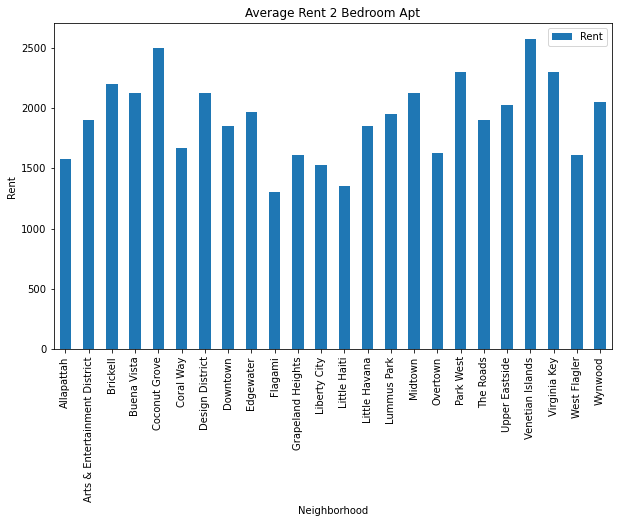

In [276]:
df_data_2.plot(kind='bar', figsize=(10, 6), rot=90) # rotate the xticks(labelled points on x-axis) by 90 degrees

plt.xlabel('Neighborhood')
plt.ylabel('Rent')
plt.title('Average Rent 2 Bedroom Apt')

In [280]:
venue_stats_mia_grouped.set_index('Neighborhood', inplace=True)

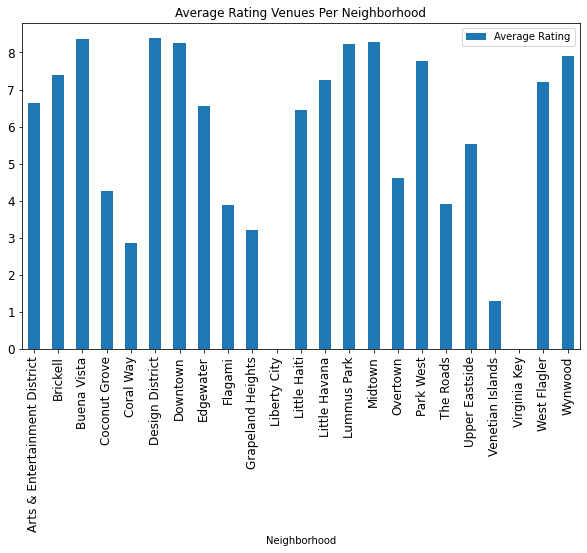

In [364]:
ax = venue_stats_mia_grouped[['Average Rating' ]].plot(kind='bar', title ="Average Rating Venues Per Neighborhood", figsize=(10, 6), legend=True, fontsize=12)